<a href="https://colab.research.google.com/github/huskeypm/herg/blob/main/herg_XF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Porpoise:**This notebooks allows an end-user to reproduce key figures in our hERG manuscript, based on 'feature' sets that have been procured from simulation and sequence analyses. Several statistical and machine learning processes are defined below. 

**Usage:** Hit shift-enter a buncho times to conduct the analyses and generate the corresponding figures.

Many of the analyses use routines that are imported from the herg git project that is cloned below. 

*Contact pkekeneshuskey@luc.edu for support*


Summary of data figures in paper
- Figs 2 and 3 are generated from gnu plot files included with git repo. Comparable data is displayed in [Section 1](#section_1)
- Version of Fig 5 is computed in [Section 1](#section_1)
- Table 1 can be reassembled from code outputs in [Section 2](#section_2)
- Figs 6-9 is based on outputs from [Section 2](#section_2)


Clone python libraries in support of this notebook 

In [107]:
#!git clone https://github.com/huskeypm/herg.git

In [108]:
#!pip3 install pydotplus
#!pip3 install mlxtend


In [109]:
#cd /content/herg


In [110]:
#!git pull 

In [111]:
if 0: 
  from google.colab import drive
  drive.mount('/content/drive')

In [112]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

import matplotlib.pylab as plt
import pandas as pd
import probUtil as dU
import mlUtil
import feature
import numpy as np

#from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, plot_confusion_matrix, plot_roc_curve

from mlxtend.data import iris_data
from sklearn.utils import resample

import os
import math
from math import floor, ceil

# stuff for plotting trees
from six import StringIO
#from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from pandas.plotting import scatter_matrix
import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

from matplotlib import rcParams

Load feature set for PAS domain variants. Features are explained in readme [TODO] . Most features are computed offline and stored in a txt file that is included with the git repo

In [113]:
#dataFile = "feature_sets/features-latest-sets1n2_newFoldX.txt"
dataFile = "feature_sets/features_training.dat"
df = pd.read_csv(dataFile, sep="\s+", comment='#')

In [114]:
# calculate RMSF subsets
regenRMSF=False

if regenRMSF:
    #read a rmsf file to a pandas data frame
    rmsfile = "feature_sets/rmsf-matrix.txt"
    dfrmsf = pd.read_csv(rmsfile, sep="\s+", comment='#')
    dfrmsf.head()

    #extract a subset of rows from rmsf file
    dfrmsf_sub = dfrmsf.loc[89:94,] # actual residues in the sequence 115 to 120 
    dfrmsf_sub2 = dfrmsf.loc[10:15,]# actual residues in the sequence 36 to 41
    dfrmsf_sub3 = dfrmsf.loc[61:66,]# actual residues in the sequence 87 to 92
    dfrmsf_sub4 = dfrmsf.loc[47:52,]# actual residues in the sequence 73 to 78

    #calculate the mean of the rows 89 to 94 for each variant
    dfrmsf_sub_mean = dfrmsf_sub.mean().round(2)
    dfrmsf_sub2_mean = dfrmsf_sub2.mean().round(2)
    dfrmsf_sub3_mean = dfrmsf_sub3.mean().round(2)
    dfrmsf_sub4_mean = dfrmsf_sub4.mean().round(2)

    #dfrmsf_sub_mean
    dfrmsf_sub_mean.shape

    #save the mean of rows 89 to 94 to a file
    dfrmsf_sub_mean.to_csv('feature_sets/rmsf_sub.txt', sep='\t', header=["RMSF115TO120"])
    dfrmsf_sub2_mean.to_csv('feature_sets/rmsf_sub2.txt', sep='\t', header=["RMSF36TO41"])
    dfrmsf_sub3_mean.to_csv('feature_sets/rmsf_sub3.txt', sep='\t', header=["RMSF87TO92"])
    dfrmsf_sub4_mean.to_csv('feature_sets/rmsf_sub4.txt', sep='\t', header=["RMSF73TO78"])

    dfrmsf_sub_mean.columns=['RMSF115TO120']

Load additional features

In [115]:
feature.CalcInitialAA(df,newTag="INITAA")
feature.Calccharge(df,newTag="CHARGE")
feature.Calchydrophobicity(df,newTag='HYDROPHOBICITY') #use feature.py to calculate hydrophobicity (same results as original data file)
rmsf={
    'RMSF36TO41' : 'rmsf_sub2.txt',
    'RMSF87TO92' : 'rmsf_sub3.txt',
    'RMSF73TO78' : 'rmsf_sub4.txt',
    'RMSF115TO120' : 'rmsf_sub.txt'} 
for key,val in rmsf.items():
    print("feature_sets/%s"%val,key)
    feature.CalcRMSFLoc(df,"feature_sets/%s"%val, newTag=key)

# include also APBS and SASASingleSite
feature.CalcAPBS(df,'feature_sets/apbs_training.dat',newTag="APBS")
feature.CalcSASASingleSite(df,'feature_sets/sasaSingleSite_training.dat',newTag="SASASingleSite")



feature_sets/rmsf_sub2.txt RMSF36TO41
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i96v  not found in input list
feature_sets/rmsf_sub3.txt RMSF87TO92
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i96v  not found in input list
feature_sets/rmsf_sub4.txt RMSF73TO78
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i96v  not found in input list
feature_sets/rmsf_sub.txt RMSF115TO120
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i96v  not found in input list
a57t  not found in input list
a57v  not found in input list
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i42l  not found in input list
i42t  not found in input list
i96v  not found in input list
r56k  not found in input list
r56l  not found in input list
s55t  not found in input list
v41f-c3

In [116]:
df

,VARIANT,HELIX,TURNS,COILS,THREE-TEN,BETA,ISOLATED,RMSD,HBONDS,SASA,...,HYDROPHOBICITY,CLASS,TRAFFICKING,INITAA,RMSF36TO41,RMSF87TO92,RMSF73TO78,RMSF115TO120,APBS,SASASingleSite
0,a32t,21.1567,21.2058,14.4202,3.29401,39.6439,0.279349,1.23560,66.7186,6473.83,...,-0.43,1,1,0,1.36,0.80,0.79,1.94,-10837.766667,-4.01359
1,a57p,20.4290,21.8332,14.5935,3.53135,39.4690,0.144014,1.28151,66.0936,6477.76,...,-0.32,0,1,0,1.16,0.75,0.86,1.56,-13412.700000,101.72733
2,a78p,20.8206,21.3096,14.5379,3.19232,39.9190,0.220522,1.12505,65.8526,6479.56,...,-0.32,1,1,0,1.23,0.82,0.85,1.67,-13561.266667,28.40966
3,a85v,20.8686,21.4237,14.6775,3.12031,39.6774,0.232523,1.16450,65.4562,6544.62,...,0.29,1,1,0,1.31,0.87,0.88,1.52,-14364.766667,16.12533
4,c108r,22.1452,21.1476,15.3975,2.75727,38.2283,0.324033,1.58552,62.7131,6753.12,...,-1.84,1,0,1,1.30,0.91,1.14,1.53,-14268.533333,14.51022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,v94g,21.3471,21.1671,14.3579,2.88329,39.9415,0.303030,1.15005,67.0823,6481.89,...,-0.38,1,0,17,1.27,0.93,1.00,1.63,-15318.233333,21.69200
71,wt,19.4789,21.9577,14.7117,3.29257,40.5025,0.056664,1.09132,66.7740,6568.87,...,0.00,0,1,20,1.12,1.35,0.83,1.51,-16051.300130,0.00000
72,y43c,21.0411,21.3291,14.3204,2.88329,40.1875,0.238524,1.14731,65.0498,6467.45,...,0.02,1,0,19,1.48,0.91,0.88,1.59,-13976.300000,54.30720
73,y54h,21.4147,21.2601,14.9385,2.89979,39.3144,0.172517,1.33484,65.8552,6512.28,...,-0.42,1,1,19,1.52,0.87,0.86,1.88,-16184.900000,30.63473


In [117]:
# feature sets
### MD features ###
tagsMD=["WATERS", "HBONDS", "RMSD", "SASA", "HELIX", "TURNS", "COILS", "THREE-TEN", "BETA"]
for key,val in rmsf.items():
      tagsMD+=[key]
tagsMD+=['APBS','SASASingleSite']

### Bioinformatics features ###
tagsBio=["HYDROPHOBICITY", "FOLDX", "CONSERVATION"]

### All features ###
tagsAll=tagsMD+tagsBio


output=['TRAFFICKING']

In [118]:
df.to_csv('./feature_sets/training_data.csv')

Display the first few variants and their corresponding features

### visualize data

array([[<AxesSubplot:xlabel='TRAFFICKING', ylabel='TRAFFICKING'>]],
      dtype=object)

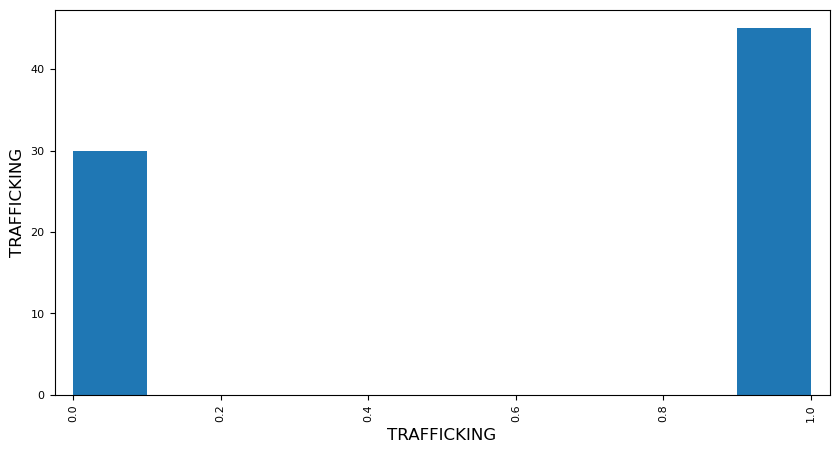

In [119]:
# phenotype distribution of the training dataset
Y=df[['TRAFFICKING']]
scatter_matrix(Y)

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

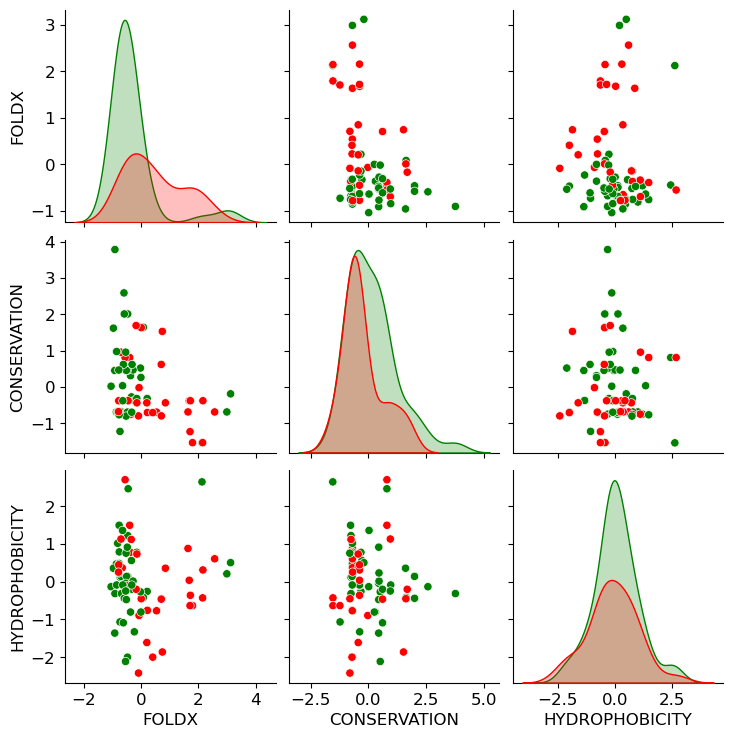

In [120]:
# feature distribution of the bioinformatics features
tagsPlot=tagsBio+['TRAFFICKING']
df_BIO = df[tagsPlot]
df_BIO_zscore=df_BIO.copy()
for col in df_BIO.columns:
    zs=dU.CalcZScore(df_BIO,tag=col)
    df_BIO_zscore[col]=zs
plot = sns.pairplot(df_BIO_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=['FOLDX', 'CONSERVATION', 'HYDROPHOBICITY']) 
plot._legend.remove()
plt.savefig('bioinformatics-data-distribution2.pdf')

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

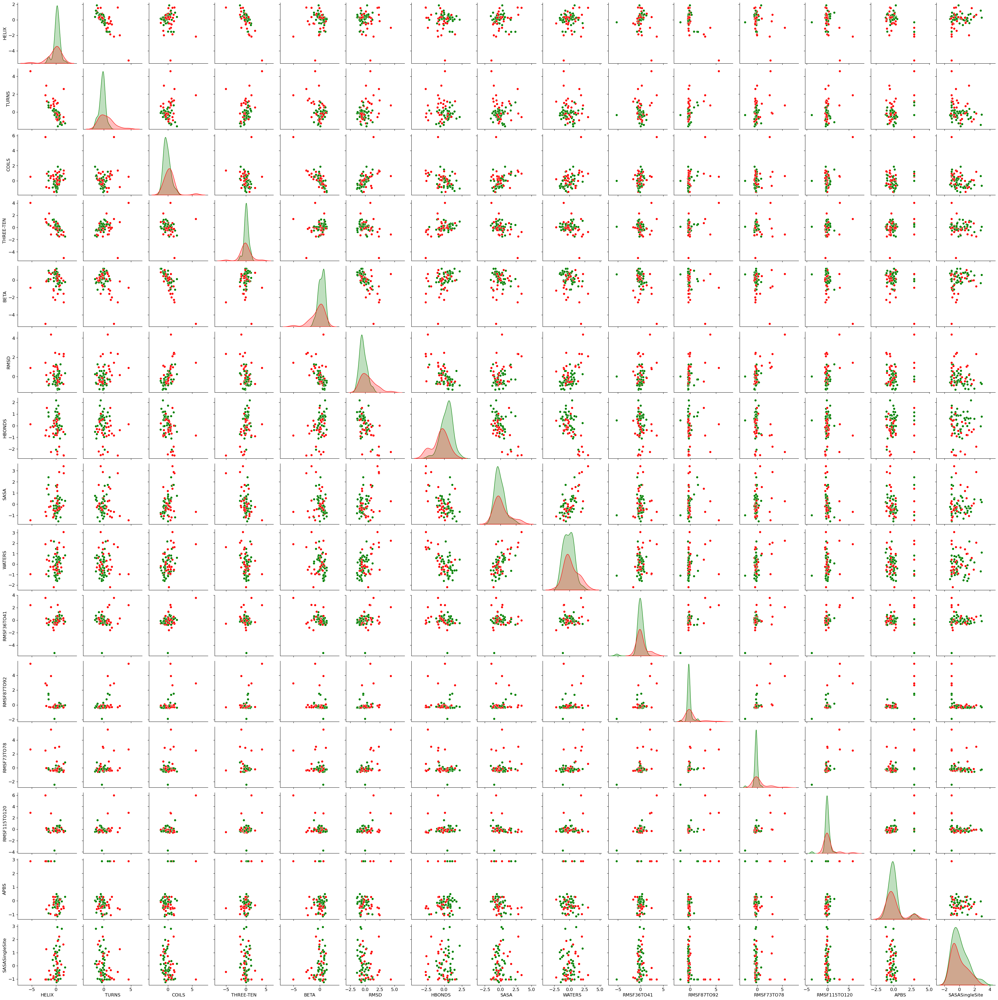

In [121]:
# feature distribution of the MD features
tagsPlot=tagsMD+['TRAFFICKING']
df_MD = df[tagsPlot]
df_MD_zscore=df_MD.copy()
for col in df_MD.columns:
    df_MD_zscore[col]=dU.CalcZScore(df_MD,tag=col)
plot = sns.pairplot(df_MD_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS",'RMSF36TO41','RMSF87TO92','RMSF73TO78','RMSF115TO120','APBS','SASASingleSite']) 
plot._legend.remove()
plt.savefig('md-data-distribution2.pdf')


/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

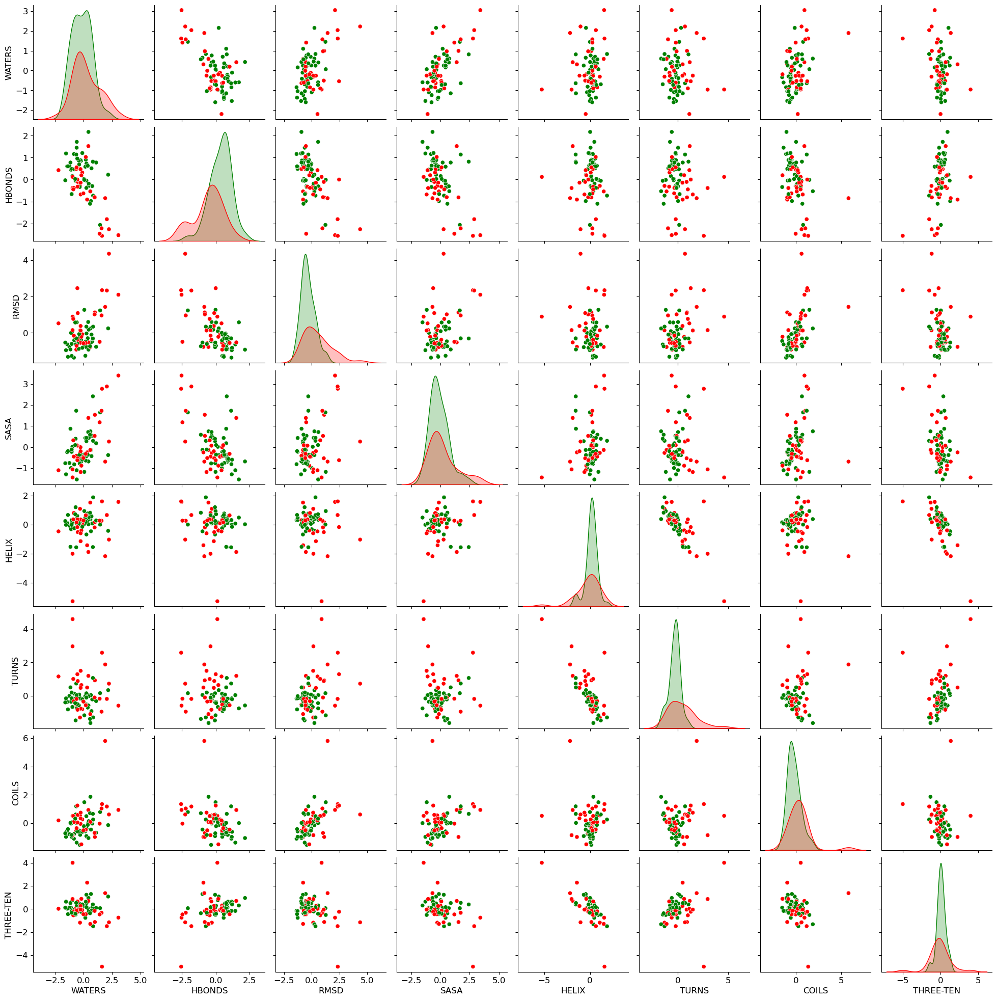

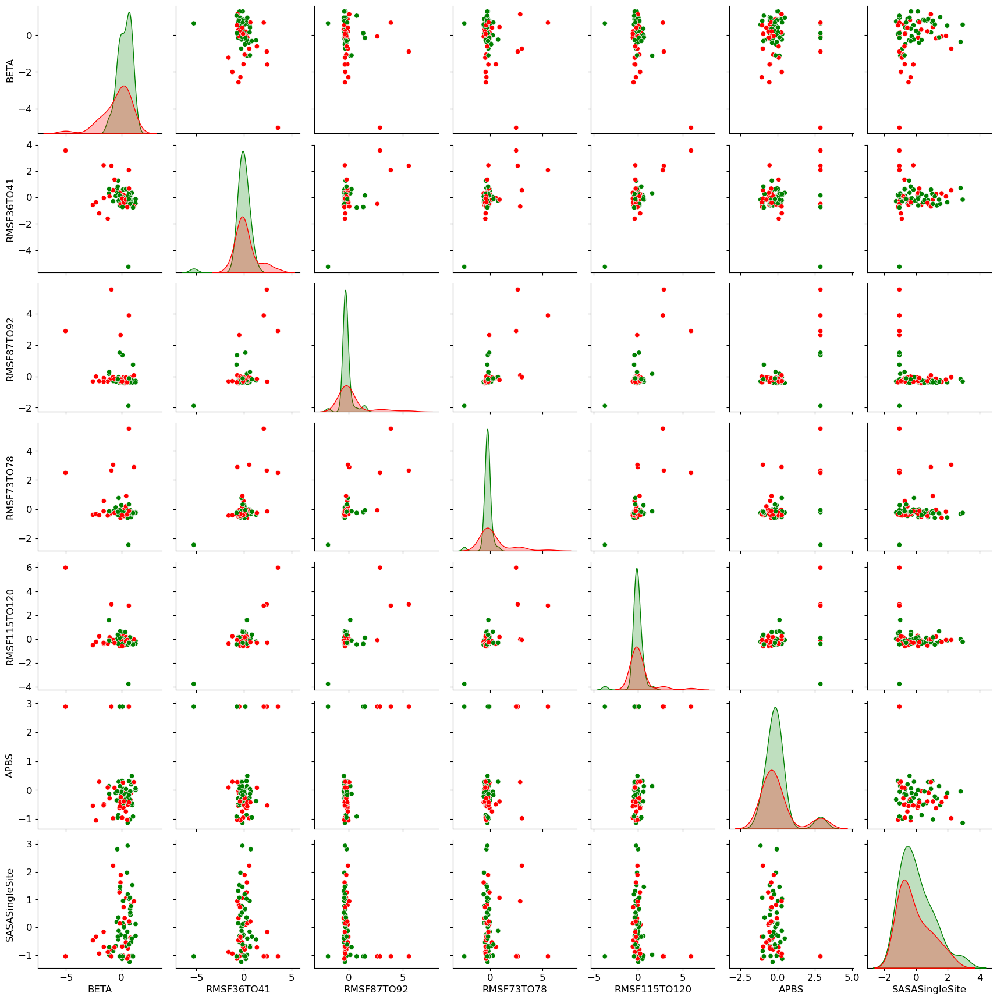

In [122]:
# For paper figs
# split MD feats into two plots
# 1
tagsPlot=tagsMD[:8]+['TRAFFICKING']
df_MD = df[tagsPlot]
df_MD_zscore=df_MD.copy()
for col in df_MD.columns:
    df_MD_zscore[col]=dU.CalcZScore(df_MD,tag=col)
plot = sns.pairplot(df_MD_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=tagsMD[:8]) 
plot._legend.remove()
plt.savefig('md-data-distribution2_1.pdf')

# 2
tagsPlot=tagsMD[8:]+['TRAFFICKING']
df_MD = df[tagsPlot]
df_MD_zscore=df_MD.copy()
for col in df_MD.columns:
    df_MD_zscore[col]=dU.CalcZScore(df_MD,tag=col)
plot = sns.pairplot(df_MD_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=tagsMD[8:]) 
plot._legend.remove()
plt.savefig('md-data-distribution2_2.pdf')

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

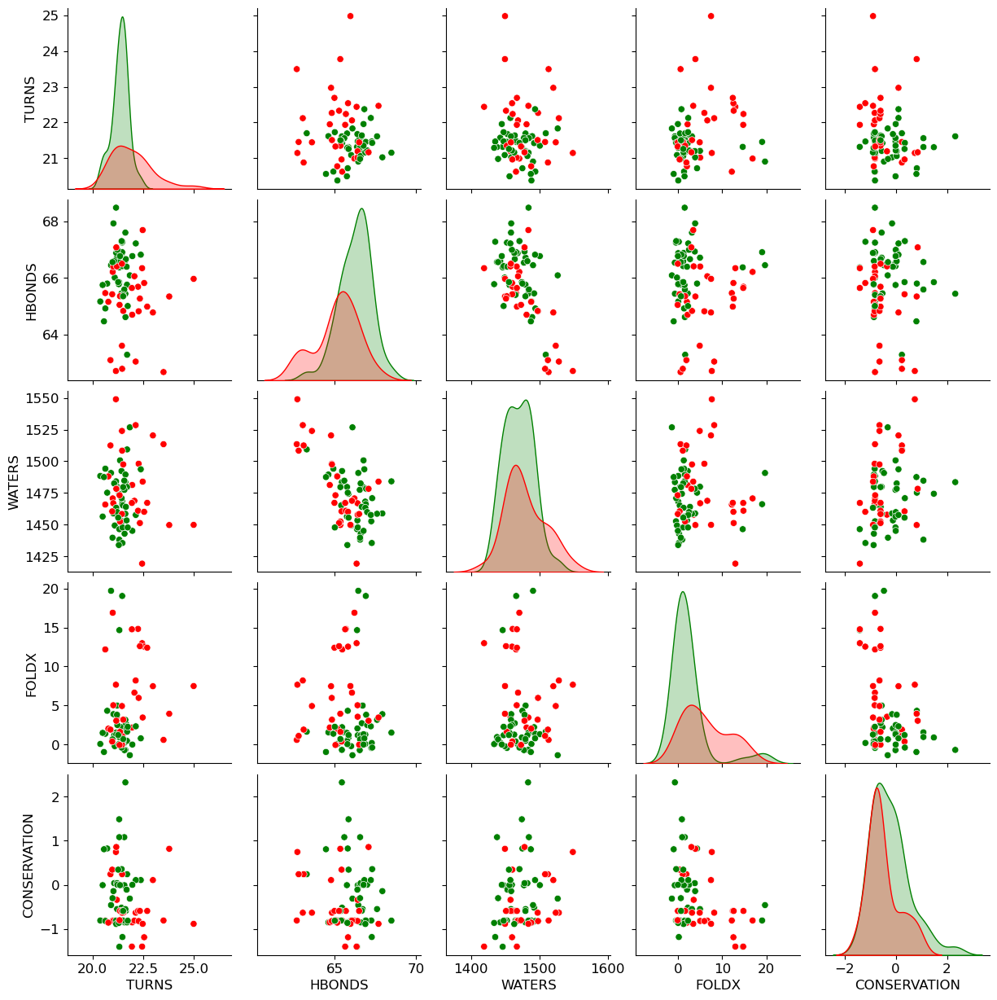

In [123]:
df_best = df[["TURNS","HBONDS","WATERS", "FOLDX", "CONSERVATION", "TRAFFICKING"]]
df_best_zscore=df_best.copy()
for col in df_best.columns:
    df_best_zscore[col]=dU.CalcZScore(df_best,tag=col)
plot = sns.pairplot(df_best, hue='TRAFFICKING', palette=['Red', 'Green'],vars=["TURNS","HBONDS","WATERS", "FOLDX", "CONSERVATION"]) 
plot._legend.remove()
plt.savefig('best-data-distribution2.pdf')


In [124]:
display=True  
random_state=50
rcParams['figure.dpi']=100

### Section 1: Build and Apply probabilistic classifier 

<a id=’section_1’></a>
[UNDER CONSTRUCTION]
Defines a conditional probability (see methods in the hERG paper) for each feature that represents the likelihood a variant is nontrafficking if its feature value is above some value. 

Displays 
- distribution of variants according to a given feature (converted to z-scores). Green are trafficking; red are non-trafficking. 
- All conditional probs are shown in one graph (Cond. probability)
- ROC curve gives the true and false positive rates for identifying a non-trafficking variant. 
- Also shown is a plot for the true/false positive/negative rates, but this is currently INCORRECT

Prints out
- indi_condprob_md.pdf; 
- roc_conditional_probability 
in the local file directory.

In [125]:
mlData={}
clfs=['prob','DT','RF','SVM']

In [126]:
mlData['prob']={}

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

Bootstrap with  500


/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

AUC:  0.7342133177760055
       accT     precT      recT       f1T       acc      prec       rec  \
0  0.565217  0.545455  1.000000  0.705882  0.565217  1.000000  0.090909   
1  0.565217  0.785714  0.611111  0.687500  0.565217  0.222222  0.400000   
2  0.478261  0.500000  0.833333  0.625000  0.478261  0.333333  0.090909   
3  0.565217  0.545455  1.000000  0.705882  0.565217  1.000000  0.090909   
4  0.739130  0.777778  0.875000  0.823529  0.739130  0.600000  0.428571   

         f1  AccTraining  AccTesting  
0  0.166667     0.673077    0.565217  
1  0.285714     0.673077    0.565217  
2  0.142857     0.769231    0.478261  
3  0.166667     0.788462    0.565217  
4  0.500000     0.788462    0.739130  
accT avg:  0.6405217391304362
precT avg:  0.6428479678421967
recT avg:  0.9209750920304329
f1T avg:  0.749310966637897
acc avg:  0.6405217391304362
prec avg:  0.6529000610500612
rec avg:  0.23390302475302485
f1 avg:  0.31391439324648424
AccTraining avg:  0.6976153846153813
AccTesting avg: 

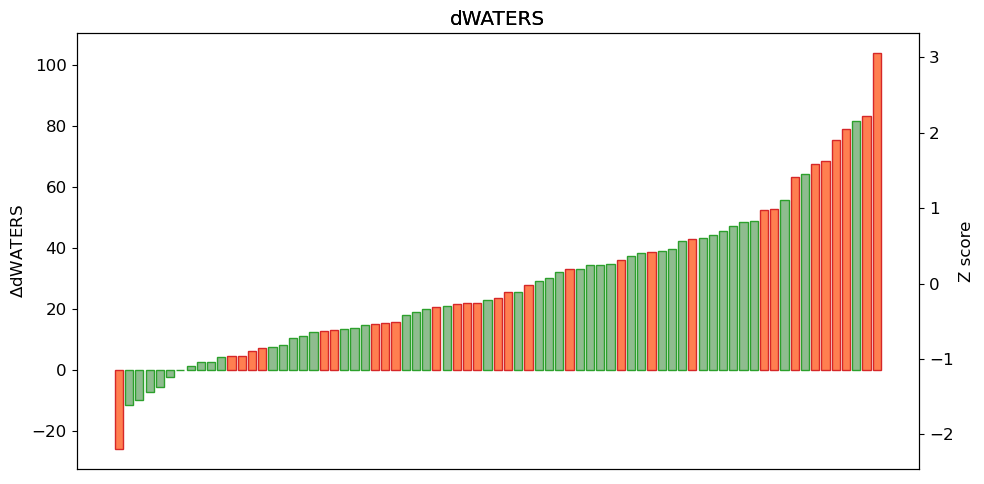

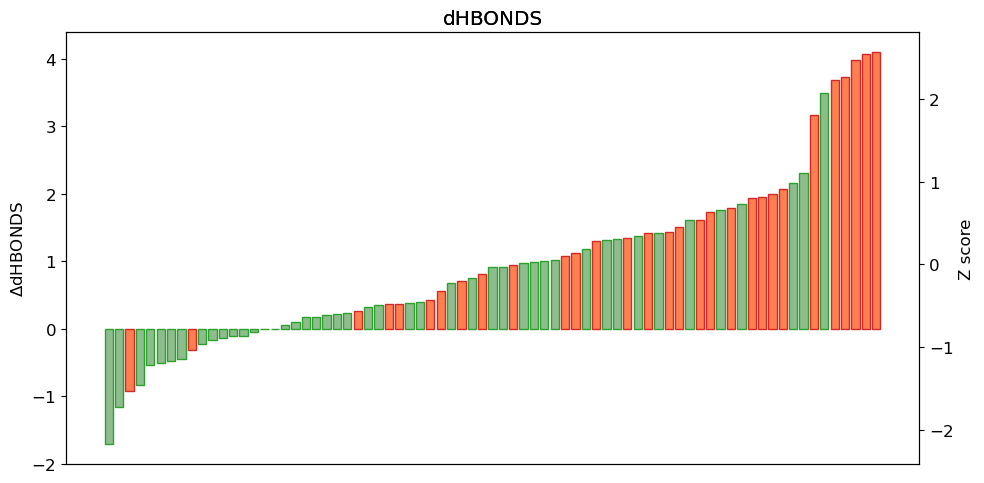

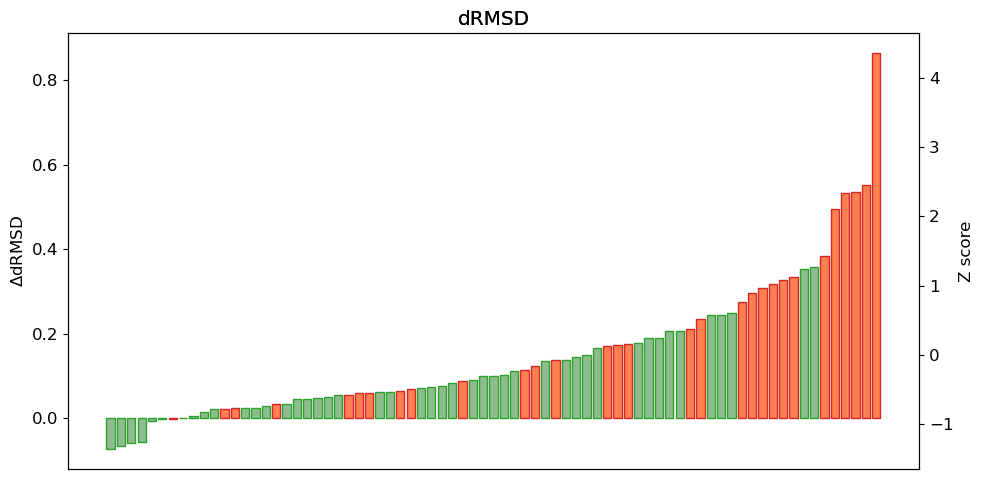

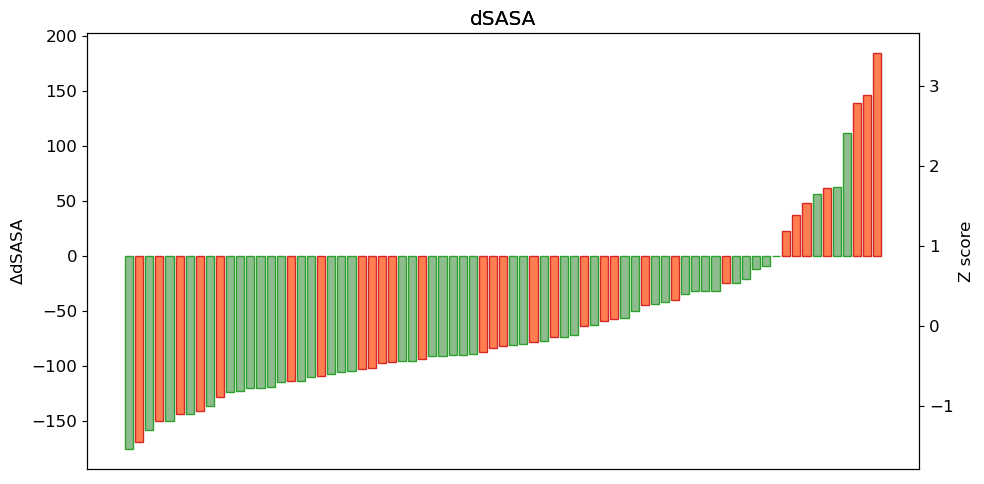

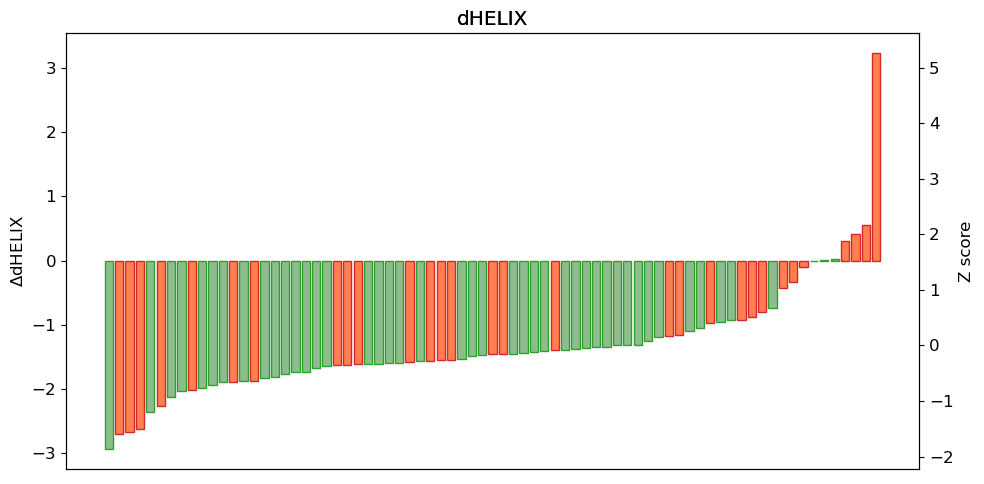

...

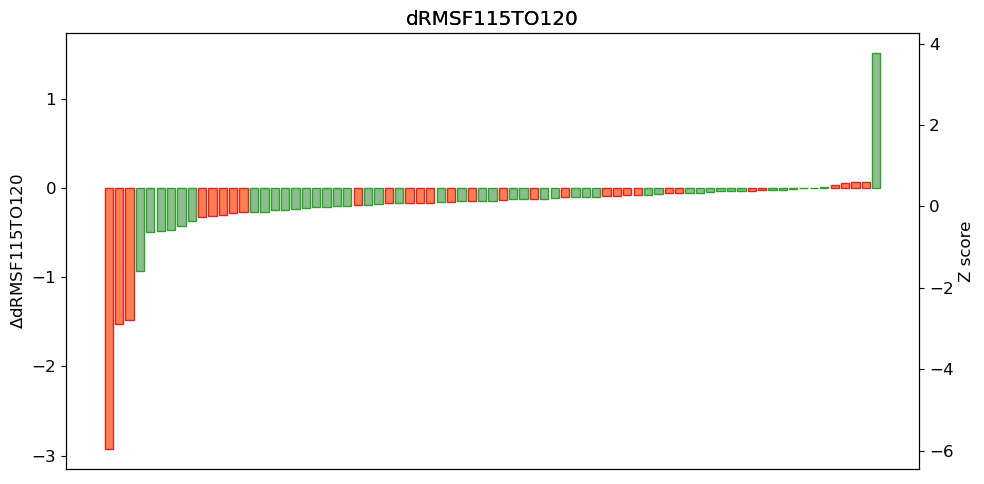

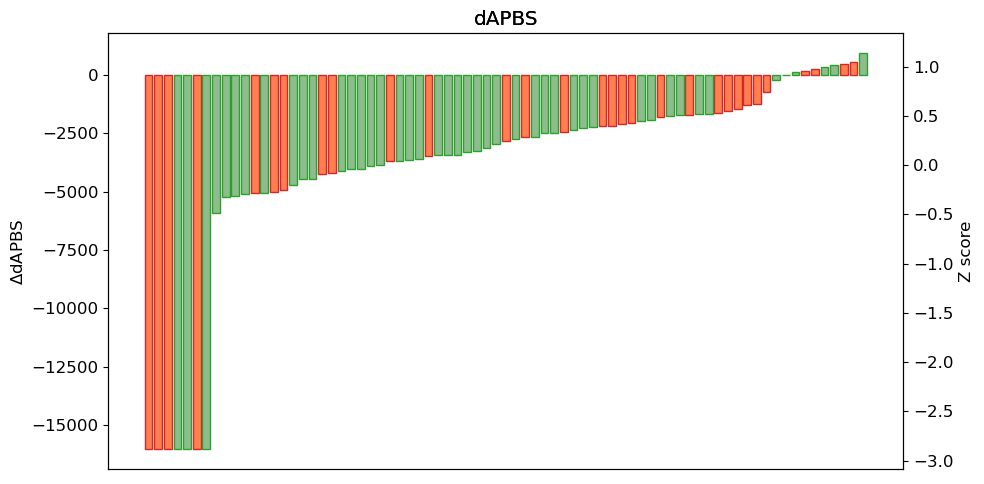

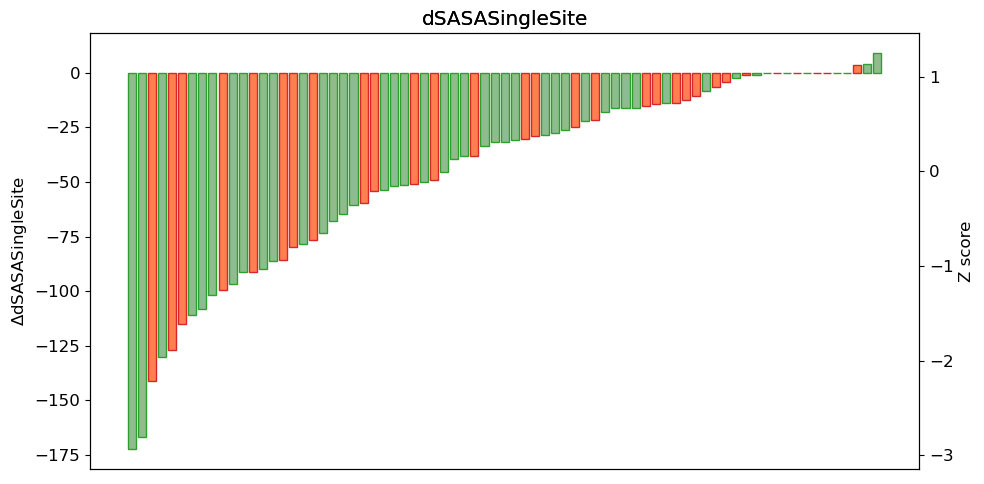

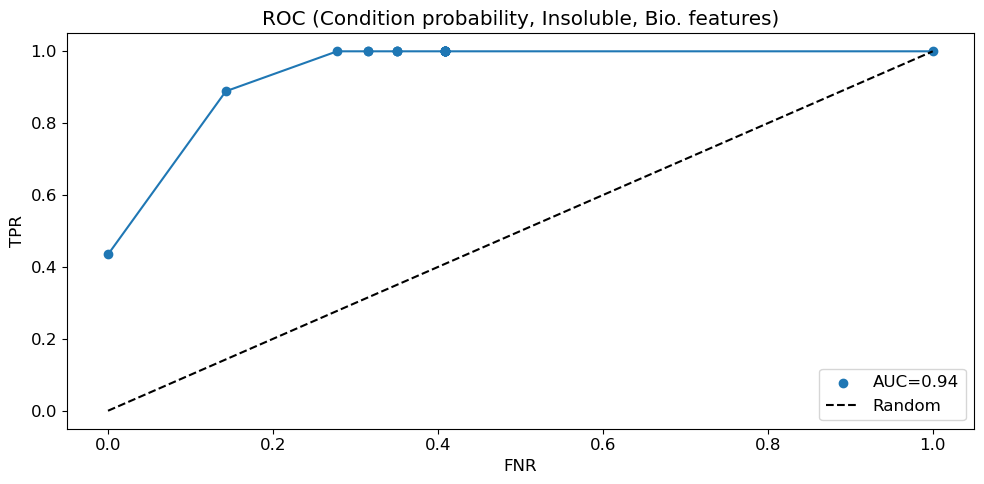

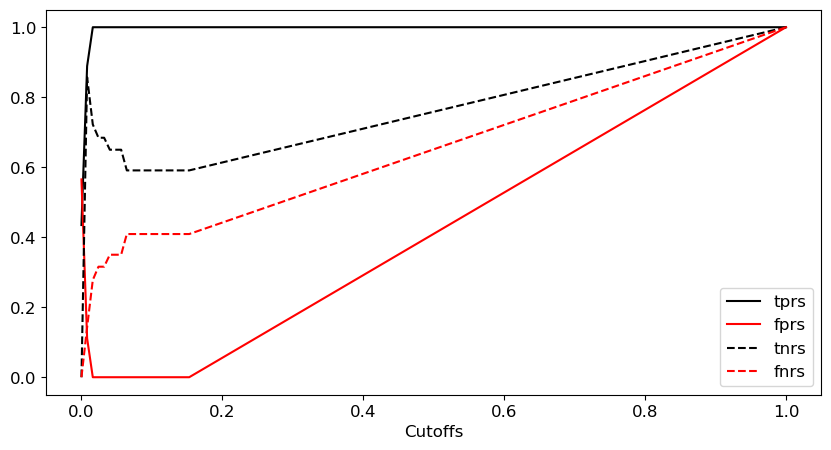

In [127]:
# MD features
outputs = dU.ProbClassifier(df,tagsMD,display=display,split=True,bootstrap=True)
mlData['prob']['MD']=outputs

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnu

TESTING  stats
Accuracy(NT) 0.782608695652174
Precision(NT) 1.0
Recall(NT) 0.4444444444444444
F1 score(NT) 0.6153846153846154
Accuracy(T) 0.782608695652174
Precision(T) 0.7368421052631579
Recall(T) 1.0
F1 score(T) 0.8484848484848485


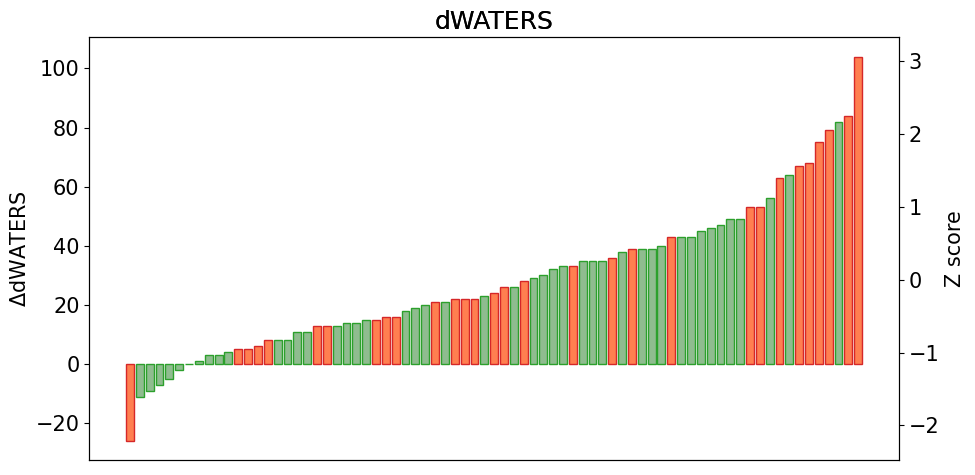

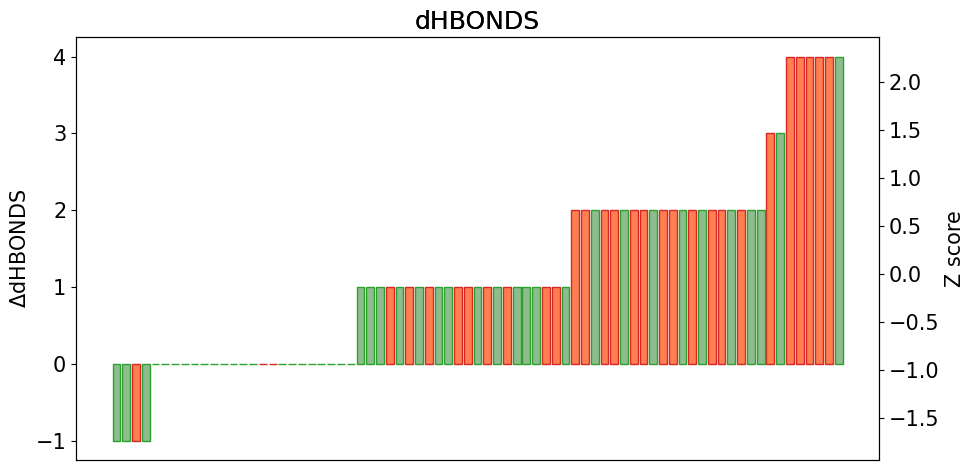

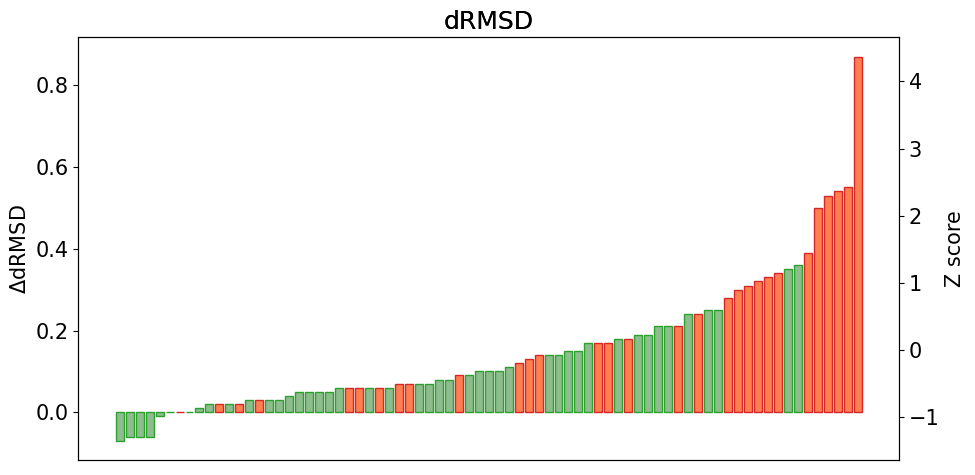

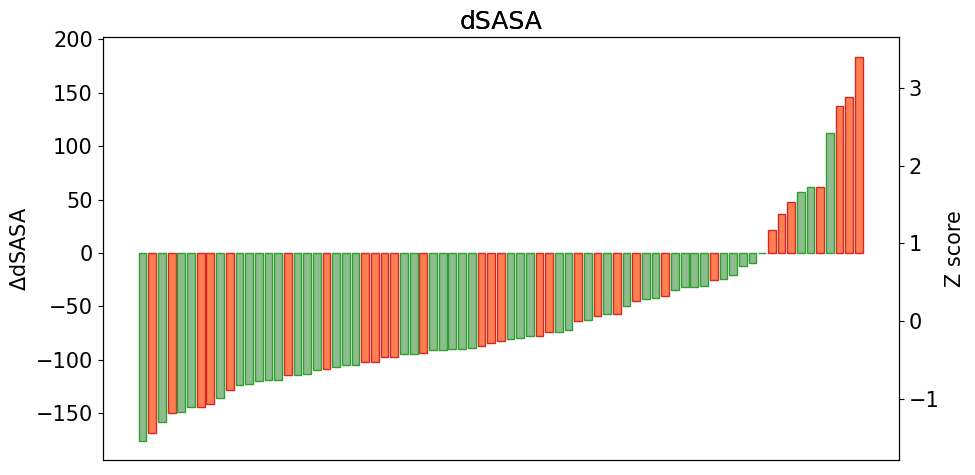

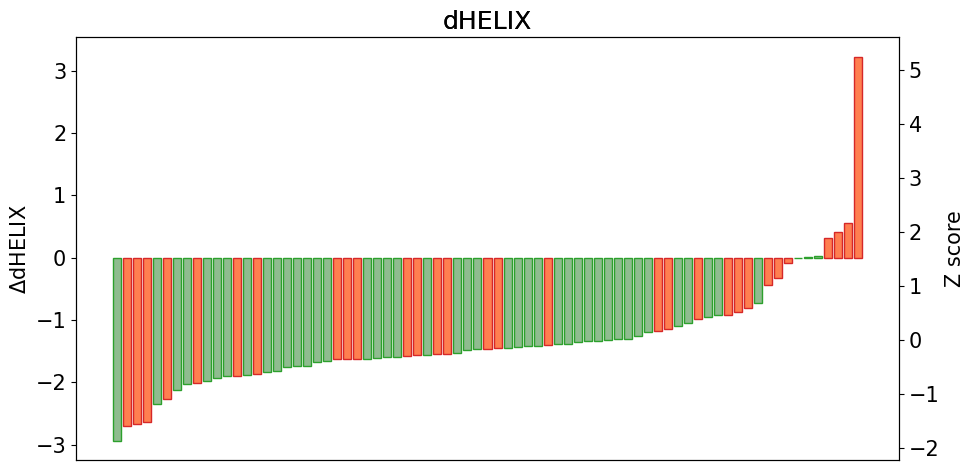

...

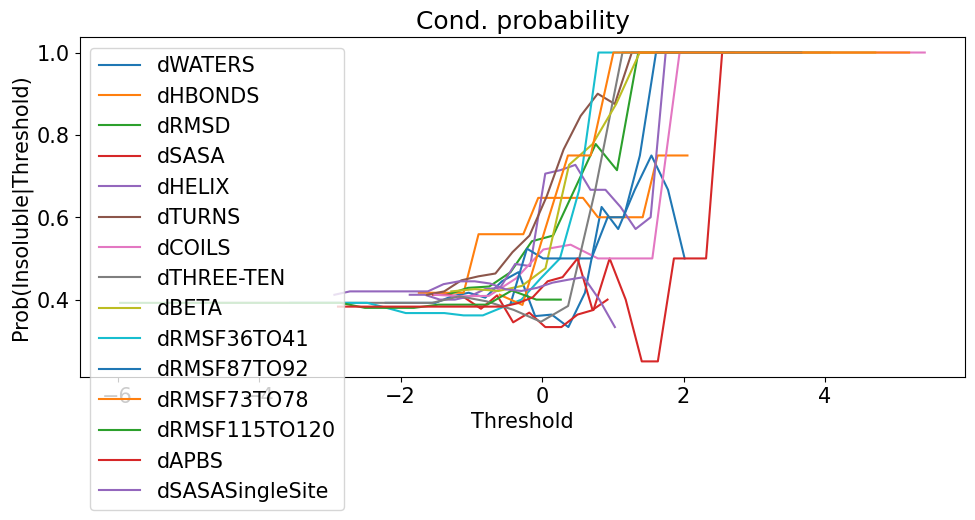

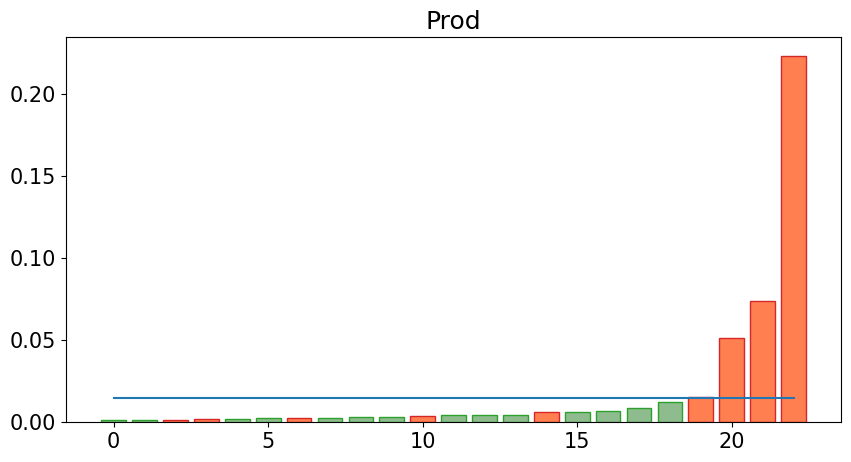

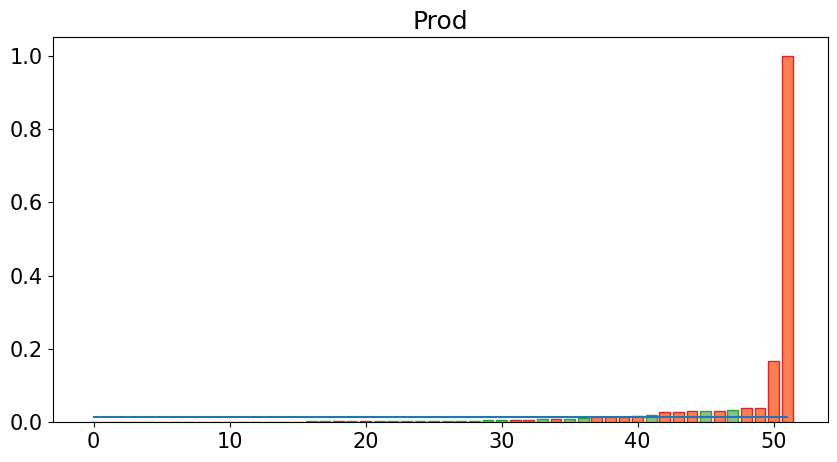

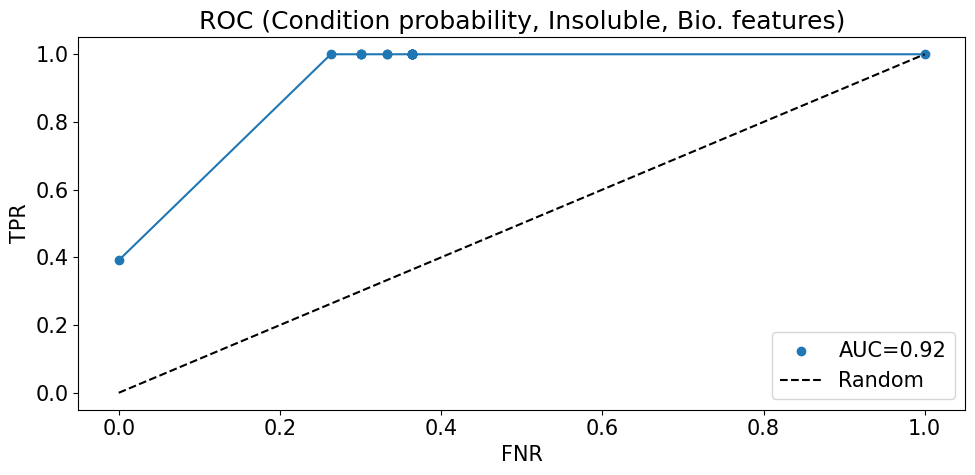

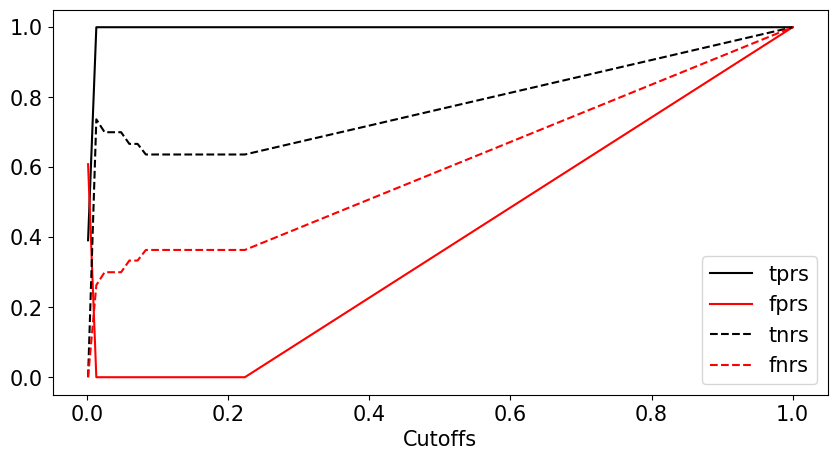

In [175]:
# MD features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsMD,display=display,split=True,bootstrap=False)

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


Bootstrap with  500


/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

AUC:  0.5725389113418325
       accT     precT      recT       f1T       acc      prec       rec  \
0  0.304348  0.333333  0.066667  0.111111  0.304348  0.300000  0.750000   
1  0.304348  1.000000  0.058824  0.111111  0.304348  0.272727  1.000000   
2  0.304348  0.000000  0.000000  0.000000  0.304348  0.333333  0.777778   
3  0.521739  0.666667  0.166667  0.266667  0.521739  0.500000  0.909091   
4  0.391304  0.250000  0.083333  0.125000  0.391304  0.421053  0.727273   

         f1  AccTraining  AccTesting  
0  0.428571     0.442308    0.304348  
1  0.428571     0.461538    0.304348  
2  0.466667     0.480769    0.304348  
3  0.645161     0.384615    0.521739  
4  0.533333     0.461538    0.391304  
accT avg:  0.3870434782608714
precT avg:  0.34387460317460333
recT avg:  0.046398252031765945
f1T avg:  0.0765120246559202
acc avg:  0.3870434782608714
prec avg:  0.3857000638123645
rec avg:  0.9072315018315026
f1 avg:  0.534256287573707
AccTraining avg:  0.4364615384615384
AccTesting avg:

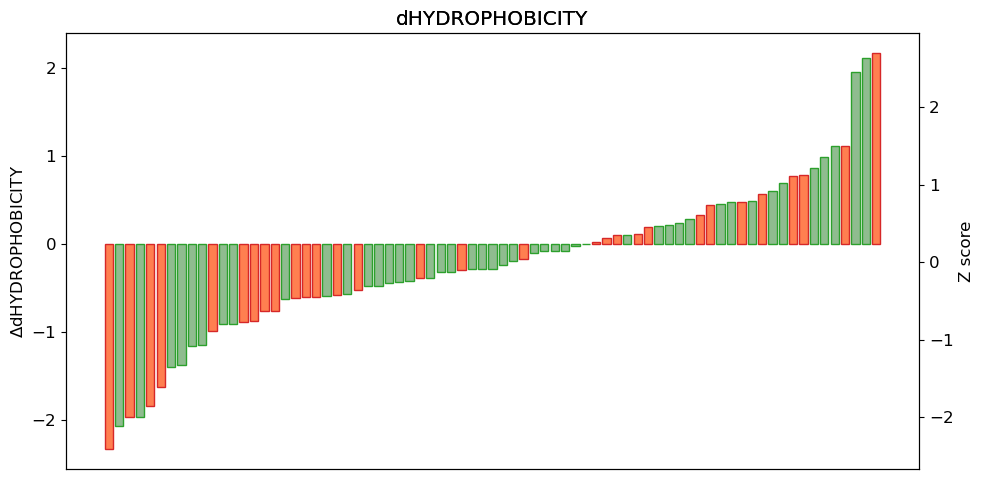

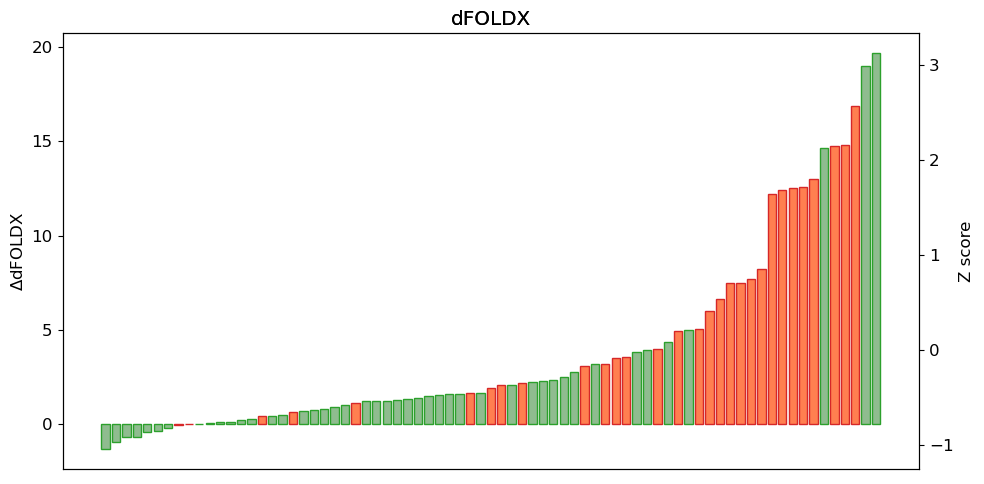

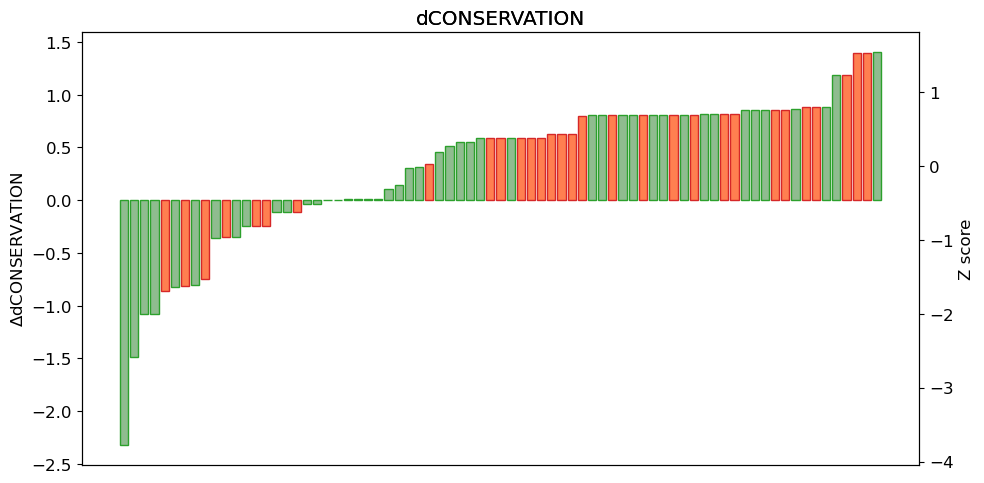

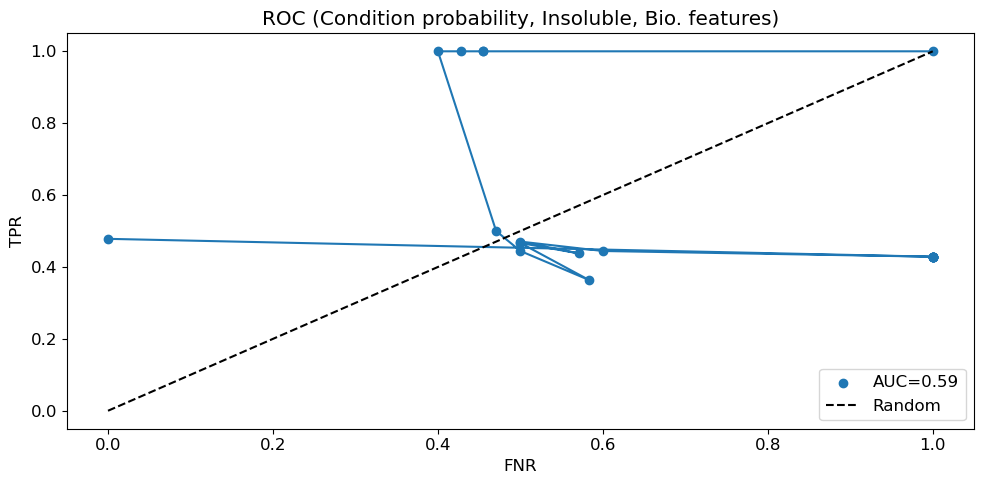

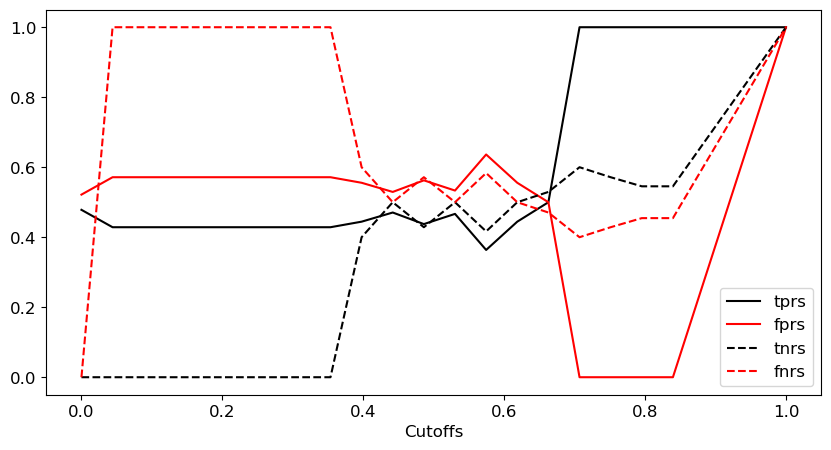

In [129]:
# Bioinformatics features
outputs = dU.ProbClassifier(df,tagsBio,display=display,split=True,bootstrap=True)
mlData['prob']['Bio']=outputs

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


TESTING  stats
Accuracy(NT) 0.43478260869565216
Precision(NT) 0.4090909090909091
Recall(NT) 1.0
F1 score(NT) 0.5806451612903226
Accuracy(T) 0.43478260869565216
Precision(T) 1.0
Recall(T) 0.07142857142857142
F1 score(T) 0.13333333333333333


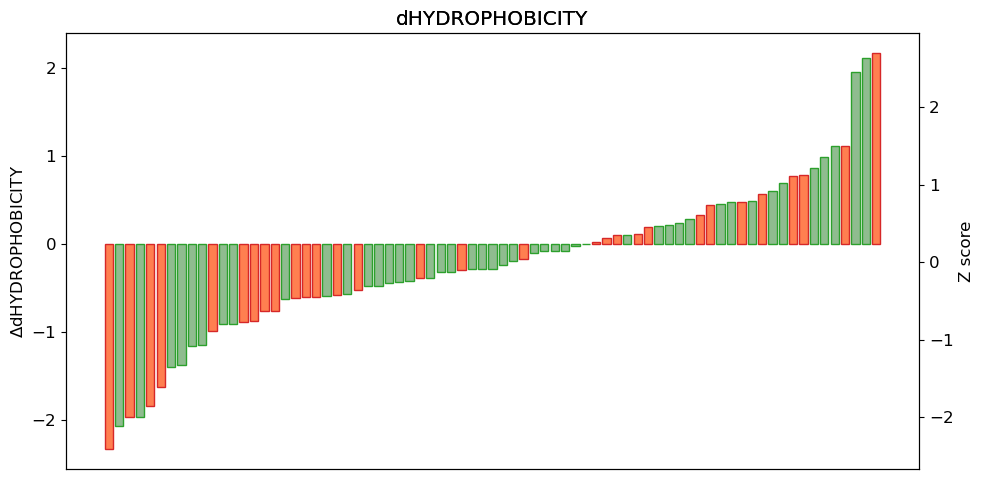

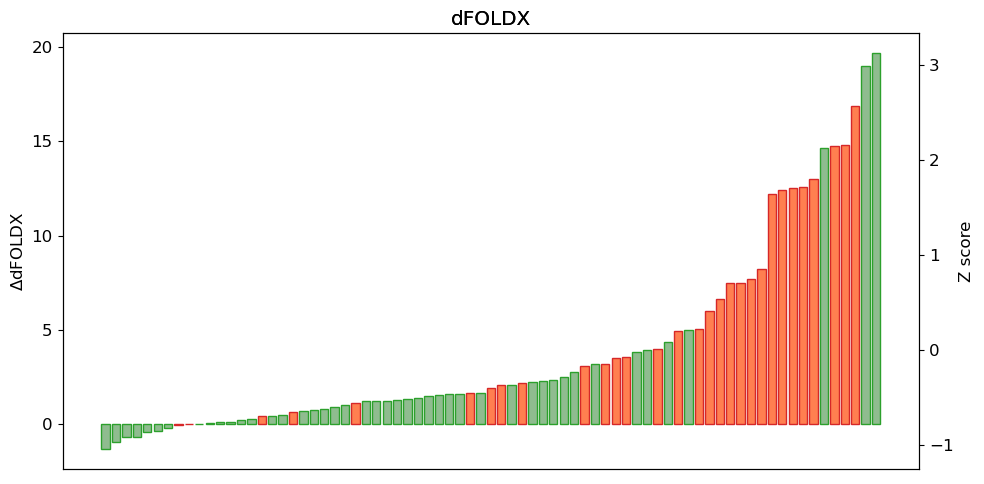

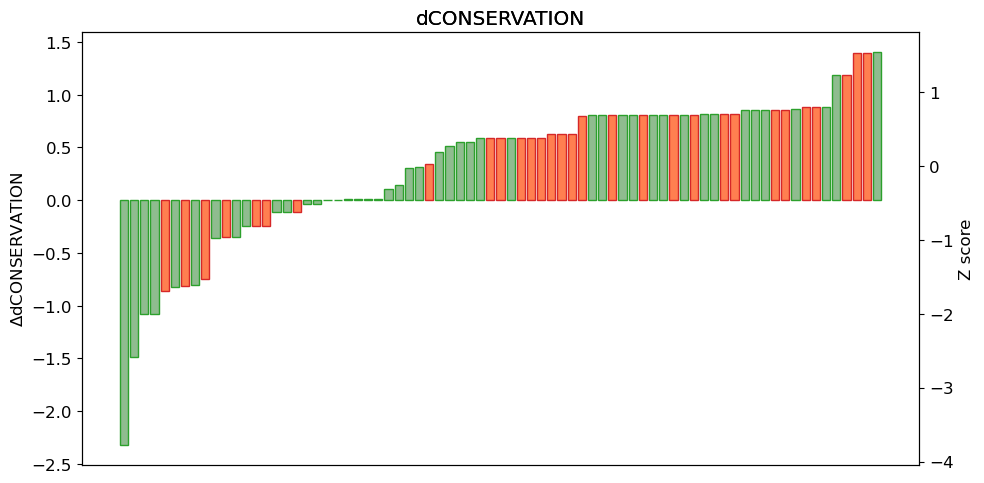

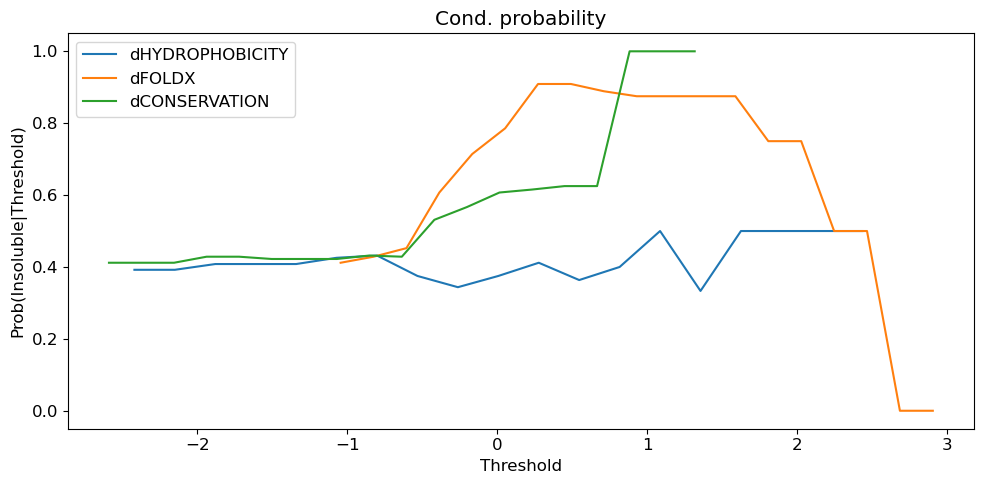

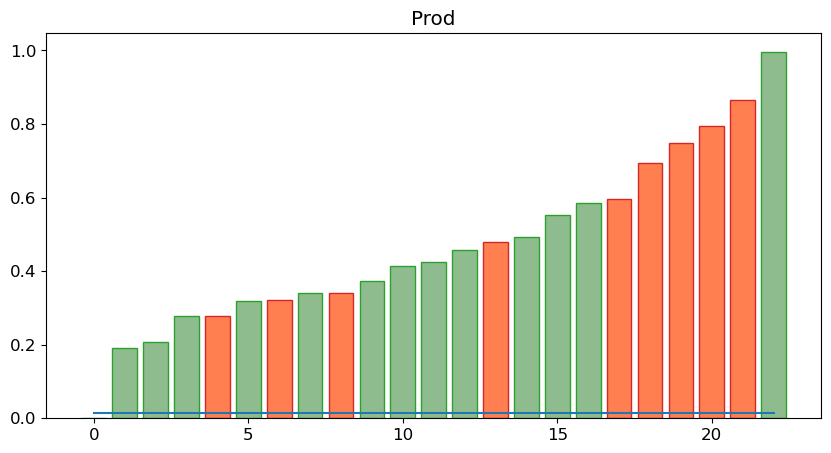

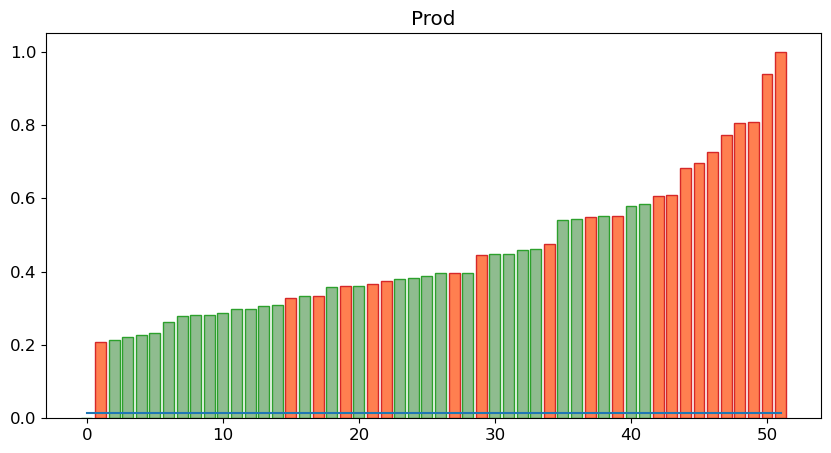

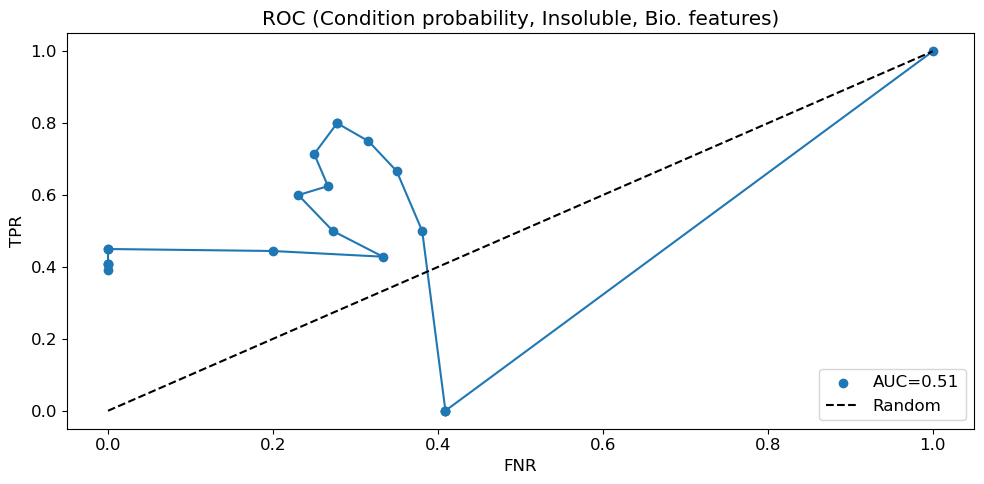

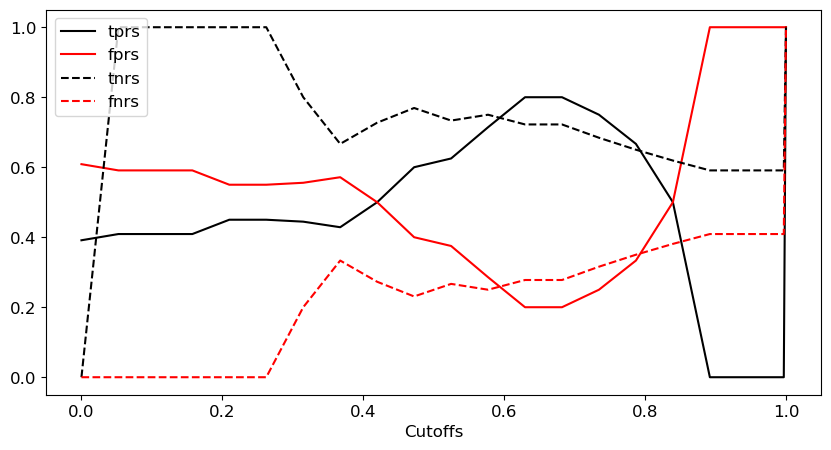

In [130]:
# Bio features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsBio,display=display,split=True,bootstrap=False)

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

Bootstrap with  500


/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  statsdf = statsdf.append(dfn)
/home/xfang2/repos/herg/probUtil.py:482: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

AUC:  0.7770923076551467
       accT     precT      recT       f1T       acc      prec       rec  \
0  0.695652  0.666667  1.000000  0.800000  0.695652  1.000000  0.222222   
1  0.608696  0.600000  0.923077  0.727273  0.608696  0.666667  0.200000   
2  0.652174  0.636364  1.000000  0.777778  0.652174  1.000000  0.111111   
3  0.695652  0.650000  1.000000  0.787879  0.695652  1.000000  0.300000   
4  0.565217  0.565217  1.000000  0.722222  0.565217  0.000000  0.000000   

         f1  AccTraining  AccTesting  
0  0.363636     0.653846    0.695652  
1  0.307692     0.692308    0.608696  
2  0.200000     0.711538    0.652174  
3  0.461538     0.673077    0.695652  
4  0.000000     0.692308    0.565217  
accT avg:  0.667739130434785
precT avg:  0.6620919966910336
recT avg:  0.9445797060782357
f1T avg:  0.7717906106995527
acc avg:  0.667739130434785
prec avg:  0.708144011544012
rec avg:  0.2565635475635479
f1 avg:  0.3483670554591613
AccTraining avg:  0.7148076923076893
AccTesting avg:  0.6

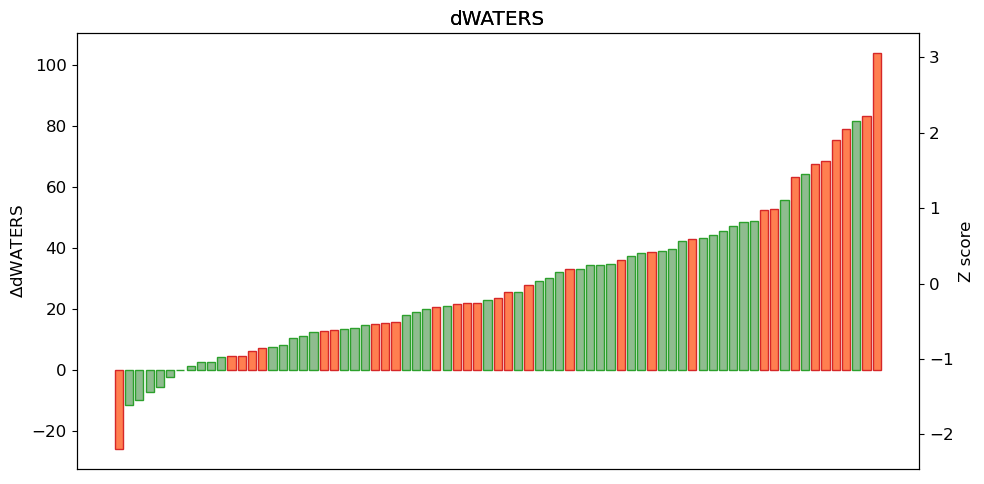

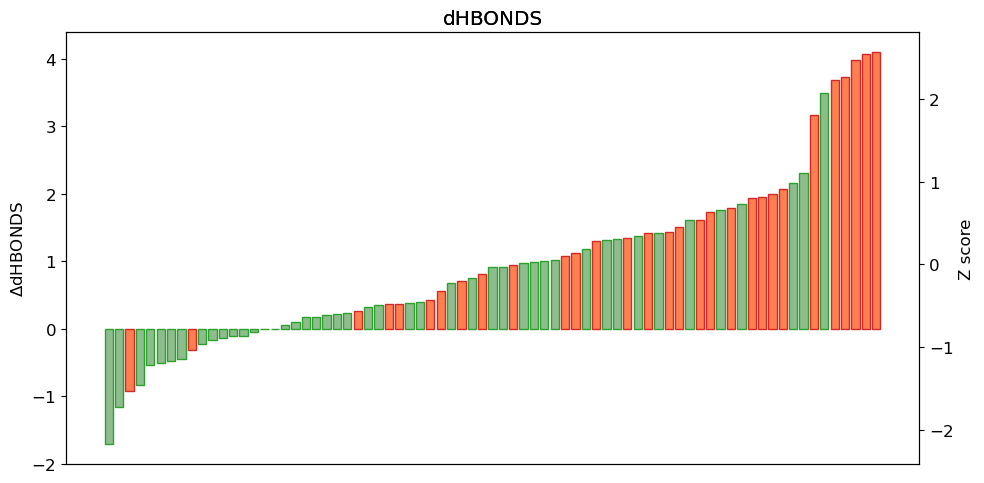

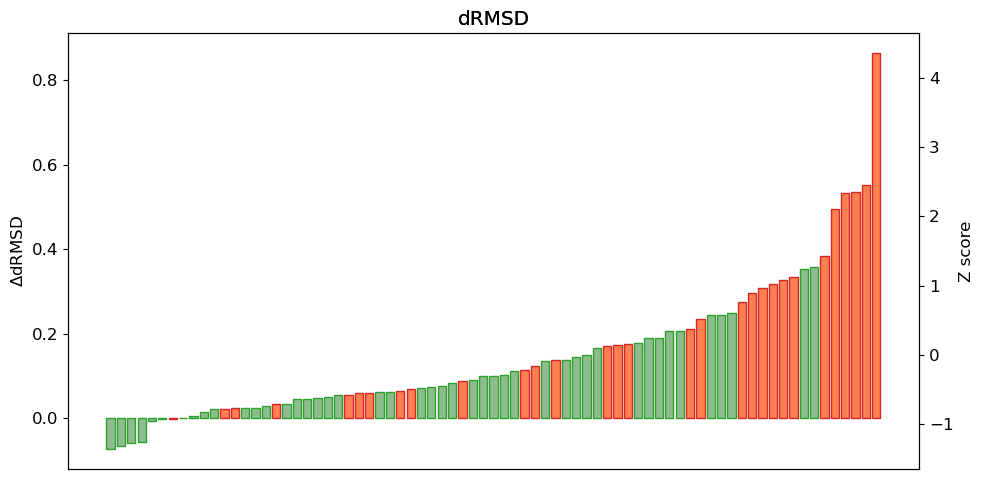

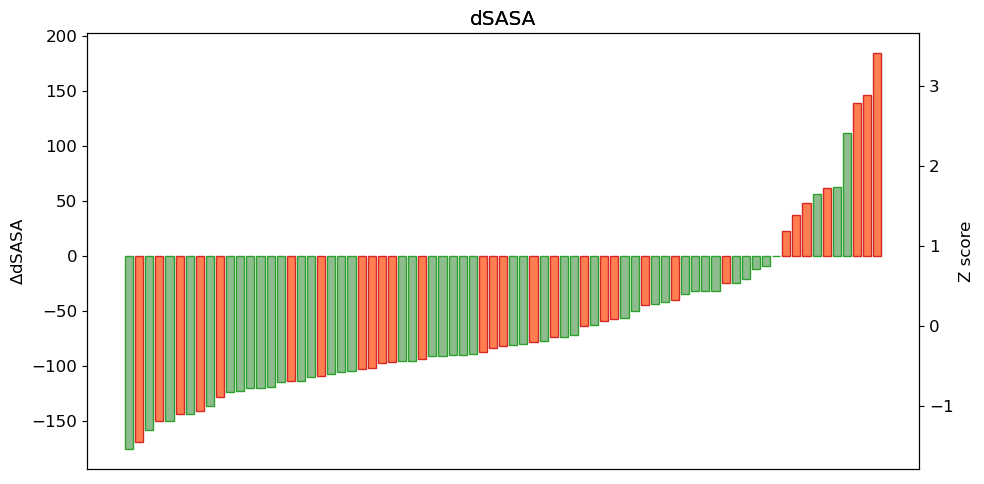

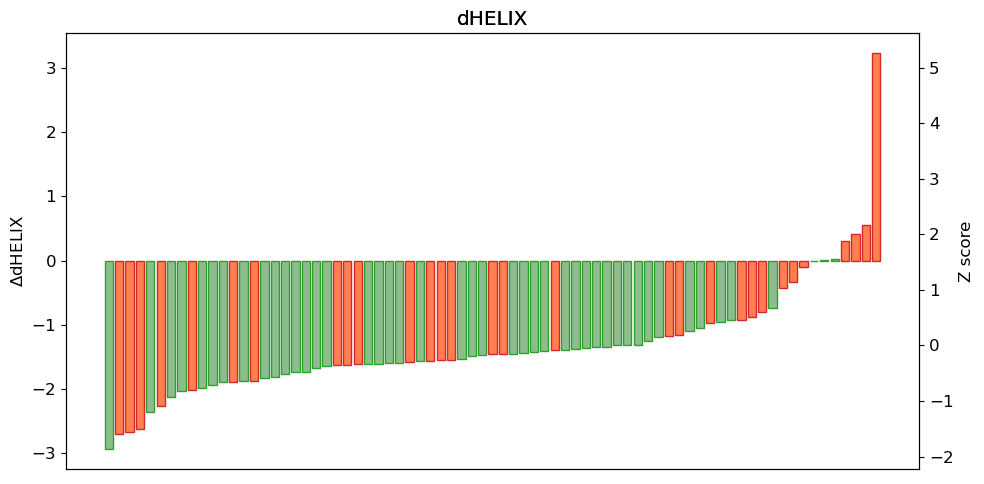

...

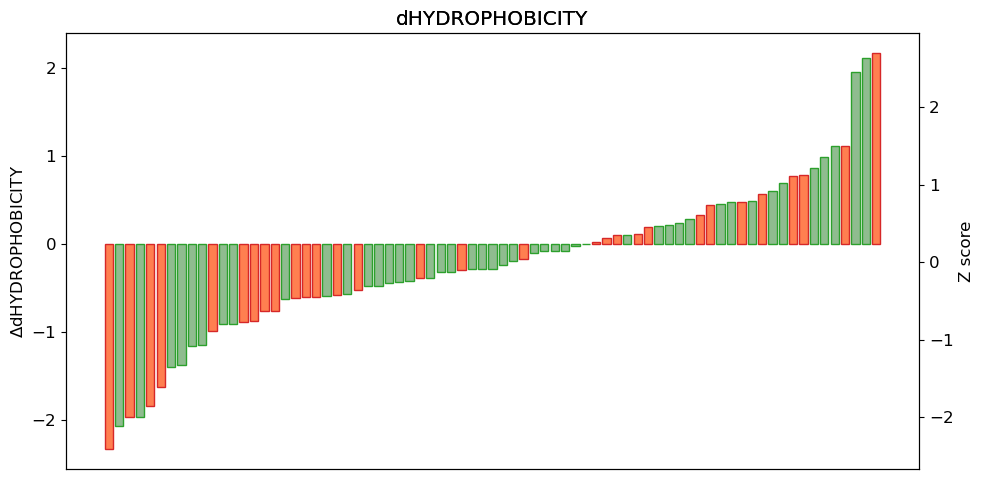

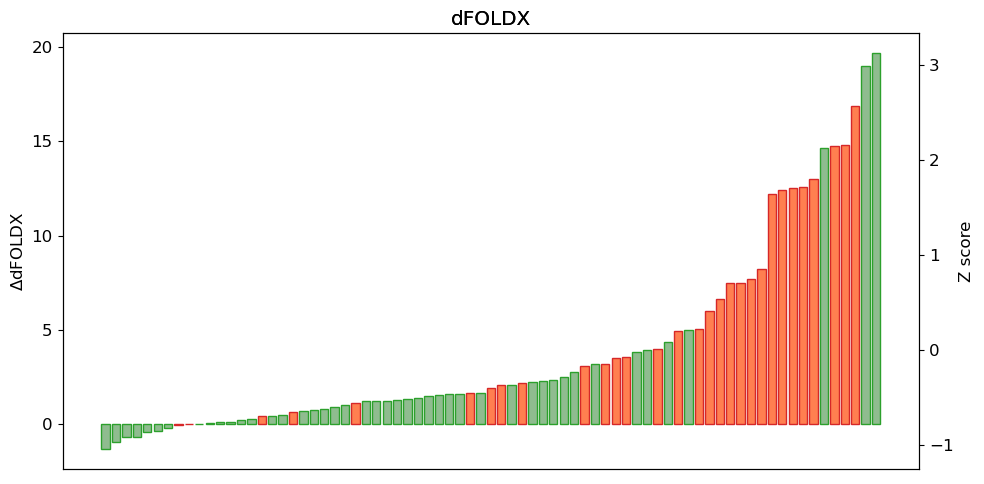

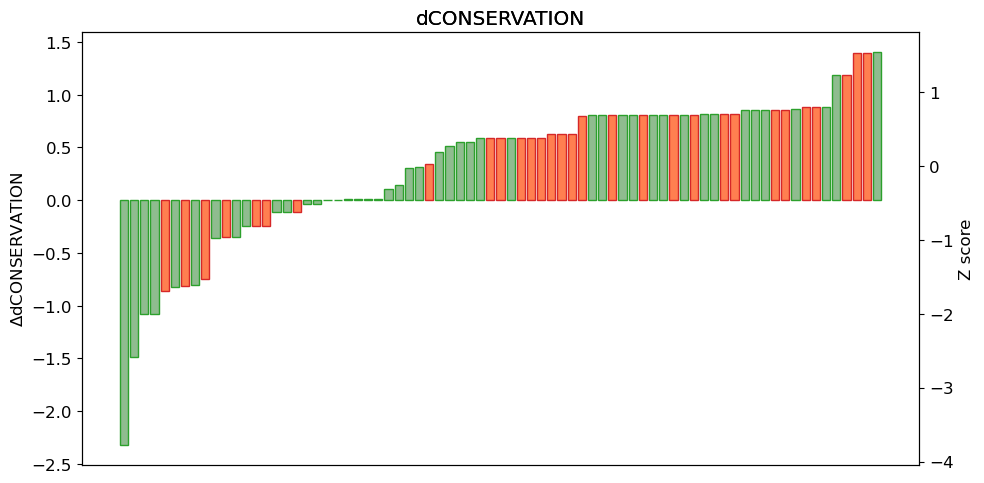

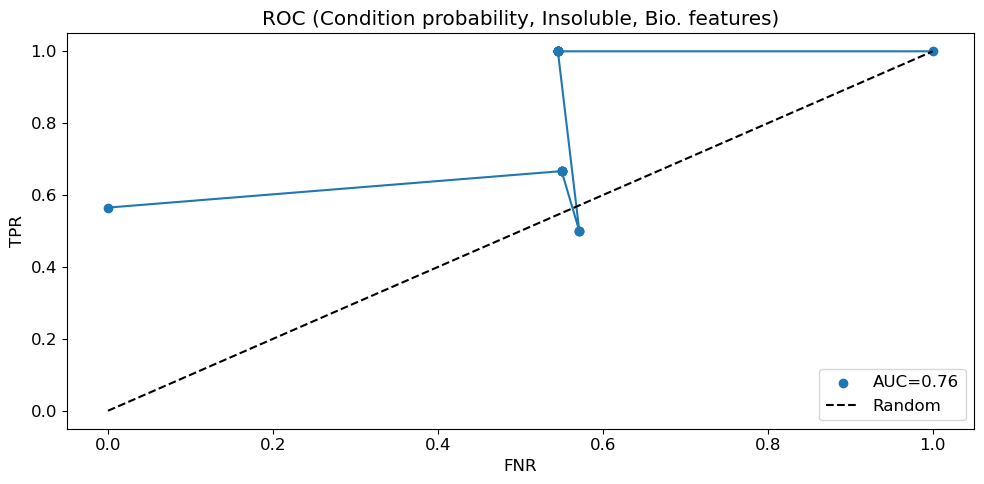

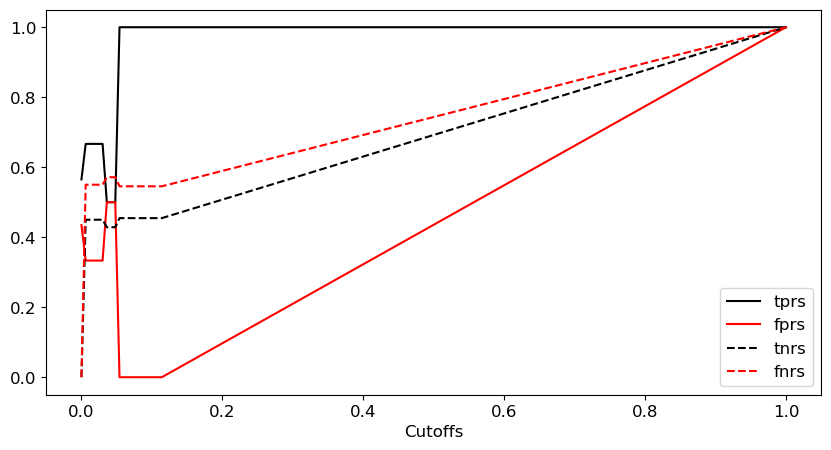

In [131]:
# All features
outputs = dU.ProbClassifier(df,tagsAll,display=display,split=True,bootstrap=True)
mlData['prob']['All']=outputs

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

TESTING  stats
Accuracy(NT) 0.782608695652174
Precision(NT) 1.0
Recall(NT) 0.4444444444444444
F1 score(NT) 0.6153846153846154
Accuracy(T) 0.782608695652174
Precision(T) 0.7368421052631579
Recall(T) 1.0
F1 score(T) 0.8484848484848485


/home/xfang2/repos/herg/probUtil.py:250: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


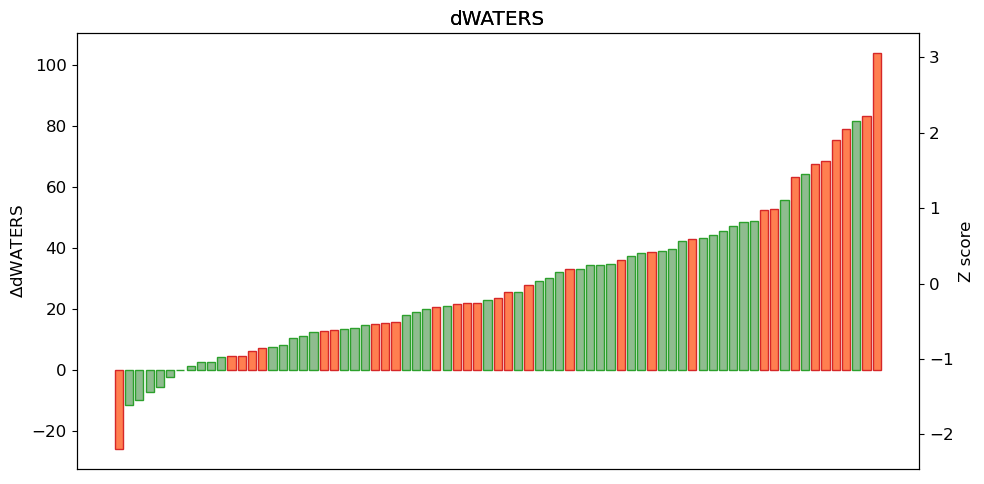

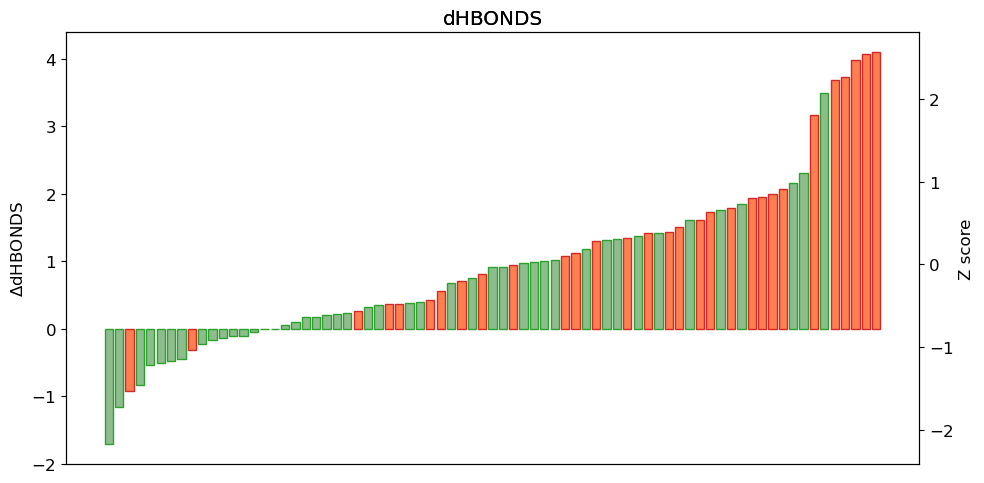

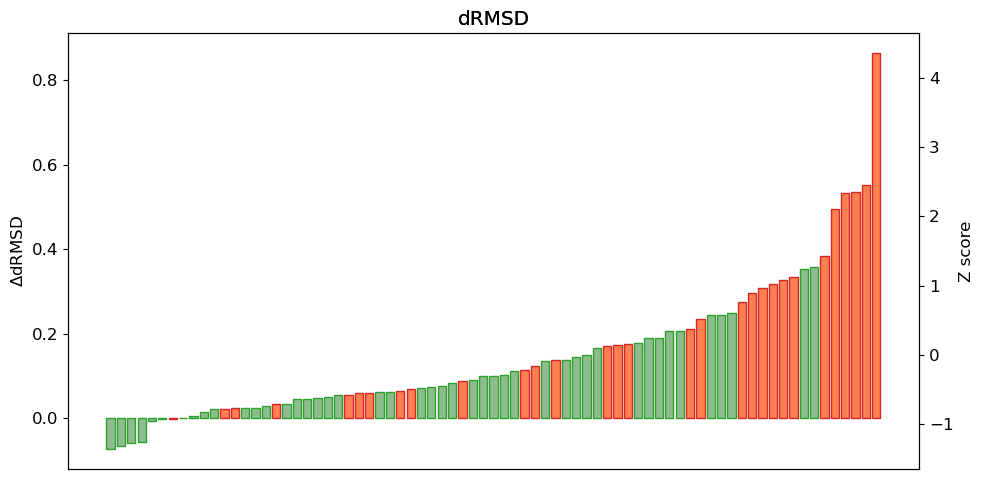

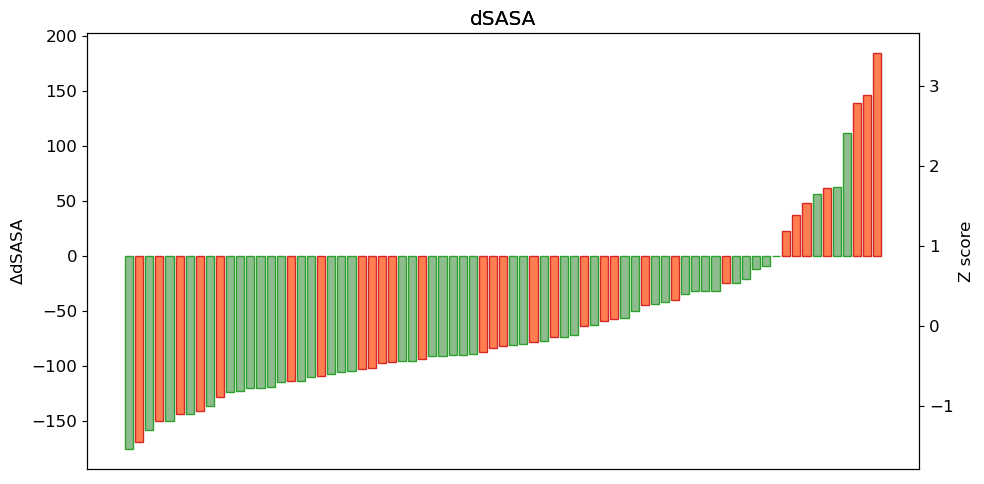

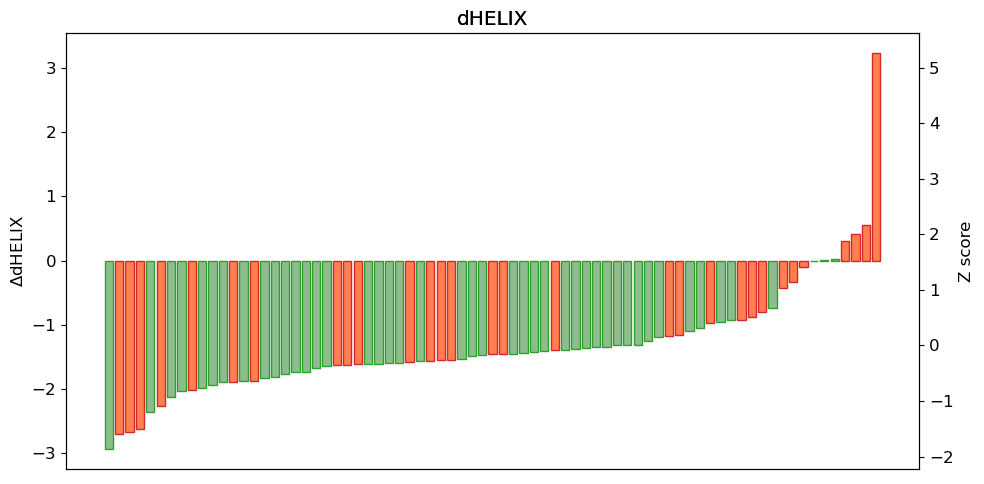

...

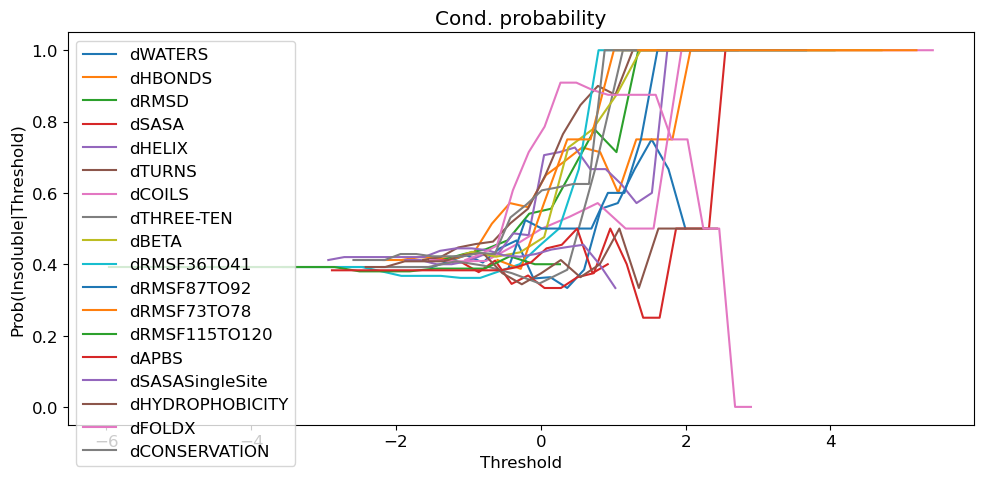

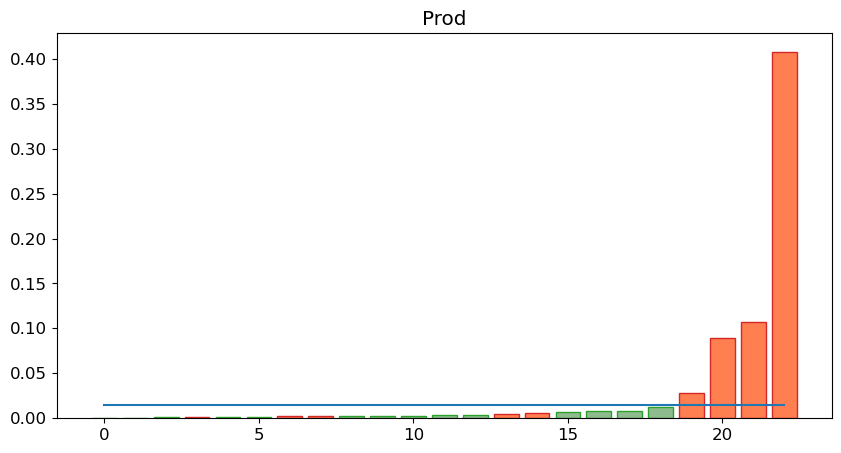

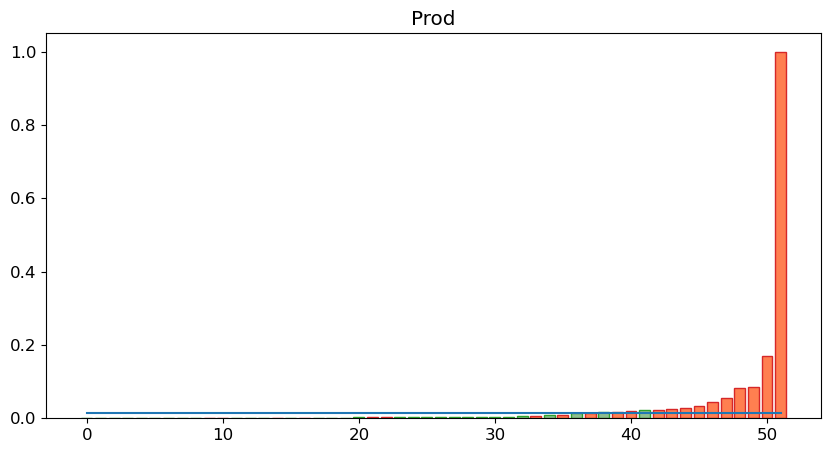

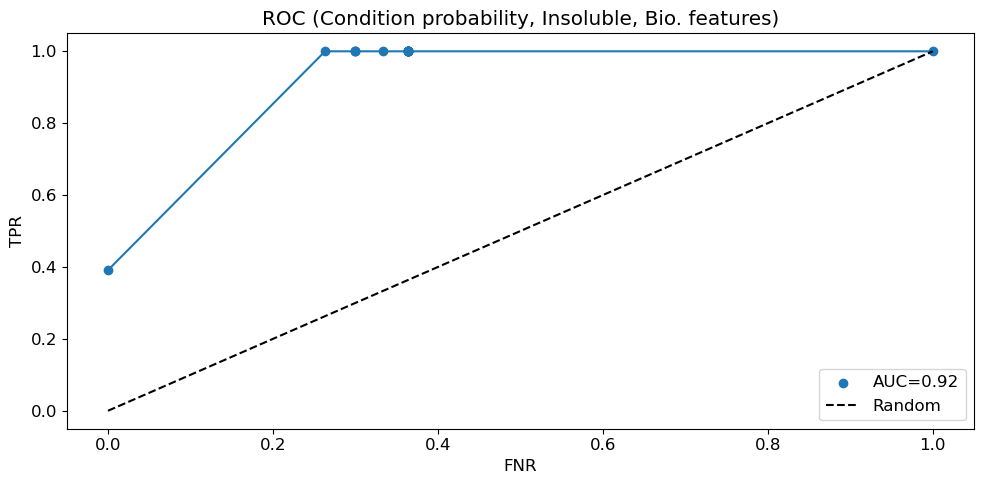

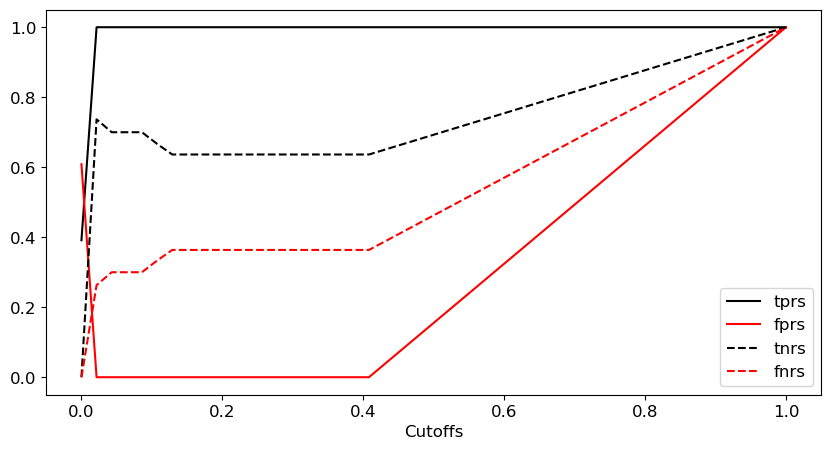

In [132]:
# All features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsAll,display=display,split=True,bootstrap=False)

### Section 2: Build and Apply machine-learning classifiers 
<a id=’section_2’></a>

Outputs
- Metrics for classification performance (precision, recall etc). Terms are defined in Methods of hERG paper
- Cross-validation matrix
- ROC curve
- Most important features used in classifier


### some parameters

In [133]:
display=True
random_state=50

## Decision tree


Example with PAS data

In [134]:
mlData['DT']={}

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be remov

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

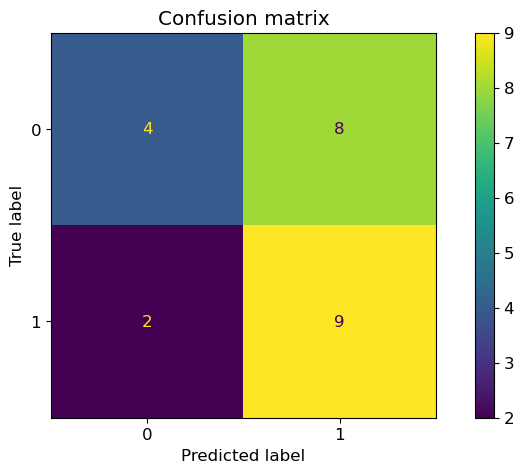

<Figure size 1000x500 with 0 Axes>

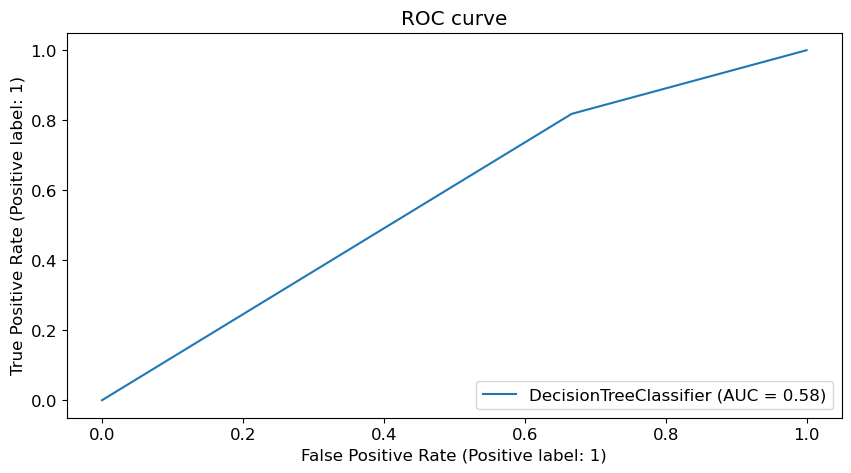

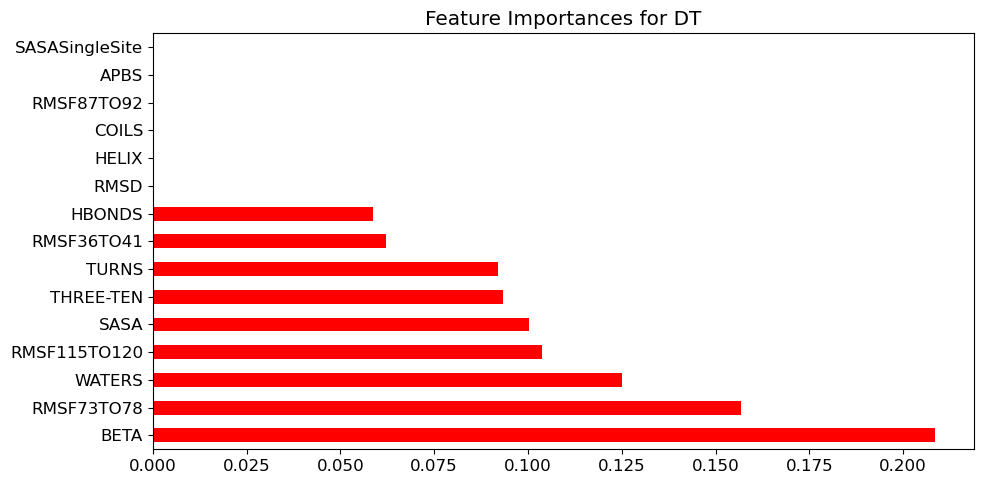

In [135]:
# MD 
outputs = mlUtil.MLClassifier(df,tagsMD,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['MD']=outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.75      0.25      0.38        12
    trafficking       0.53      0.91      0.67        11

       accuracy                           0.57        23
      macro avg       0.64      0.58      0.52        23
   weighted avg       0.64      0.57      0.51        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be remov

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

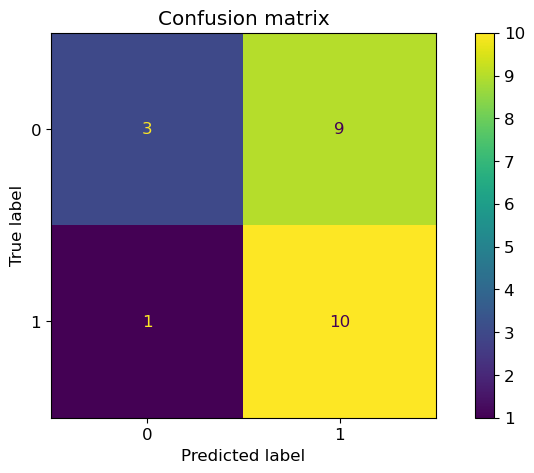

<Figure size 1000x500 with 0 Axes>

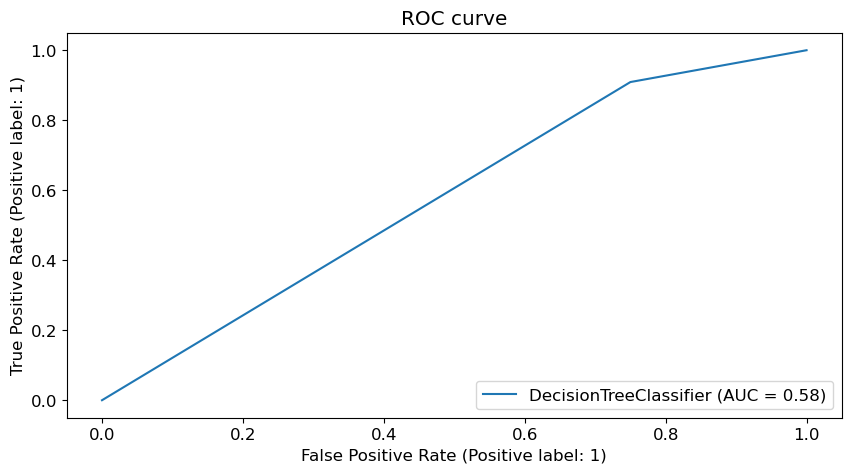

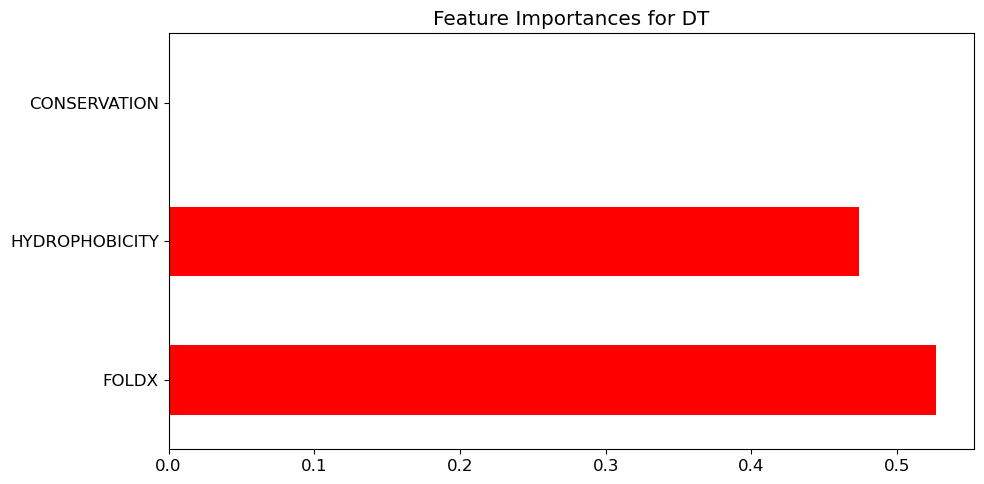

In [136]:
# Bio
outputs = mlUtil.MLClassifier(df,tagsBio,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['Bio']=outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be remov

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

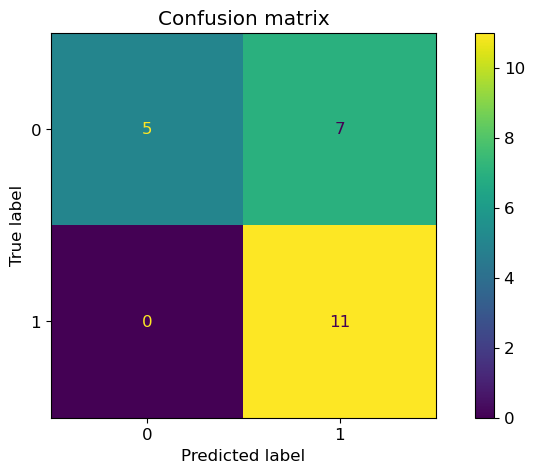

<Figure size 1000x500 with 0 Axes>

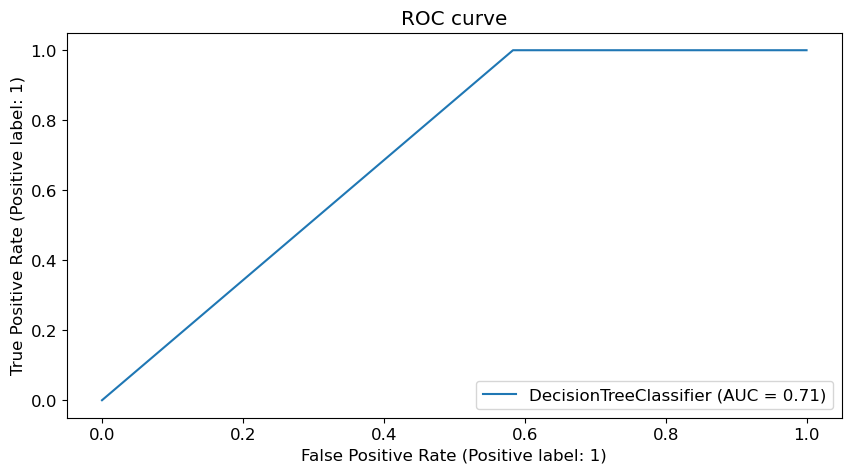

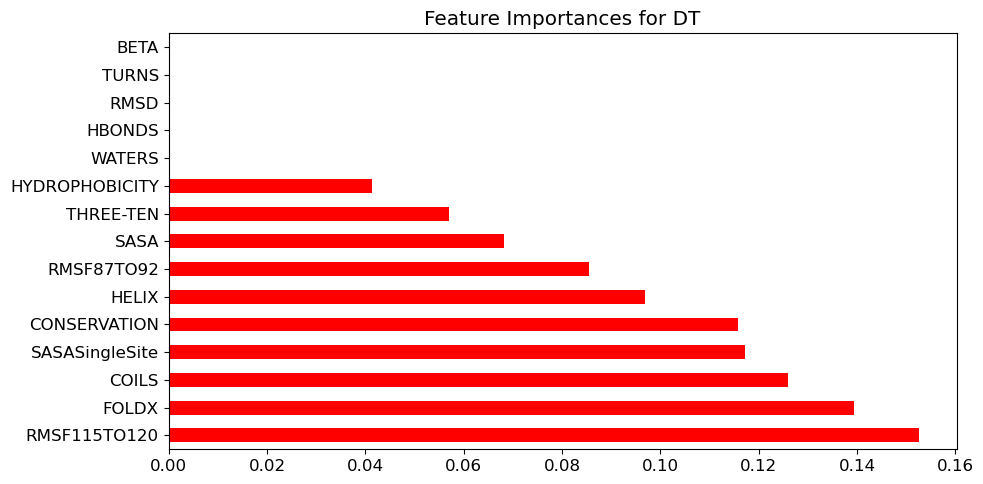

In [137]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['All']=outputs

#### plot ROC curves

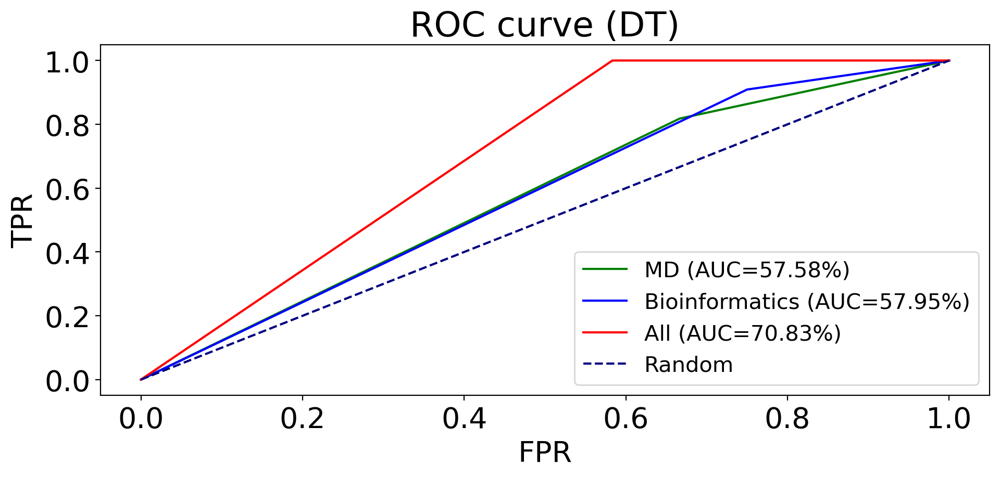

In [178]:
# compare different feature sets
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']

#rcParams['figure.figsize']=7,4
rcParams['font.size']=20
rcParams['figure.dpi']=200
plt.figure()
plt.title('ROC curve (DT)')
for i,key in enumerate(mlData['DT'].keys()):
    fpr,tpr,auc=mlData['DT'][key]['fprs'], mlData['DT'][key]['tprs'], mlData['DT'][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot(fpr,tpr,label="{} (AUC={}%)".format(labels[i],auc),color=cols[i])

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend(loc=4,fontsize=15)
plt.tight_layout()
plt.savefig('roc_DT.png')
rcParams['figure.dpi']=100

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9423076923076923
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.56      0.75      0.64        12
    trafficking       0.57      0.36      0.44        11

       accuracy                           0.57        23
      macro avg       0.57      0.56      0.54        23
   weighted avg       0.57      0.57      0.55        23

Decision tree classifier
Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       0.73      0.67      0.70        12
    trafficking       0.67      0.73      0.70        11

       accuracy                           0.70        23
      macro avg       0.70      0.70      0.70        23
   weighted avg       0.70      0.70      0.70        23

Decision tree classifier
Training 

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anacond

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9423076923076923
Test Accuracy
Overall accuracy  0.391304347826087
                 precision    recall  f1-score   support

non-trafficking       0.33      0.17      0.22        12
    trafficking       0.41      0.64      0.50        11

       accuracy                           0.39        23
      macro avg       0.37      0.40      0.36        23
   weighted avg       0.37      0.39      0.36        23

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23

Decision tree classifier
Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anacond

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9423076923076923
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.56      0.75      0.64        12
    trafficking       0.57      0.36      0.44        11

       accuracy                           0.57        23
      macro avg       0.57      0.56      0.54        23
   weighted avg       0.57      0.57      0.55        23

Decision tree classifier
Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       0.73      0.67      0.70        12
    trafficking       0.67      0.73      0.70        11

       accuracy                           0.70        23
      macro avg       0.70      0.70      0.70        23
   weighted avg       0.70      0.70      0.70        23

Decision tree classifier
Training 

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anacond

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9807692307692307
Test Accuracy
Overall accuracy  0.391304347826087
                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9807692307692307
Test Accuracy
Overall accuracy  0.2608695652173913
                 precision    recall  f1-score   support

non-trafficking       0.22      0.17      0.19        12
    trafficking       0.29      0.36      0.32        11

       accuracy                           0.26        23
      macro avg       0.25      0.27      0.26        23
   weighted avg       0.25      0.26      0.25        23

Decision tree classifier
Training s

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anacond

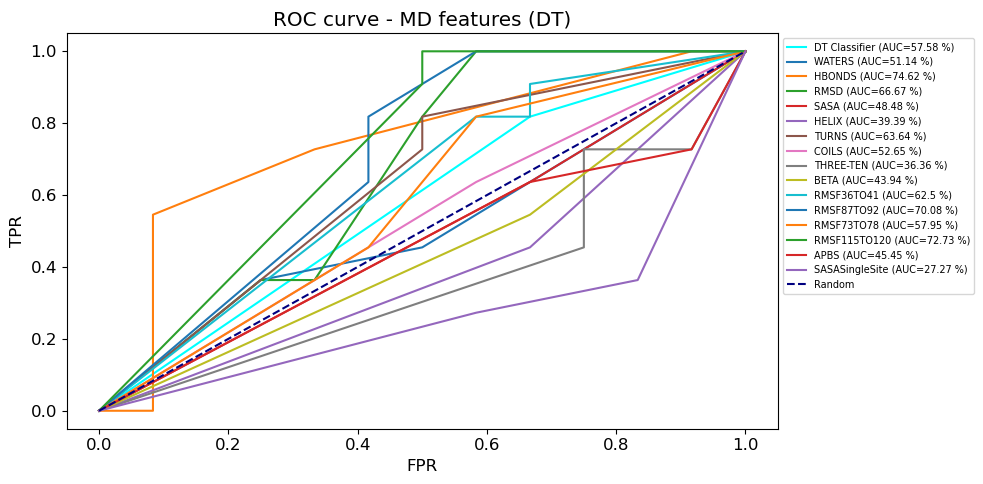

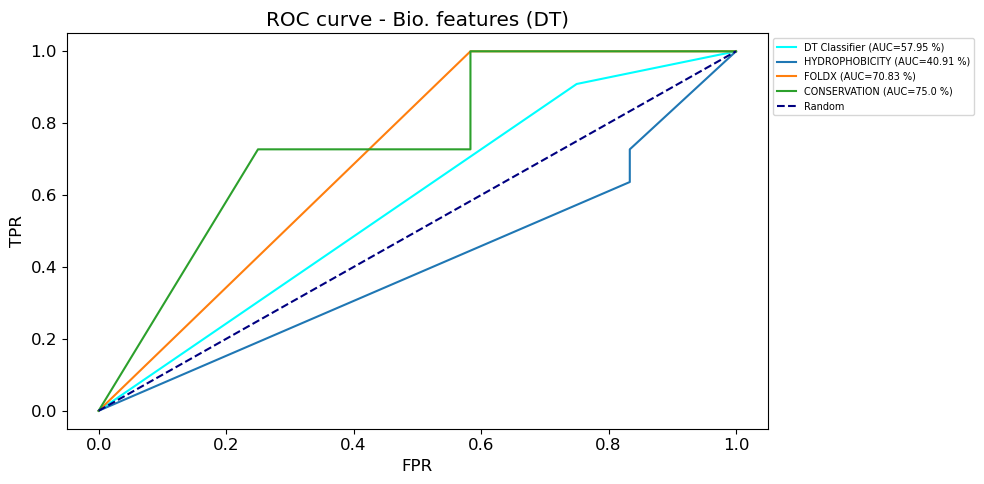

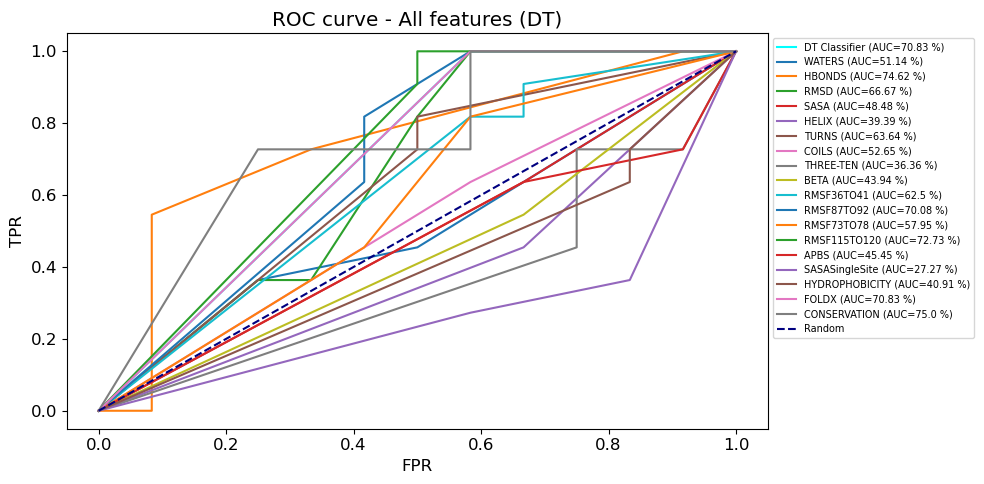

In [139]:
# plot individual features for different feature sets
featSets=[tagsMD,tagsBio,tagsAll]
keys=['MD','Bio','All']
labels=['MD', 'Bio.', 'All']
clf='DT'
rcParams['figure.dpi']=100

for i,key in enumerate(keys):
    feats=featSets[i]    
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - {} features ({})'.format(labels[i], clf))

    # plot classifier ROC
    tpr, fpr, auc = mlData[clf][key]['tprs'], mlData[clf][key]['fprs'], mlData[clf][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC={} %)".format(clf,auc))

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feat],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        auc=np.around(auc*100,decimals=2)
        plt.plot(fpr,tpr,label="{} (AUC={} %)".format(feat, auc))

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=7)
    plt.tight_layout()
    plt.savefig('{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100

## Random forest classifier 

In [140]:
mlData['RF']={}

k-fold crossvalidation results
[0.75       0.875      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.42857143 0.71428571] 

results mean
0.6910714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 1000x500 with 0 Axes>

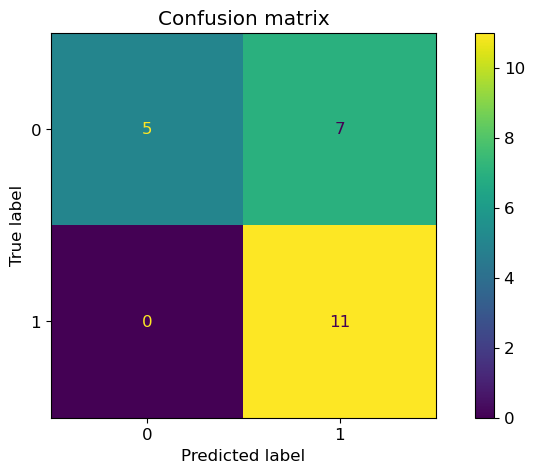

<Figure size 1000x500 with 0 Axes>

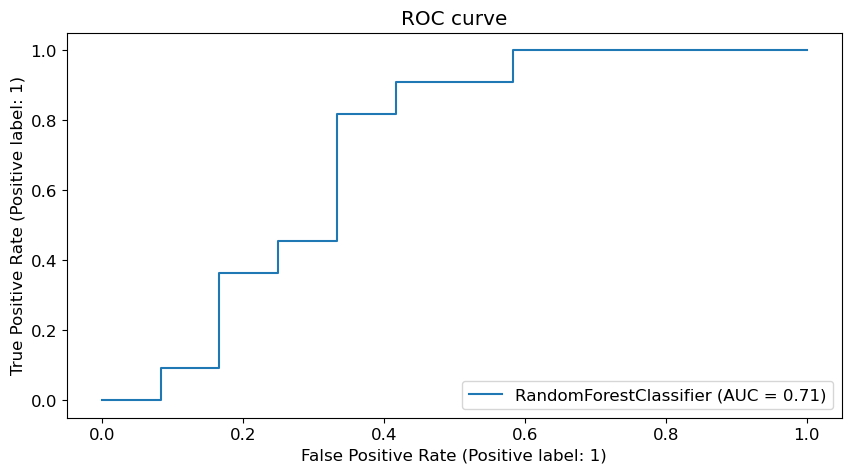

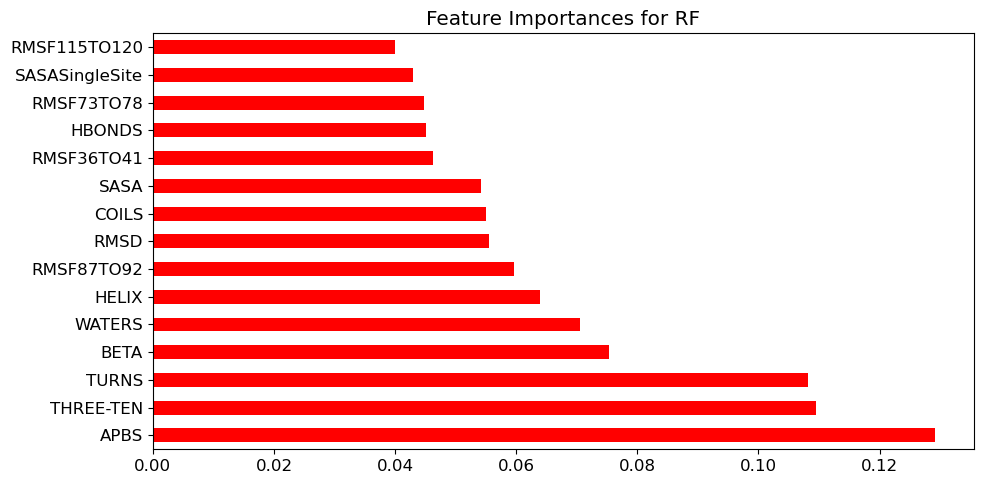

In [141]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD,output,classifier="RF",display=display) 
mlData['RF']['MD']=outputs

k-fold crossvalidation results
[0.875      0.5        0.875      1.         0.5        0.85714286
 0.57142857 0.85714286 0.71428571 0.57142857] 

results mean
0.7321428571428571 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7391304347826086


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 1000x500 with 0 Axes>

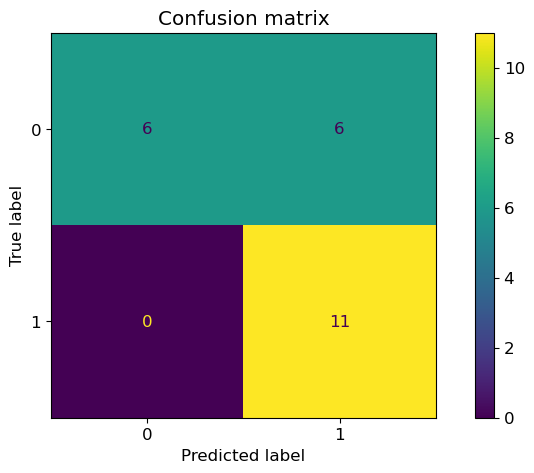

<Figure size 1000x500 with 0 Axes>

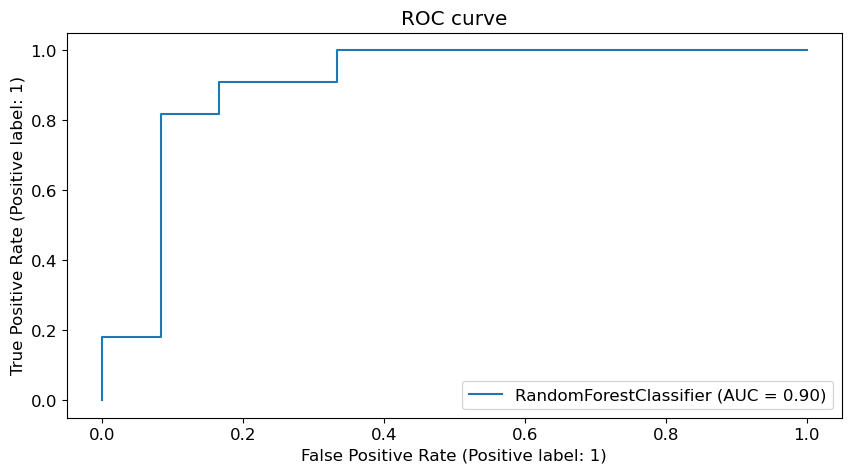

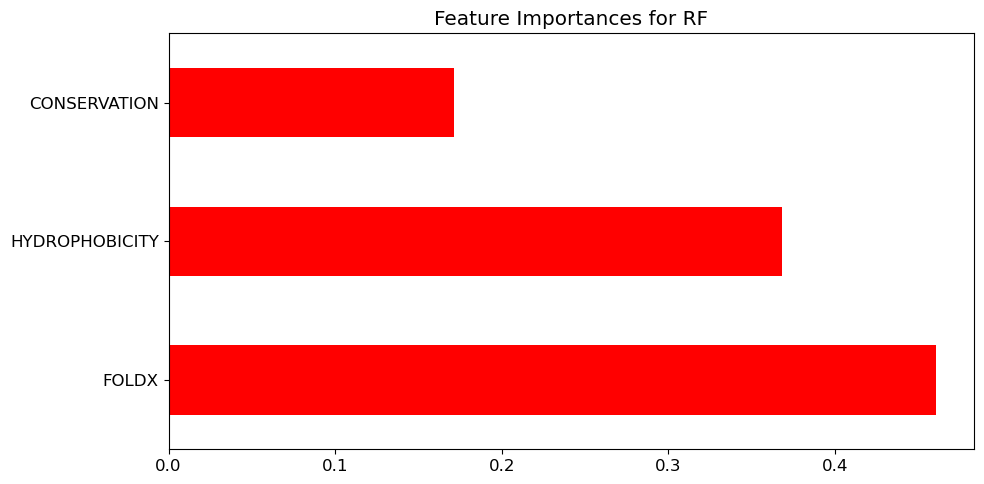

In [142]:
# Bio
outputs = mlUtil.MLClassifier(df,tagsBio,output,classifier="RF",display=display) 
mlData['RF']['Bio']=outputs

k-fold crossvalidation results
[1.         0.625      0.75       0.75       0.625      1.
 0.57142857 0.57142857 0.71428571 0.71428571] 

results mean
0.7321428571428571 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7391304347826086


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 1000x500 with 0 Axes>

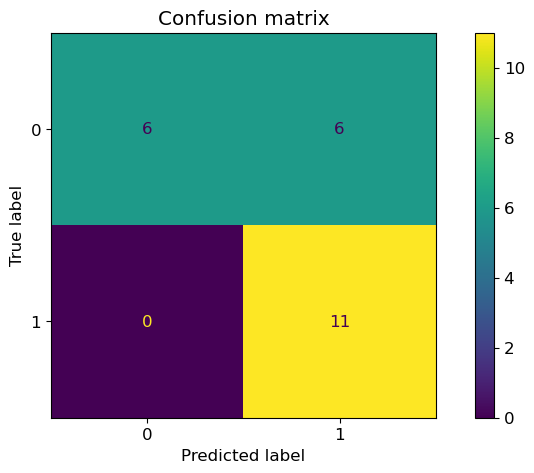

<Figure size 1000x500 with 0 Axes>

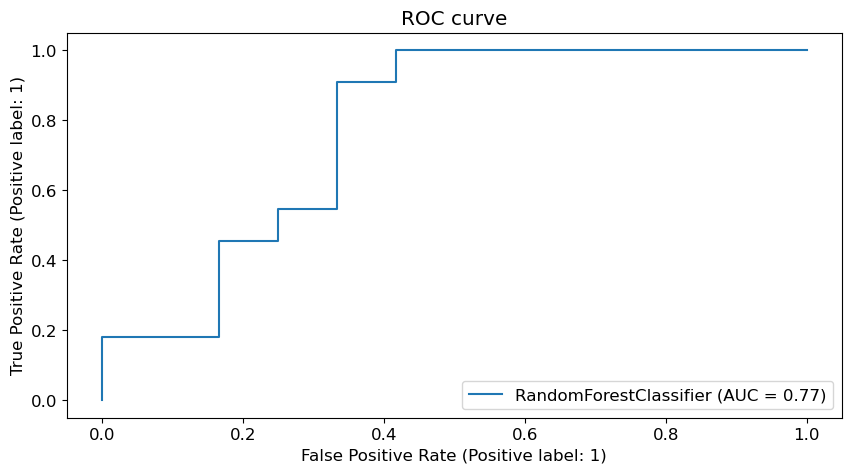

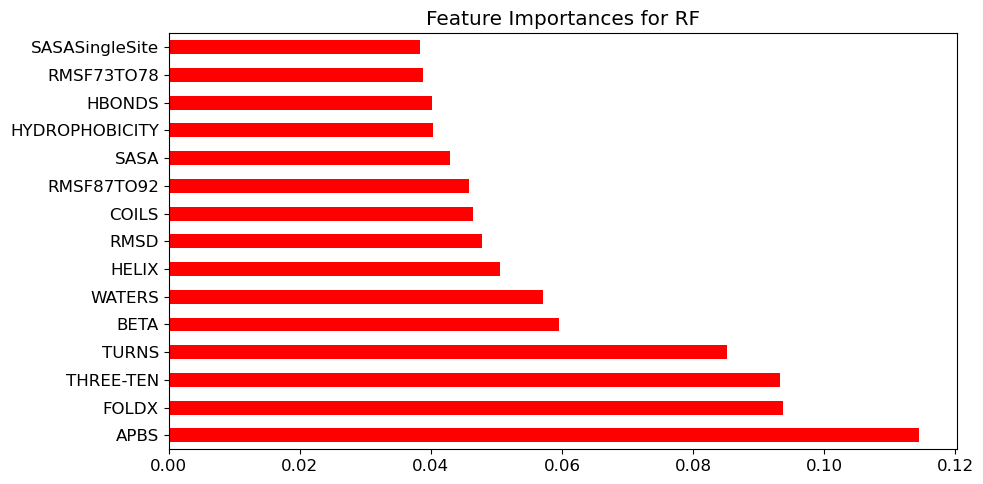

In [143]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll,output,classifier="RF",display=display) 
mlData['RF']['All']=outputs

#### plot ROC curves

MD
Bio
All


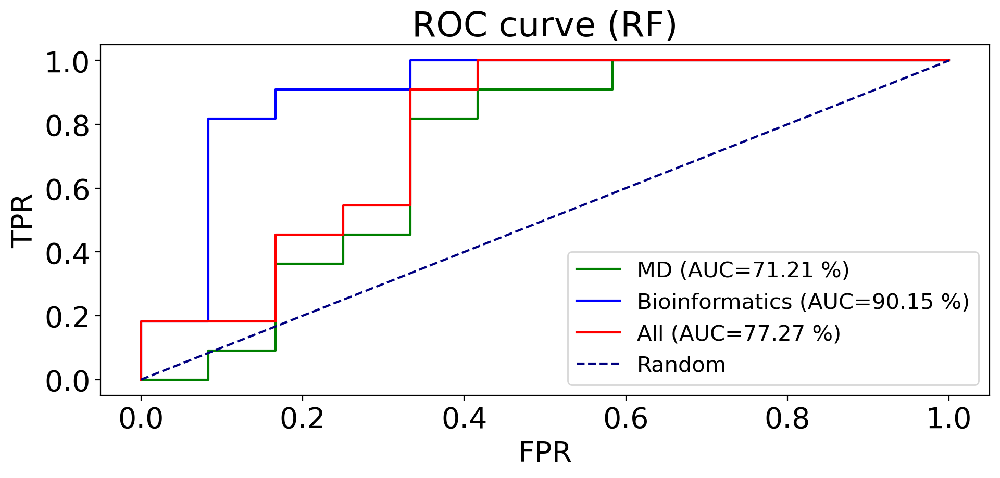

In [179]:
# compare different feature sets
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']

#rcParams['figure.figsize']=7,4
rcParams['font.size']=20
rcParams['figure.dpi']=200
plt.figure()
plt.title('ROC curve (RF)')
for i,key in enumerate(mlData['RF'].keys()):
    print(key)
    fpr,tpr,auc=mlData['RF'][key]['fprs'], mlData['RF'][key]['tprs'], mlData['RF'][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot(fpr,tpr,label="{} (AUC={} %)".format(labels[i],auc),color=cols[i])

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend(loc=4,fontsize=15)
plt.tight_layout()
plt.savefig('roc_RF.png')
rcParams['figure.dpi']=100

k-fold crossvalidation results
[0.5        0.625      0.875      0.75       0.375      0.57142857
 0.85714286 0.42857143 0.42857143 0.71428571] 

results mean
0.6125 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.60      0.75      0.67        12
    trafficking       0.62      0.45      0.53        11

       accuracy                           0.61        23
      macro avg       0.61      0.60      0.60        23
   weighted avg       0.61      0.61      0.60        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.875      0.625      0.75       0.625      0.625      1.
 0.71428571 0.85714286 0.14285714 0.71428571] 

results mean
0.6928571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7115384615384616
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.73      0.67      0.70        12
    trafficking       0.67      0.73      0.70        11

       accuracy                           0.70        23
      macro avg       0.70      0.70      0.70        23
   weighted avg       0.70      0.70      0.70        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.625      0.75       0.5        0.57142857
 0.57142857 0.71428571 0.57142857 0.42857143] 

results mean
0.6232142857142857 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8269230769230769
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.75      0.50      0.60        12
    trafficking       0.60      0.82      0.69        11

       accuracy                           0.65        23
      macro avg       0.68      0.66      0.65        23
   weighted avg       0.68      0.65      0.64        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.75       0.625      0.375      0.57142857
 0.57142857 0.14285714 0.42857143 0.42857143] 

results mean
0.5392857142857144 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9615384615384616
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.4782608695652174


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.50      0.25      0.33        12
    trafficking       0.47      0.73      0.57        11

       accuracy                           0.48        23
      macro avg       0.49      0.49      0.45        23
   weighted avg       0.49      0.48      0.45        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.5        0.375      0.875      0.42857143
 0.57142857 0.71428571 0.28571429 0.71428571] 

results mean
0.5589285714285714 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.40      0.33      0.36        12
    trafficking       0.38      0.45      0.42        11

       accuracy                           0.39        23
      macro avg       0.39      0.39      0.39        23
   weighted avg       0.39      0.39      0.39        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.5        0.75       0.75       0.625      0.85714286
 0.57142857 0.42857143 0.71428571 0.42857143] 

results mean
0.6375000000000001 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.75      0.50      0.60        12
    trafficking       0.60      0.82      0.69        11

       accuracy                           0.65        23
      macro avg       0.68      0.66      0.65        23
   weighted avg       0.68      0.65      0.64        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.5        0.75       0.75       0.42857143
 0.57142857 0.42857143 0.14285714 0.28571429] 

results mean
0.5357142857142858 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.5217391304347826


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.56      0.42      0.48        12
    trafficking       0.50      0.64      0.56        11

       accuracy                           0.52        23
      macro avg       0.53      0.53      0.52        23
   weighted avg       0.53      0.52      0.52        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.5        0.375      0.75       0.85714286
 0.57142857 0.28571429 0.28571429 0.71428571] 

results mean
0.5339285714285714 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.75       0.625      0.375      0.57142857
 0.42857143 0.57142857 0.28571429 0.71428571] 

results mean
0.5446428571428571 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.43478260869565216


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.44      0.33      0.38        12
    trafficking       0.43      0.55      0.48        11

       accuracy                           0.43        23
      macro avg       0.44      0.44      0.43        23
   weighted avg       0.44      0.43      0.43        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.5        0.375      0.375      0.625      0.625      0.28571429
 0.28571429 0.71428571 0.28571429 0.57142857] 

results mean
0.46428571428571425 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8269230769230769
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.5652173913043478


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.625      0.625      0.875      0.75       0.71428571
 0.71428571 0.85714286 0.42857143 0.71428571] 

results mean
0.7053571428571429 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8846153846153846
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.86      0.50      0.63        12
    trafficking       0.62      0.91      0.74        11

       accuracy                           0.70        23
      macro avg       0.74      0.70      0.69        23
   weighted avg       0.75      0.70      0.68        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.375      0.375      0.625      0.625      0.625      0.71428571
 0.28571429 0.85714286 0.14285714 0.42857143] 

results mean
0.505357142857143 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8461538461538461
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.71      0.42      0.53        12
    trafficking       0.56      0.82      0.67        11

       accuracy                           0.61        23
      macro avg       0.64      0.62      0.60        23
   weighted avg       0.64      0.61      0.59        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.625      0.75       0.625      0.5        0.71428571
 1.         0.71428571 0.57142857 0.42857143] 

results mean
0.6553571428571429 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8846153846153846
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.875      0.625      0.625      0.71428571
 0.71428571 0.28571429 0.14285714 0.42857143] 

results mean
0.5410714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.25       0.125      0.375      0.5        0.375      0.57142857
 0.         0.28571429 0.42857143 0.14285714] 

results mean
0.3053571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.2608695652173913


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.22      0.17      0.19        12
    trafficking       0.29      0.36      0.32        11

       accuracy                           0.26        23
      macro avg       0.25      0.27      0.26        23
   weighted avg       0.25      0.26      0.25        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.375      0.75       0.625      0.625      0.625      0.28571429
 0.57142857 0.42857143 0.57142857 0.42857143] 

results mean
0.5285714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.43478260869565216


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.40      0.17      0.24        12
    trafficking       0.44      0.73      0.55        11

       accuracy                           0.43        23
      macro avg       0.42      0.45      0.39        23
   weighted avg       0.42      0.43      0.39        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.5        0.625      0.5        0.85714286
 0.57142857 0.71428571 0.42857143 0.71428571] 

results mean
0.6035714285714285 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.625      0.25       0.625      0.25       0.71428571
 0.28571429 0.71428571 0.42857143 0.57142857] 

results mean
0.5214285714285715 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8076923076923077
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.33      0.50        12
    trafficking       0.58      1.00      0.73        11

       accuracy                           0.65        23
      macro avg       0.79      0.67      0.62        23
   weighted avg       0.80      0.65      0.61        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.5        0.625      0.875      0.75       0.375      0.57142857
 0.85714286 0.42857143 0.42857143 0.71428571] 

results mean
0.6125 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.60      0.75      0.67        12
    trafficking       0.62      0.45      0.53        11

       accuracy                           0.61        23
      macro avg       0.61      0.60      0.60        23
   weighted avg       0.61      0.61      0.60        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.875      0.625      0.75       0.625      0.625      1.
 0.71428571 0.85714286 0.14285714 0.71428571] 

results mean
0.6928571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7115384615384616
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.73      0.67      0.70        12
    trafficking       0.67      0.73      0.70        11

       accuracy                           0.70        23
      macro avg       0.70      0.70      0.70        23
   weighted avg       0.70      0.70      0.70        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.625      0.75       0.5        0.57142857
 0.57142857 0.71428571 0.57142857 0.42857143] 

results mean
0.6232142857142857 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8269230769230769
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.75      0.50      0.60        12
    trafficking       0.60      0.82      0.69        11

       accuracy                           0.65        23
      macro avg       0.68      0.66      0.65        23
   weighted avg       0.68      0.65      0.64        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.75       0.625      0.375      0.57142857
 0.57142857 0.14285714 0.42857143 0.42857143] 

results mean
0.5392857142857144 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9615384615384616
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.4782608695652174


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.50      0.25      0.33        12
    trafficking       0.47      0.73      0.57        11

       accuracy                           0.48        23
      macro avg       0.49      0.49      0.45        23
   weighted avg       0.49      0.48      0.45        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.5        0.375      0.875      0.42857143
 0.57142857 0.71428571 0.28571429 0.71428571] 

results mean
0.5589285714285714 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.40      0.33      0.36        12
    trafficking       0.38      0.45      0.42        11

       accuracy                           0.39        23
      macro avg       0.39      0.39      0.39        23
   weighted avg       0.39      0.39      0.39        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.5        0.75       0.75       0.625      0.85714286
 0.57142857 0.42857143 0.71428571 0.42857143] 

results mean
0.6375000000000001 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.75      0.50      0.60        12
    trafficking       0.60      0.82      0.69        11

       accuracy                           0.65        23
      macro avg       0.68      0.66      0.65        23
   weighted avg       0.68      0.65      0.64        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.5        0.75       0.75       0.42857143
 0.57142857 0.42857143 0.14285714 0.28571429] 

results mean
0.5357142857142858 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.5217391304347826


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.56      0.42      0.48        12
    trafficking       0.50      0.64      0.56        11

       accuracy                           0.52        23
      macro avg       0.53      0.53      0.52        23
   weighted avg       0.53      0.52      0.52        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.5        0.375      0.75       0.85714286
 0.57142857 0.28571429 0.28571429 0.71428571] 

results mean
0.5339285714285714 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.75       0.625      0.375      0.57142857
 0.42857143 0.57142857 0.28571429 0.71428571] 

results mean
0.5446428571428571 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.43478260869565216


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.44      0.33      0.38        12
    trafficking       0.43      0.55      0.48        11

       accuracy                           0.43        23
      macro avg       0.44      0.44      0.43        23
   weighted avg       0.44      0.43      0.43        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.5        0.375      0.375      0.625      0.625      0.28571429
 0.28571429 0.71428571 0.28571429 0.57142857] 

results mean
0.46428571428571425 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8269230769230769
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.5652173913043478


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.625      0.625      0.875      0.75       0.71428571
 0.71428571 0.85714286 0.42857143 0.71428571] 

results mean
0.7053571428571429 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8846153846153846
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.86      0.50      0.63        12
    trafficking       0.62      0.91      0.74        11

       accuracy                           0.70        23
      macro avg       0.74      0.70      0.69        23
   weighted avg       0.75      0.70      0.68        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.375      0.375      0.625      0.625      0.625      0.71428571
 0.28571429 0.85714286 0.14285714 0.42857143] 

results mean
0.505357142857143 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8461538461538461
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.71      0.42      0.53        12
    trafficking       0.56      0.82      0.67        11

       accuracy                           0.61        23
      macro avg       0.64      0.62      0.60        23
   weighted avg       0.64      0.61      0.59        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.625      0.75       0.625      0.5        0.71428571
 1.         0.71428571 0.57142857 0.42857143] 

results mean
0.6553571428571429 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8846153846153846
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.875      0.625      0.625      0.71428571
 0.71428571 0.28571429 0.14285714 0.42857143] 

results mean
0.5410714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.25       0.125      0.375      0.5        0.375      0.57142857
 0.         0.28571429 0.42857143 0.14285714] 

results mean
0.3053571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.2608695652173913


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.22      0.17      0.19        12
    trafficking       0.29      0.36      0.32        11

       accuracy                           0.26        23
      macro avg       0.25      0.27      0.26        23
   weighted avg       0.25      0.26      0.25        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.375      0.75       0.625      0.625      0.625      0.28571429
 0.57142857 0.42857143 0.57142857 0.42857143] 

results mean
0.5285714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.43478260869565216


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.40      0.17      0.24        12
    trafficking       0.44      0.73      0.55        11

       accuracy                           0.43        23
      macro avg       0.42      0.45      0.39        23
   weighted avg       0.42      0.43      0.39        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.5        0.625      0.5        0.85714286
 0.57142857 0.71428571 0.42857143 0.71428571] 

results mean
0.6035714285714285 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.625      0.25       0.625      0.25       0.71428571
 0.28571429 0.71428571 0.42857143 0.57142857] 

results mean
0.5214285714285715 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8076923076923077
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.33      0.50        12
    trafficking       0.58      1.00      0.73        11

       accuracy                           0.65        23
      macro avg       0.79      0.67      0.62        23
   weighted avg       0.80      0.65      0.61        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


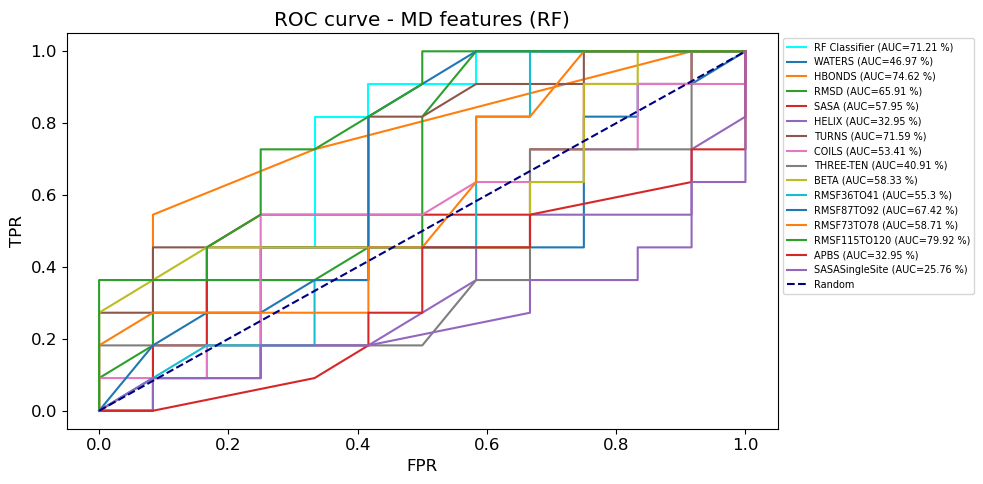

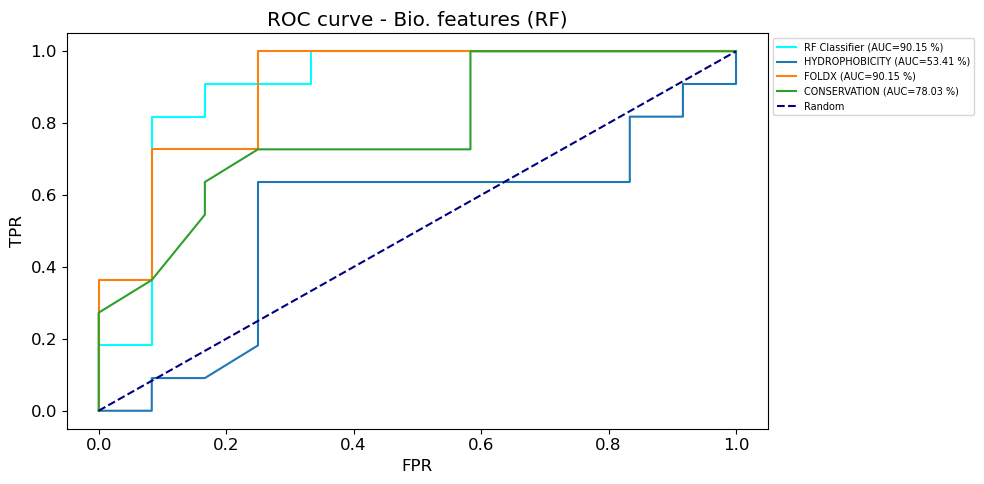

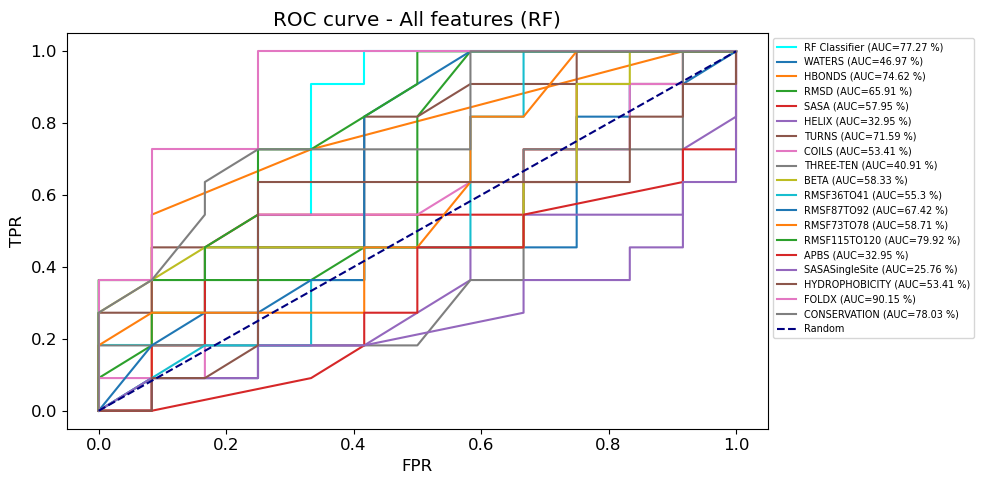

In [145]:
# plot individual features for different feature sets
featSets=[tagsMD,tagsBio,tagsAll]
keys=['MD','Bio','All']
labels=['MD', 'Bio.', 'All']
clf='RF'
rcParams['figure.dpi']=100

for i,key in enumerate(keys):
    feats=featSets[i]    
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - {} features ({})'.format(labels[i], clf))

    # plot classifier ROC
    tpr, fpr, auc = mlData[clf][key]['tprs'], mlData[clf][key]['fprs'], mlData[clf][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC={} %)".format(clf,auc))

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feat],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        auc=np.around(auc*100,decimals=2)
        plt.plot(fpr,tpr,label="{} (AUC={} %)".format(feat,auc))

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=7)
    plt.tight_layout()
    plt.savefig('{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100


## Support vector machines

In [146]:
mlData['SVM']={}

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils

Training sample accuracy
Overall accuracy  0.6346153846153846
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.50      0.42      0.45        12
    trafficking       0.46      0.55      0.50        11

       accuracy                           0.48        23
      macro avg       0.48      0.48      0.48        23
   weighted avg       0.48      0.48      0.48        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 1000x500 with 0 Axes>

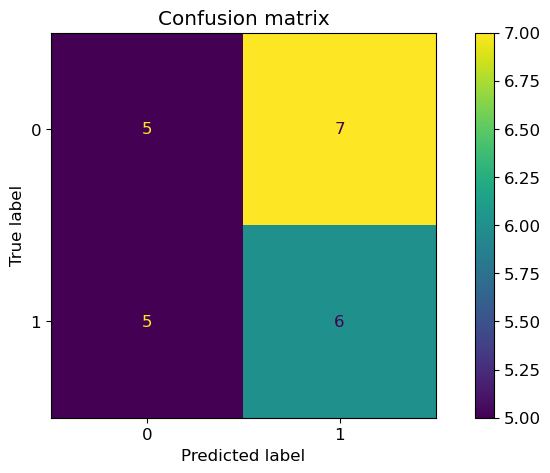

<Figure size 1000x500 with 0 Axes>

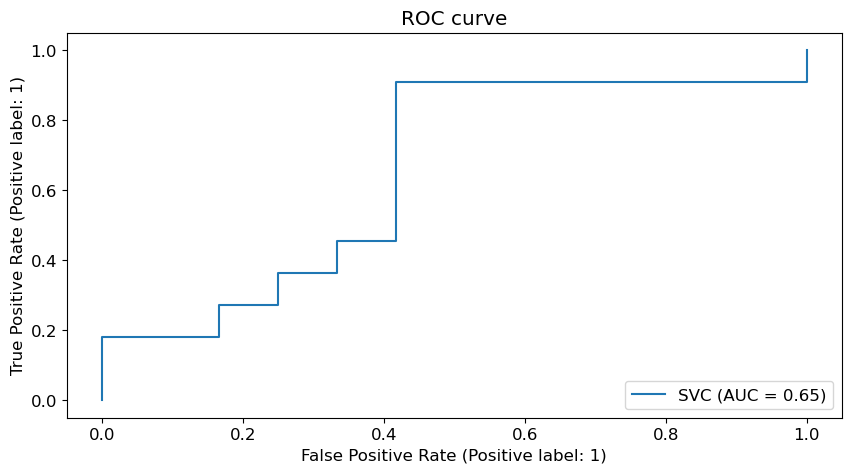

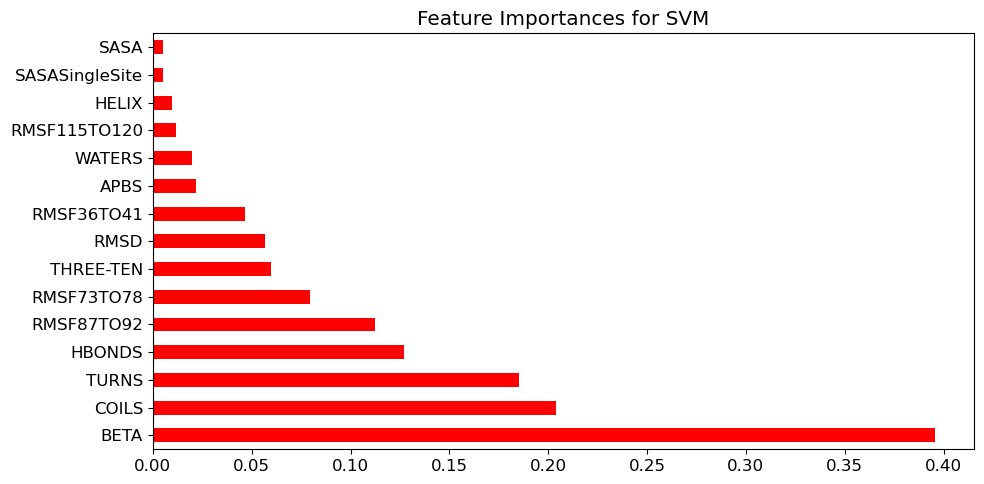

In [147]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD,output,classifier="SVM",display=display)
mlData['SVM']['MD']=outputs

Training sample accuracy
Overall accuracy  0.6730769230769231
Test Accuracy
Overall accuracy  0.6521739130434783
                 precision    recall  f1-score   support

non-trafficking       1.00      0.33      0.50        12
    trafficking       0.58      1.00      0.73        11

       accuracy                           0.65        23
      macro avg       0.79      0.67      0.62        23
   weighted avg       0.80      0.65      0.61        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predict

<Figure size 1000x500 with 0 Axes>

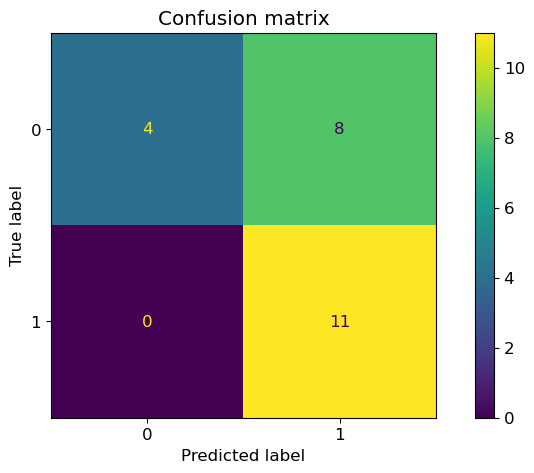

<Figure size 1000x500 with 0 Axes>

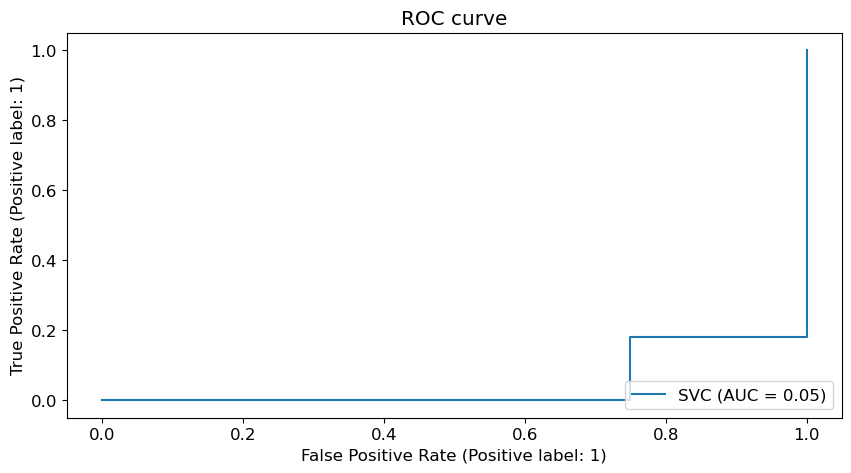

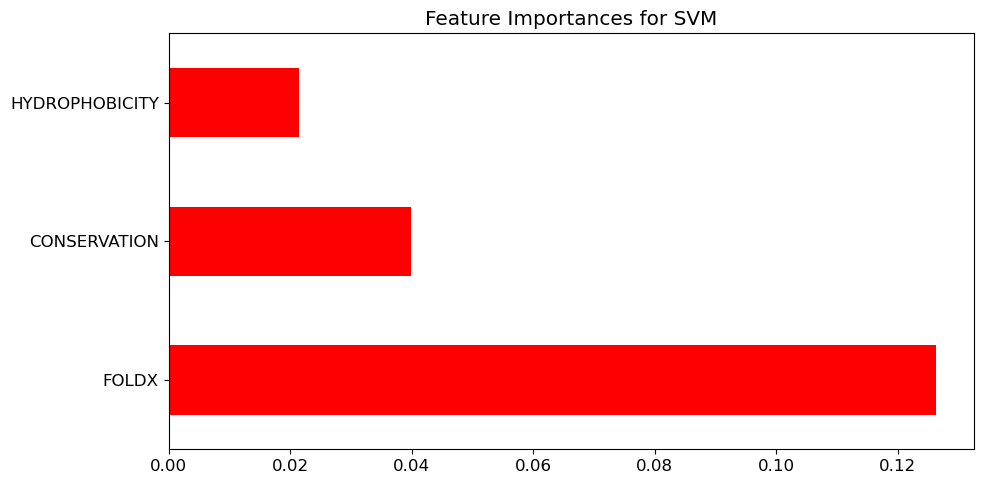

In [148]:
# Bio
outputs = mlUtil.MLClassifier(df,tagsBio,output,classifier="SVM",display=display)
mlData['SVM']['Bio']=outputs

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils

Training sample accuracy
Overall accuracy  0.6346153846153846
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.50      0.42      0.45        12
    trafficking       0.46      0.55      0.50        11

       accuracy                           0.48        23
      macro avg       0.48      0.48      0.48        23
   weighted avg       0.48      0.48      0.48        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 1000x500 with 0 Axes>

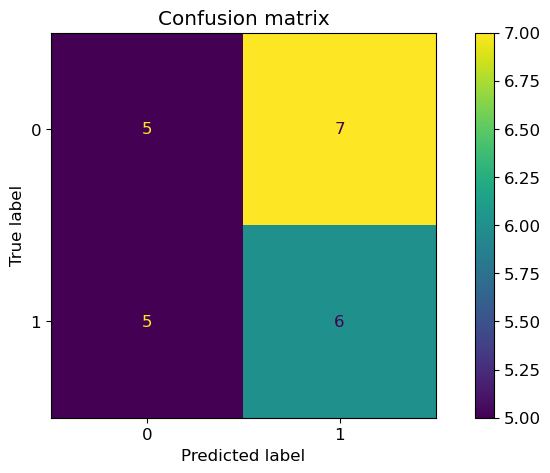

<Figure size 1000x500 with 0 Axes>

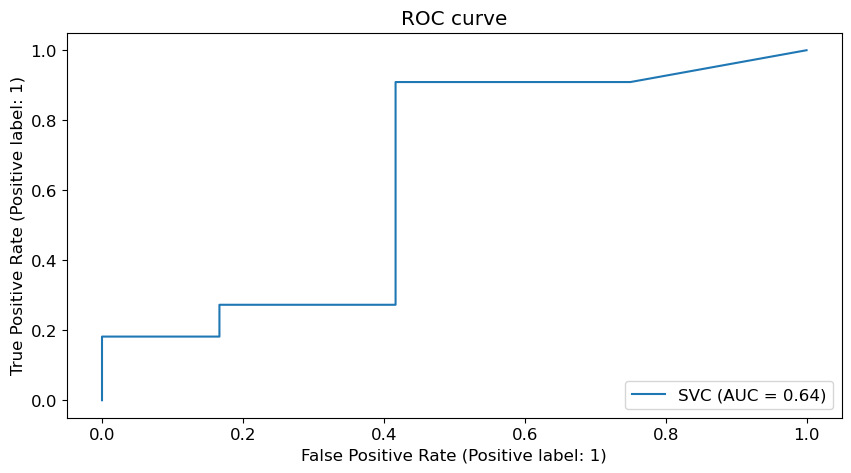

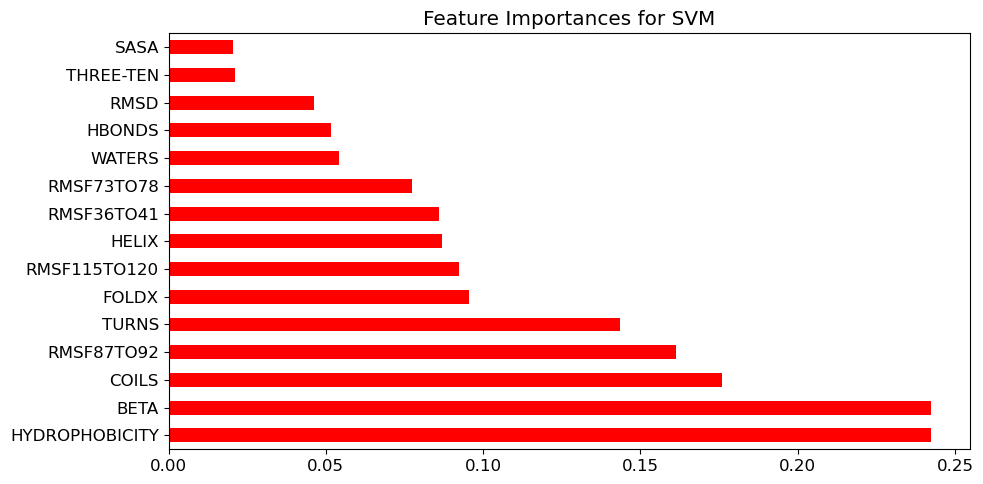

In [149]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll,output,classifier="SVM",display=display)
mlData['SVM']['All']=outputs

#### plot ROC curves

MD
Bio
All


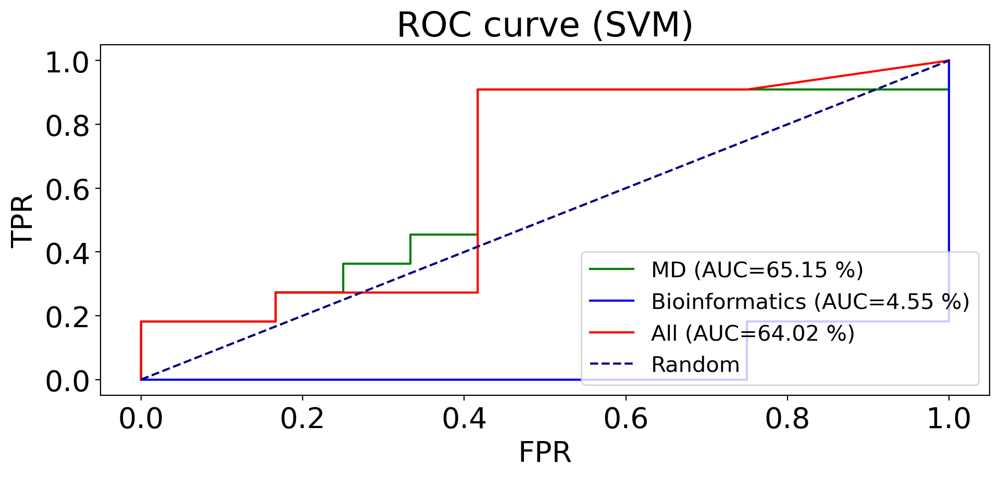

In [180]:
# compare different feature sets
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']

#rcParams['figure.figsize']=7,4
rcParams['font.size']=20
rcParams['figure.dpi']=200
plt.figure()
plt.title('ROC curve (SVM)')
for i,key in enumerate(mlData['SVM'].keys()):
    print(key)
    fpr,tpr,auc=mlData['SVM'][key]['fprs'], mlData['SVM'][key]['tprs'], mlData['SVM'][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot(fpr,tpr,label="{} (AUC={} %)".format(labels[i],auc),color=cols[i])

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend(loc=4,fontsize=15)
plt.tight_layout()
plt.savefig('roc_SVM.png')
rcParams['figure.dpi']=100

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.5217391304347826
                 precision    recall  f1-score   support

non-trafficking       1.00      0.08      0.15        12
    trafficking       0.50      1.00      0.67        11

       accuracy                           0.52        23
      macro avg       0.75      0.54      0.41        23
   weighted avg       0.76      0.52      0.40        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall 

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.6730769230769231
Test Accuracy
Overall 

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.5217391304347826
                 precision    recall  f1-score   support

non-trafficking       1.00      0.08      0.15        12
    trafficking       0.50      1.00      0.67        11

       accuracy                           0.52        23
      macro avg       0.75      0.54      0.41        23
   weighted avg       0.76      0.52      0.40        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall 

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.6730769230769231
Test Accuracy
Overall 

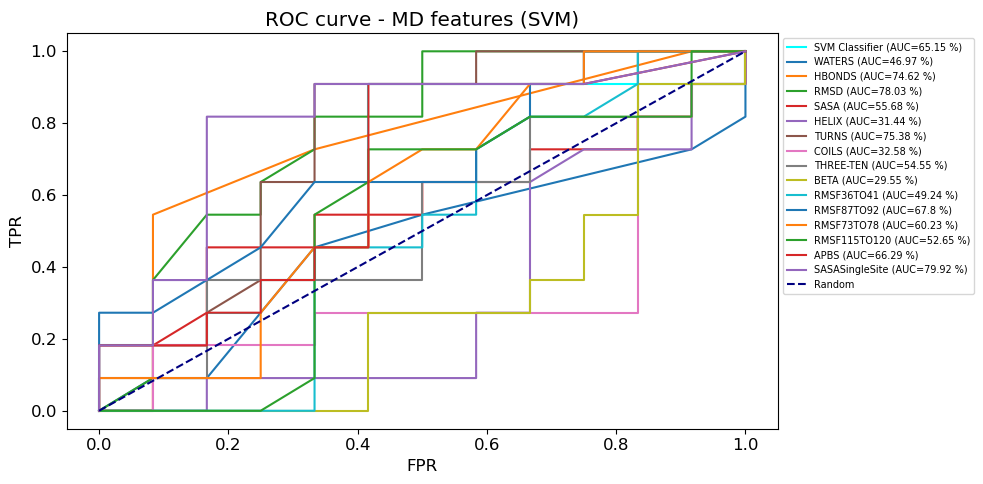

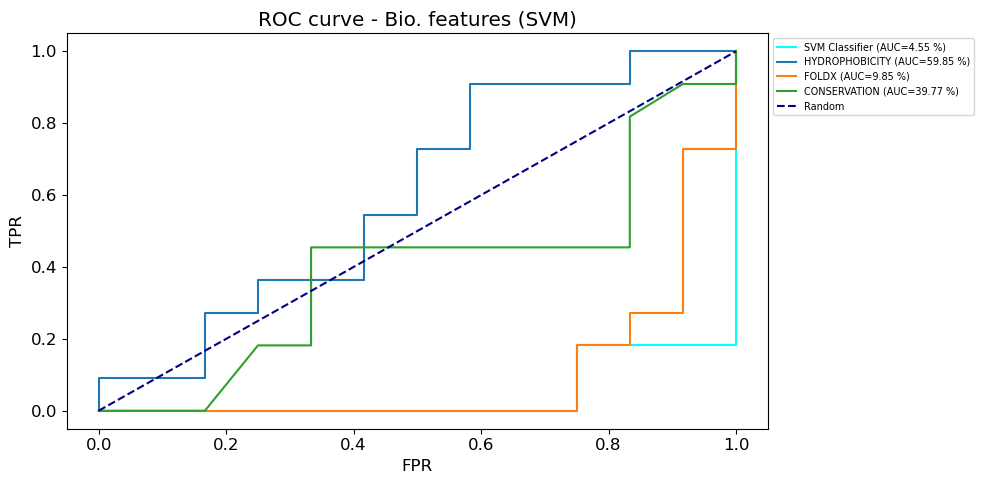

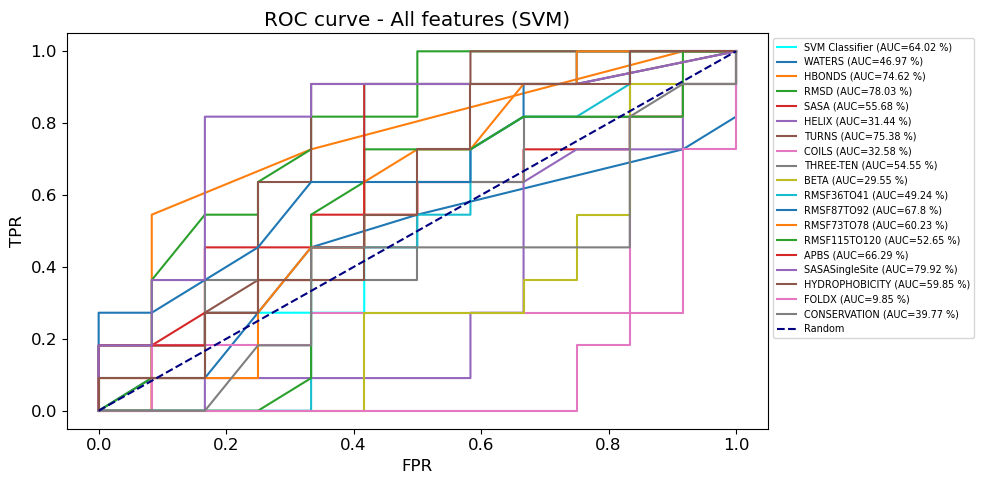

In [151]:
# plot individual features for different feature sets
featSets=[tagsMD,tagsBio,tagsAll]
keys=['MD','Bio','All']
labels=['MD', 'Bio.', 'All']
clf='SVM'
rcParams['figure.dpi']=100

for i,key in enumerate(keys):
    feats=featSets[i]    
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - {} features ({})'.format(labels[i], clf))

    # plot classifier ROC
    tpr, fpr, auc = mlData[clf][key]['tprs'], mlData[clf][key]['fprs'], mlData[clf][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC={} %)".format(clf,auc))

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feat],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        auc=np.around(auc*100,decimals=2)
        plt.plot(fpr,tpr,label="{} (AUC={} %)".format(feat, auc))

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=7)
    plt.tight_layout()
    plt.savefig('{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100

### Classfier performance comparison (F1 score)

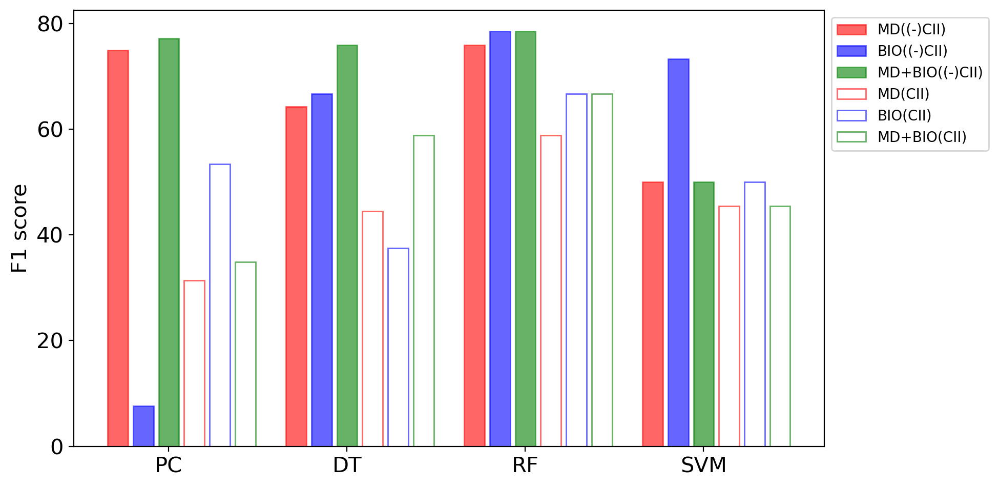

In [192]:
allData=[]
for clf in clfs:  
    for cls in ['trafficking','non-trafficking']:
        for feat in ['MD','Bio','All']:
            val=mlData[clf][feat]['f1_classes'][cls]
            allData.append(val)
    allData.append(0) # add 0 as a separator between each class
allData.pop(-1)    # remove the last 0
allData=[i*100 for i in allData]
cols=['red','blue','green','red','blue','green','white']
labels=['MD((-)CII)', 'BIO((-)CII)', 'MD+BIO((-)CII)', 'MD(CII)', 'BIO(CII)', 'MD+BIO(CII)']
styles=['','','', '///' , '///', '///']

rcParams['figure.dpi']=200
rcParams['font.size']=15
plt.figure()
ax=plt.subplot()
ax.set_ylabel('F1 score')
ax.set_xticks([2,9,16,23])
ax.set_xticklabels(['PC','DT','RF','SVM'])
ax.set_yticks([0, 20, 40, 60, 80, 100])

for i,label in enumerate(labels):
    vals=[]
    xs=[]
    
    for j in range(len(allData)):
        if j % 7 == i:
            vals.append(allData[j])
            xs.append(j)

    if i < 3:
        fill=True
    else:
        fill=False
        
    #plt.bar(xs,vals,color=cols[i],alpha=0.6,hatch=styles[i],edgecolor=cols[i],label=label)
    plt.bar(xs,vals,color=cols[i],alpha=0.6,fill=fill,edgecolor=cols[i],label=label)
    
plt.legend(bbox_to_anchor=(1,1),fontsize=10)
plt.tight_layout()
plt.savefig('f1-scores-trafficking.png')


rcParams['figure.dpi']=100


In [193]:
allData

[74.9310966637897,
 7.6512024655920206,
 77.17906106995527,
 31.391439324648424,
 53.4256287573707,
 34.83670554591613,
 0,
 64.28571428571428,
 66.66666666666666,
 75.86206896551725,
 44.44444444444444,
 37.5,
 58.82352941176471,
 0,
 75.86206896551725,
 78.57142857142858,
 78.57142857142858,
 58.82352941176471,
 66.66666666666666,
 66.66666666666666,
 0,
 49.999999999999986,
 73.33333333333334,
 49.999999999999986,
 45.45454545454545,
 50.0,
 45.45454545454545]

### All classifiers

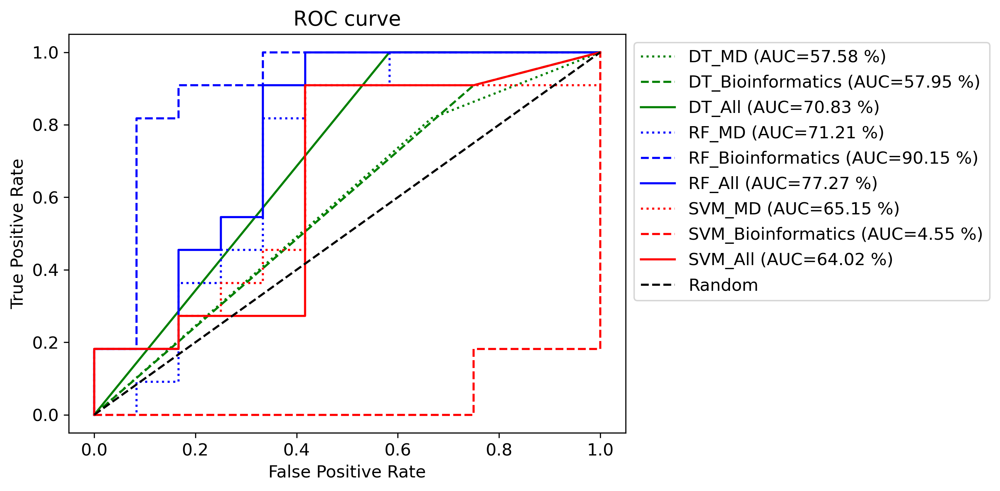

In [153]:
# compare different feature sets for different classifiers
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']
styles=[':','--','-']

rcParams['font.size']=12
rcParams['figure.figsize']=10,5
rcParams['figure.dpi']=300
plt.figure()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

for i,clf in enumerate(clfs[1:]): # excluding probabilistic classfier here
    for j,key in enumerate(mlData[clf].keys()):
        fpr,tpr,auc=mlData[clf][key]['fprs'], mlData[clf][key]['tprs'], mlData[clf][key]['auc']
        auc=np.around(auc*100,decimals=2)
        plt.plot(fpr,tpr,label="{}_{} (AUC={} %)".format(clf,labels[j], auc),color=cols[i],linestyle=styles[j])

        
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Random')
plt.legend(bbox_to_anchor=(1,1))
plt.tight_layout()
plt.savefig('roc_allClf.png')
rcParams['figure.dpi']=100

### Train using best 5 features

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6086956521739131
                 precision    recall  f1-score   support

non-trafficking       0.64      0.58      0.61        12
    trafficking       0.58      0.64      0.61        11

       accuracy                           0.61        23
      macro avg       0.61      0.61      0.61        23
   weighted avg       0.61      0.61      0.61        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be remov

k-fold crossvalidation results
[0.875      0.5        0.75       1.         0.75       1.
 0.57142857 0.42857143 0.71428571 0.71428571] 

results mean
0.7303571428571429 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8260869565217391


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.67      0.80        12
    trafficking       0.73      1.00      0.85        11

       accuracy                           0.83        23
      macro avg       0.87      0.83      0.82        23
   weighted avg       0.87      0.83      0.82        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2

Training sample accuracy
Overall accuracy  0.8076923076923077
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.89      0.67      0.76        12
    trafficking       0.71      0.91      0.80        11

       accuracy                           0.78        23
      macro avg       0.80      0.79      0.78        23
   weighted avg       0.81      0.78      0.78        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

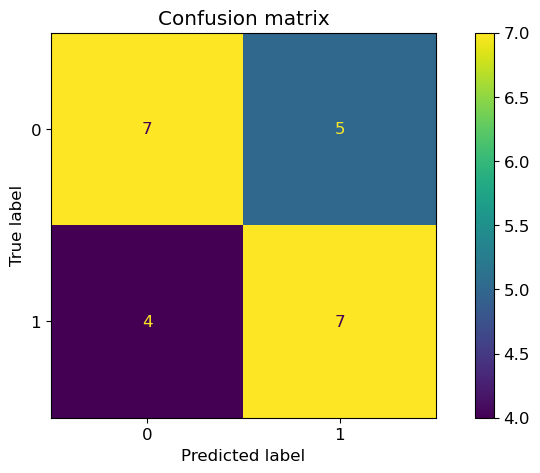

<Figure size 1000x500 with 0 Axes>

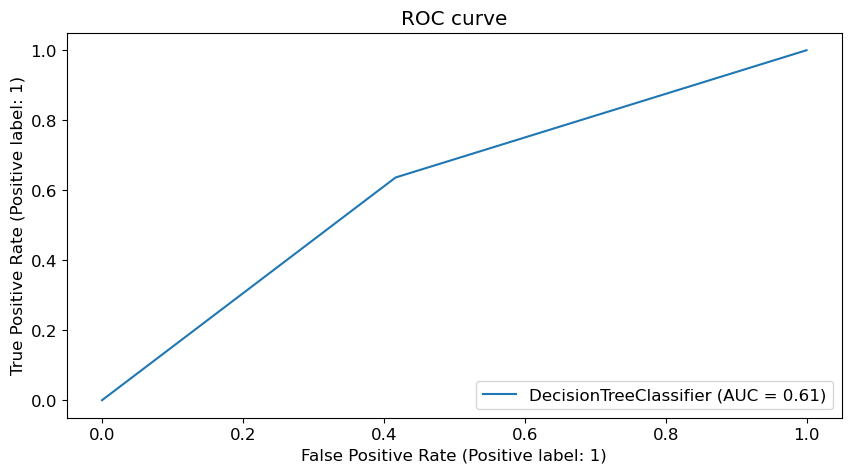

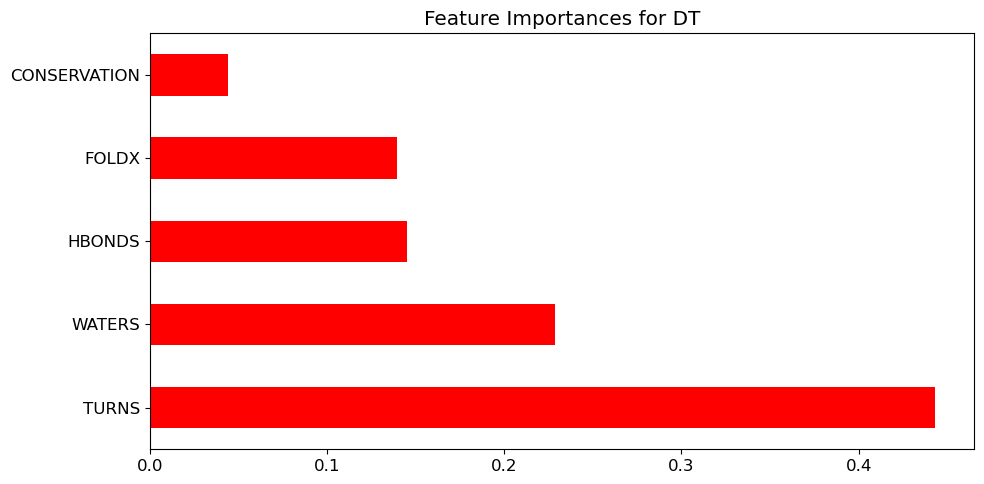

<Figure size 1000x500 with 0 Axes>

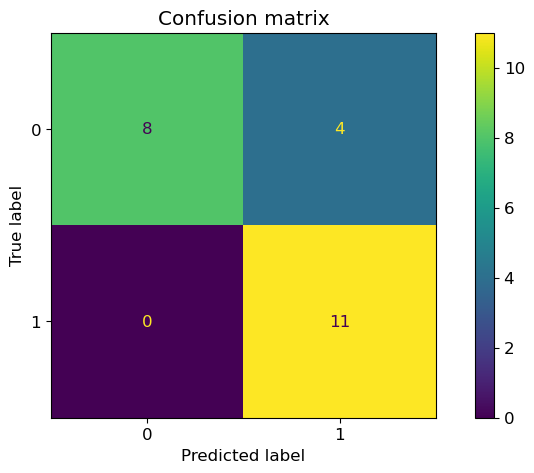

<Figure size 1000x500 with 0 Axes>

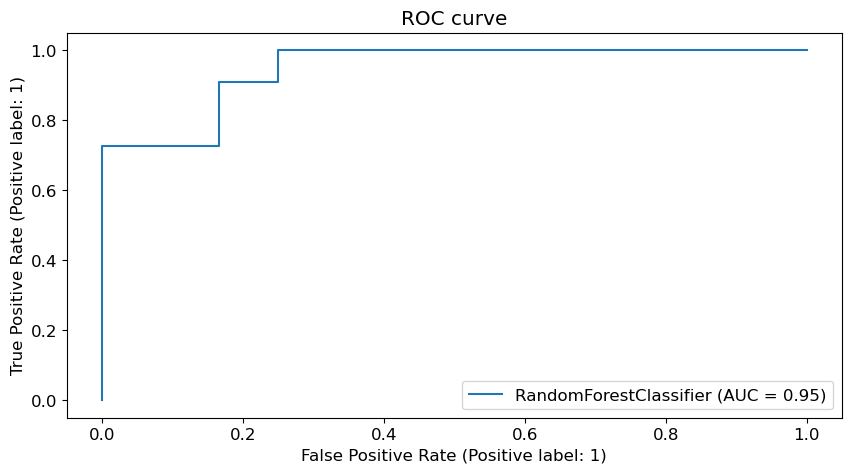

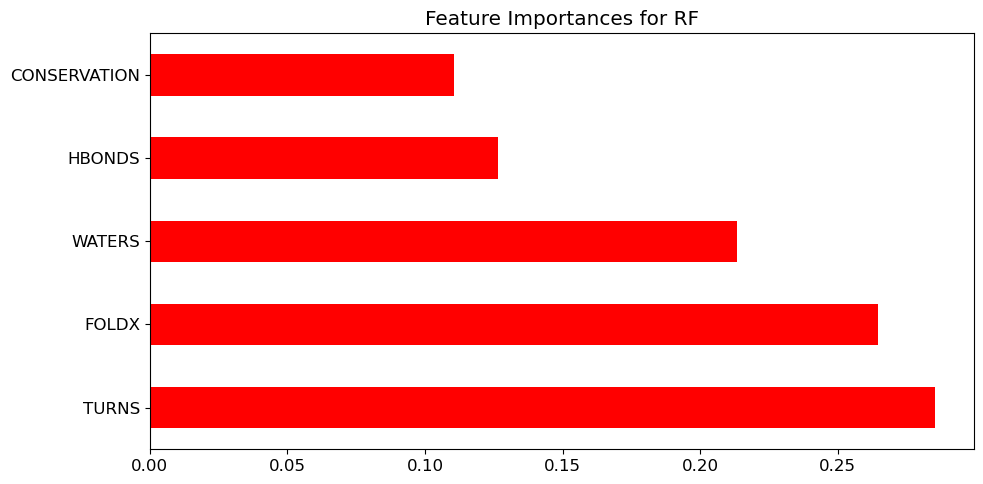

<Figure size 1000x500 with 0 Axes>

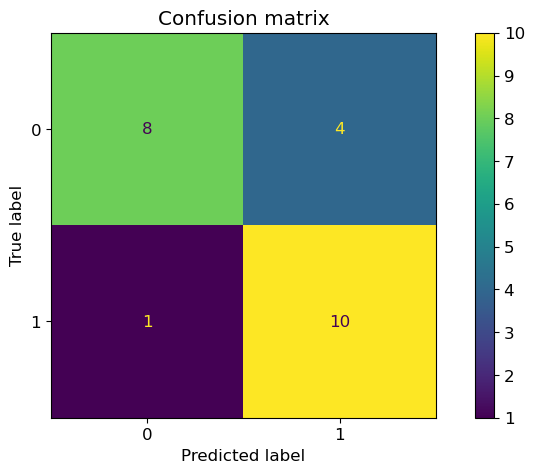

<Figure size 1000x500 with 0 Axes>

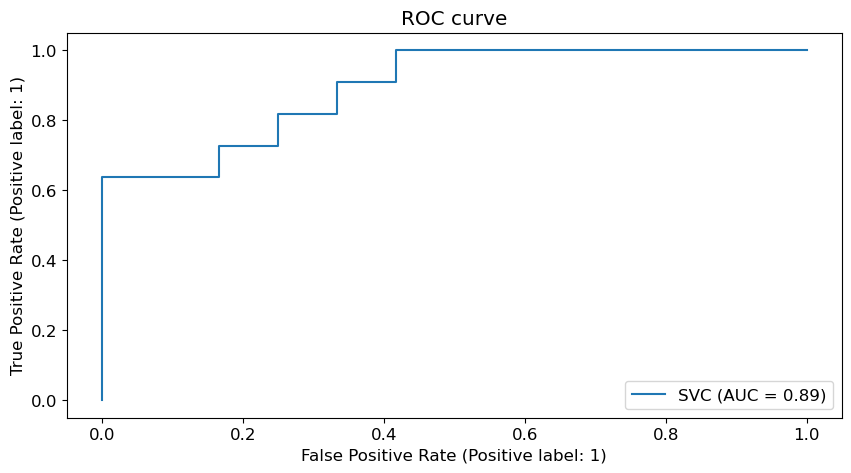

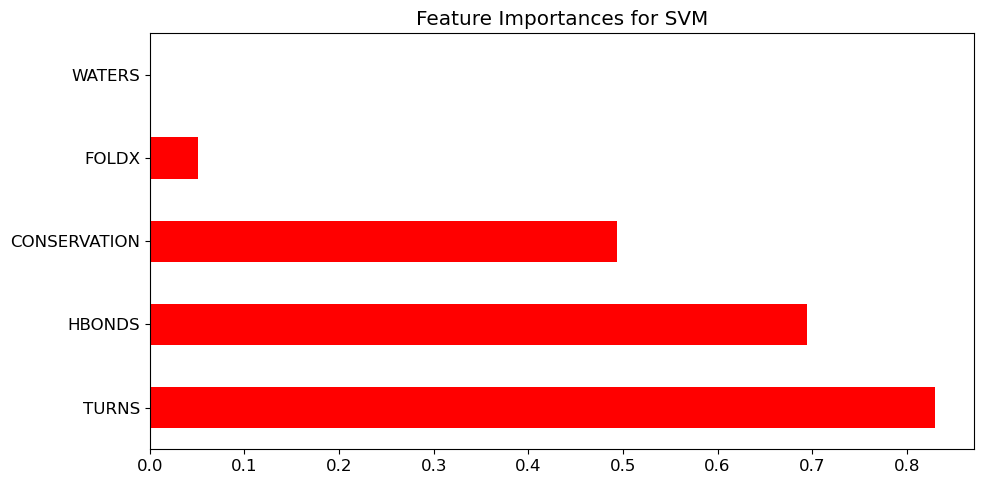

In [154]:
tagsBest=['WATERS','FOLDX','TURNS','HBONDS','CONSERVATION']
bestData={}

for clf in clfs[1:]:
    out=mlUtil.MLClassifier(df,tagsBest,output,classifier=clf,display=display,random_state=random_state) 
    bestData[clf]=out

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9423076923076923
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.56      0.75      0.64        12
    trafficking       0.57      0.36      0.44        11

       accuracy                           0.57        23
      macro avg       0.57      0.56      0.54        23
   weighted avg       0.57      0.57      0.55        23

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23

Decision tree classifier
Training sample accuracy

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anacond

k-fold crossvalidation results
[0.5        0.625      0.875      0.75       0.375      0.57142857
 0.85714286 0.42857143 0.42857143 0.71428571] 

results mean
0.6125 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.60      0.75      0.67        12
    trafficking       0.62      0.45      0.53        11

       accuracy                           0.61        23
      macro avg       0.61      0.60      0.60        23
   weighted avg       0.61      0.61      0.60        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.5        0.625      0.5        0.85714286
 0.57142857 0.71428571 0.42857143 0.71428571] 

results mean
0.6035714285714285 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.5        0.75       0.75       0.625      0.85714286
 0.57142857 0.42857143 0.71428571 0.42857143] 

results mean
0.6375000000000001 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.75      0.50      0.60        12
    trafficking       0.60      0.82      0.69        11

       accuracy                           0.65        23
      macro avg       0.68      0.66      0.65        23
   weighted avg       0.68      0.65      0.64        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.875      0.625      0.75       0.625      0.625      1.
 0.71428571 0.85714286 0.14285714 0.71428571] 

results mean
0.6928571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7115384615384616
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.73      0.67      0.70        12
    trafficking       0.67      0.73      0.70        11

       accuracy                           0.70        23
      macro avg       0.70      0.70      0.70        23
   weighted avg       0.70      0.70      0.70        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.625      0.25       0.625      0.25       0.71428571
 0.28571429 0.71428571 0.42857143 0.57142857] 

results mean
0.5214285714285715 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8076923076923077
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.33      0.50        12
    trafficking       0.58      1.00      0.73        11

       accuracy                           0.65        23
      macro avg       0.79      0.67      0.62        23
   weighted avg       0.80      0.65      0.61        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-pac

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.6730769230769231
Test Accuracy
Overall accuracy  0.6521739130434783
                 precision    recall  f1-score   support

non-trafficking       1.00      0.33      0.50        12
    trafficking       0.58      1.00      0.73        11

       accuracy                           0.65        23
      macro avg       0.79      0.67      0.62        23
   weighted avg       0.80      0.65      0.61        23

Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall 

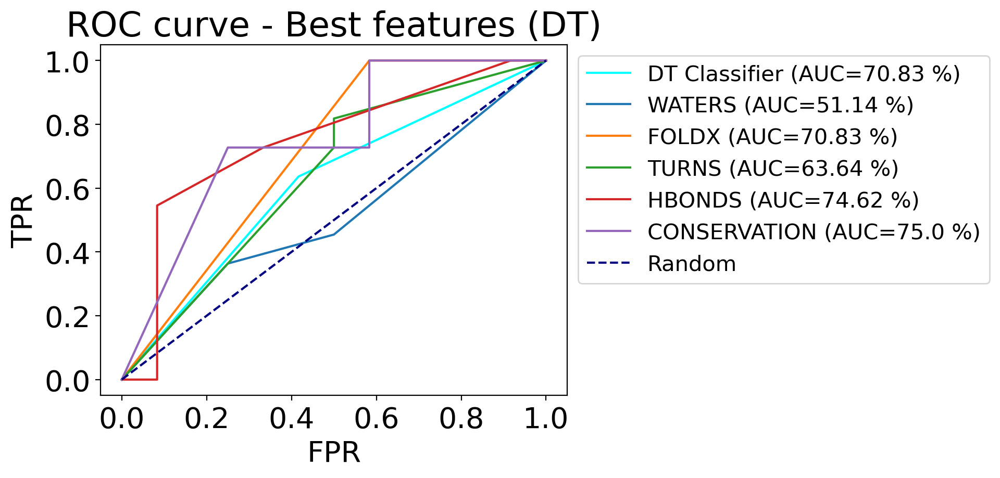

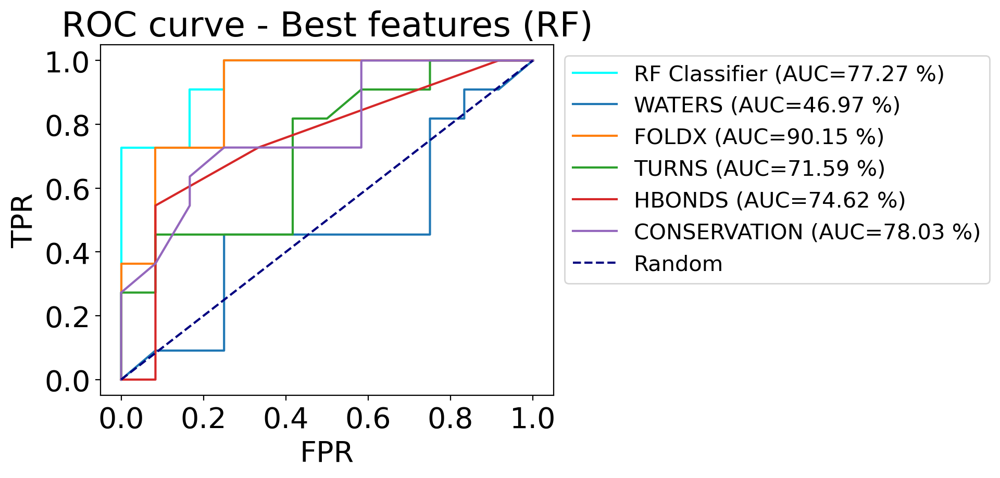

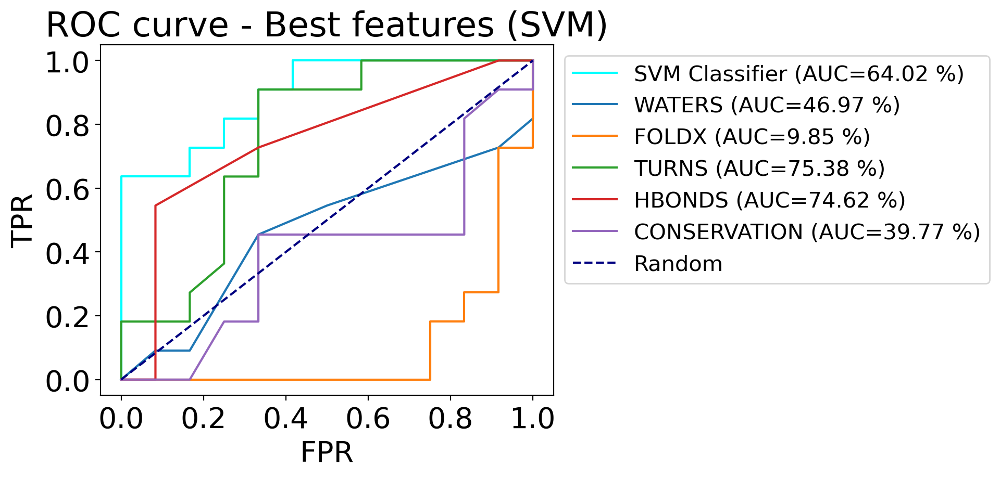

In [190]:
# plot individual features for different feature sets
rcParams['figure.dpi']=200
rcParams['font.size']=20

for clf in clfs[1:]:
    feats=tagsBest  
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - Best features ({})'.format(clf))

    # plot classifier ROC
    tpr, fpr, auc = bestData[clf]['tprs'], bestData[clf]['fprs'], bestData[clf][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC={} %)".format(clf,auc))

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feat],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        auc=np.around(auc*100,decimals=2)
        plt.plot(fpr,tpr,label="{} (AUC={} %)".format(feat, auc))

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=15)
    plt.tight_layout()
    plt.savefig('bestFeatures_{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100

### Prediction using colE data (include also variants that are pathogenic but not necessarily CII)

NOTE: G71R was used to validate the newly simulated variants

In [162]:
# column E data
#predictData = "feature_sets/cole_dataset.txt"
predictData2 = "feature_sets/features_prediction_moreVar.dat"
dfPred2=pd.read_csv(predictData2, sep="\s+", comment='#')


# additional features
feature.Calchydrophobicity(dfPred2,newTag='HYDROPHOBICITY') #use feature.py to calculate hydrophobicity (same results as original data file)
feature.CalcAPBS(dfPred2,'feature_sets/apbs_prediction_moreVar.dat',newTag="APBS")
feature.CalcSASASingleSite(dfPred2,'feature_sets/sasaSingleSite_prediction_moreVar.dat',newTag="SASASingleSite")

R92L  not found in input list
R92L  not found in input list


k-fold crossvalidation results
[0.875      0.5        0.75       1.         0.5        0.85714286
 0.57142857 0.85714286 0.71428571 0.57142857] 

results mean
0.7196428571428571 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7391304347826086


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


   VARIANT  Prediction
0     A32V           1
1     A79T           1
2     C39R           1
3     C49S           1
4     C49W           1
5     C66Y           0
6    D119H           1
7     D46E           0
8     D46N           0
9     F98L           1
10    G47C           1
11    G71R           0
12    K93R           1
13   L107P           1
14   L109R           1
15    L87R           1
16   M124I           1
17   M133T           1
18   N117S           1
19   N128S           1
20    R27L           0
21    R35L           1
22    R76H           1
23    R76L           0
24    R92H           1
25    S26C           1
26    S26G           1
27   V131A           1
28   V131L           1
29    N33T           1
30   V115M           1
31    V41I           1
32    Y43D           1


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


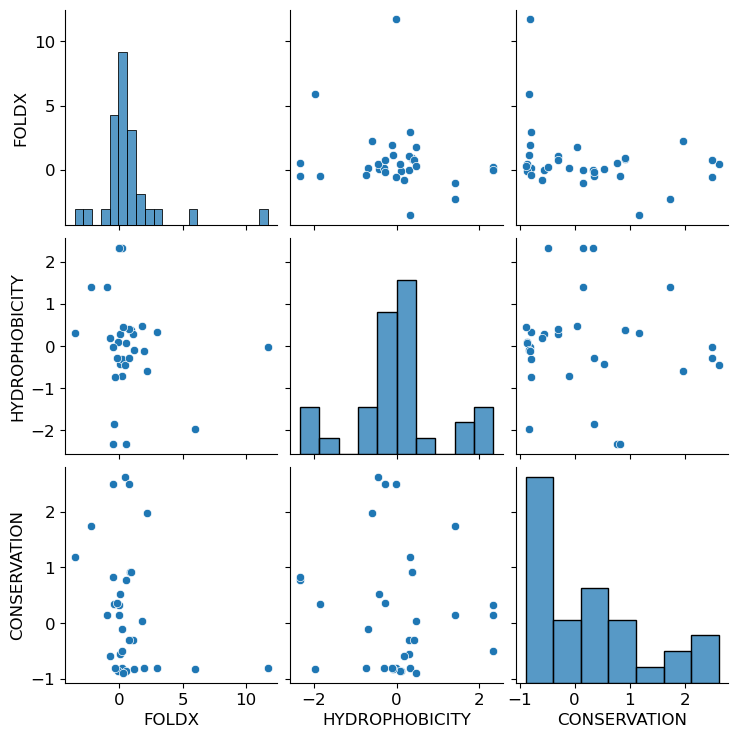

<Figure size 1000x500 with 0 Axes>

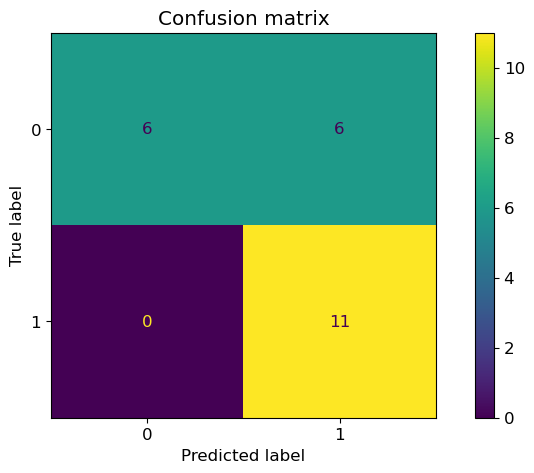

<Figure size 1000x500 with 0 Axes>

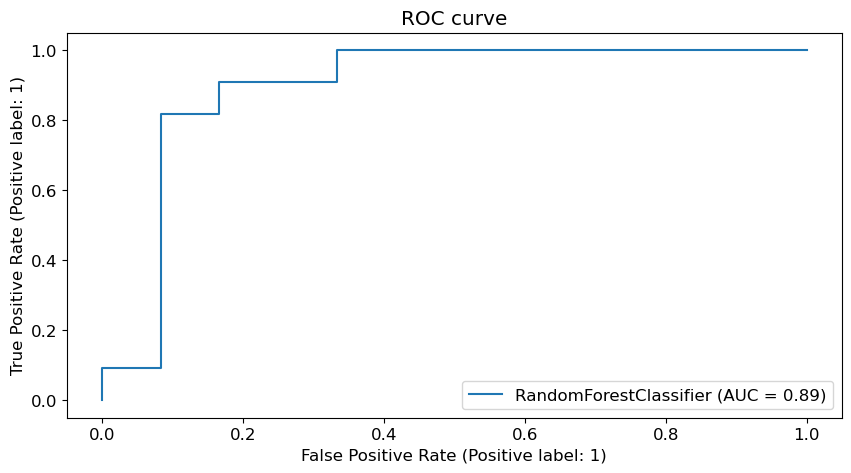

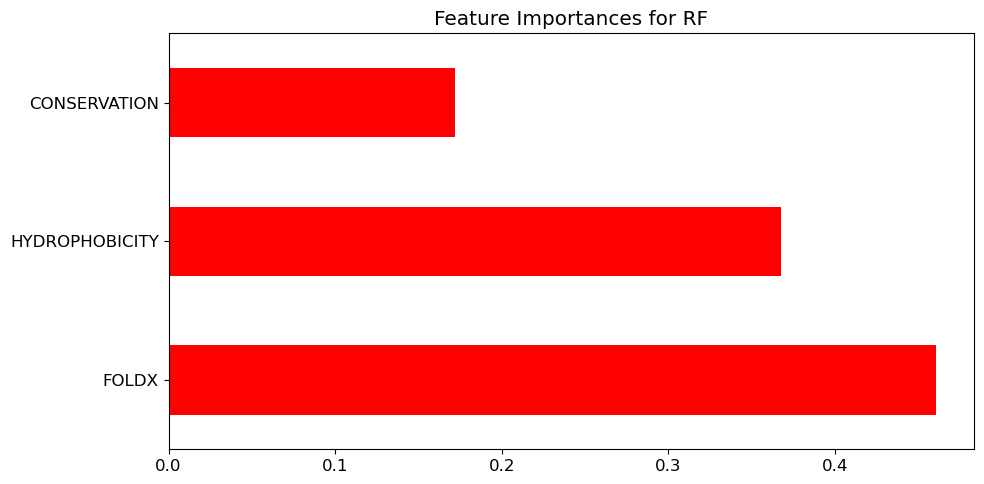

In [163]:
# trimmed feature set - Bio only
featuresPred=['FOLDX','HYDROPHOBICITY','CONSERVATION']
predictions = mlUtil.MLClassifier(df,featuresPred,output,classifier="RF",display=display,predict=True,dfPred=dfPred2) 


k-fold crossvalidation results
[0.625      0.875      0.75       0.75       0.625      1.
 0.57142857 0.57142857 0.57142857 0.71428571] 

results mean
0.7053571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


   VARIANT  Prediction
0     A32V           1
1     A79T           1
2     C39R           1
3     C49S           1
4     C49W           0
5     C66Y           0
6    D119H           1
7     D46E           1
8     D46N           0
9     F98L           1
10    G47C           1
11    G71R           0
12    K93R           1
13   L107P           1
14   L109R           1
15    L87R           1
16   M124I           1
17   M133T           1
18   N117S           1
19   N128S           1
20    R27L           1
21    R35L           1
22    R76H           1
23    R76L           1
24    R92H           0
25    S26C           1
26    S26G           1
27   V131A           1
28   V131L           1
29    N33T           1
30   V115M           1
31    V41I           1
32    Y43D           1


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


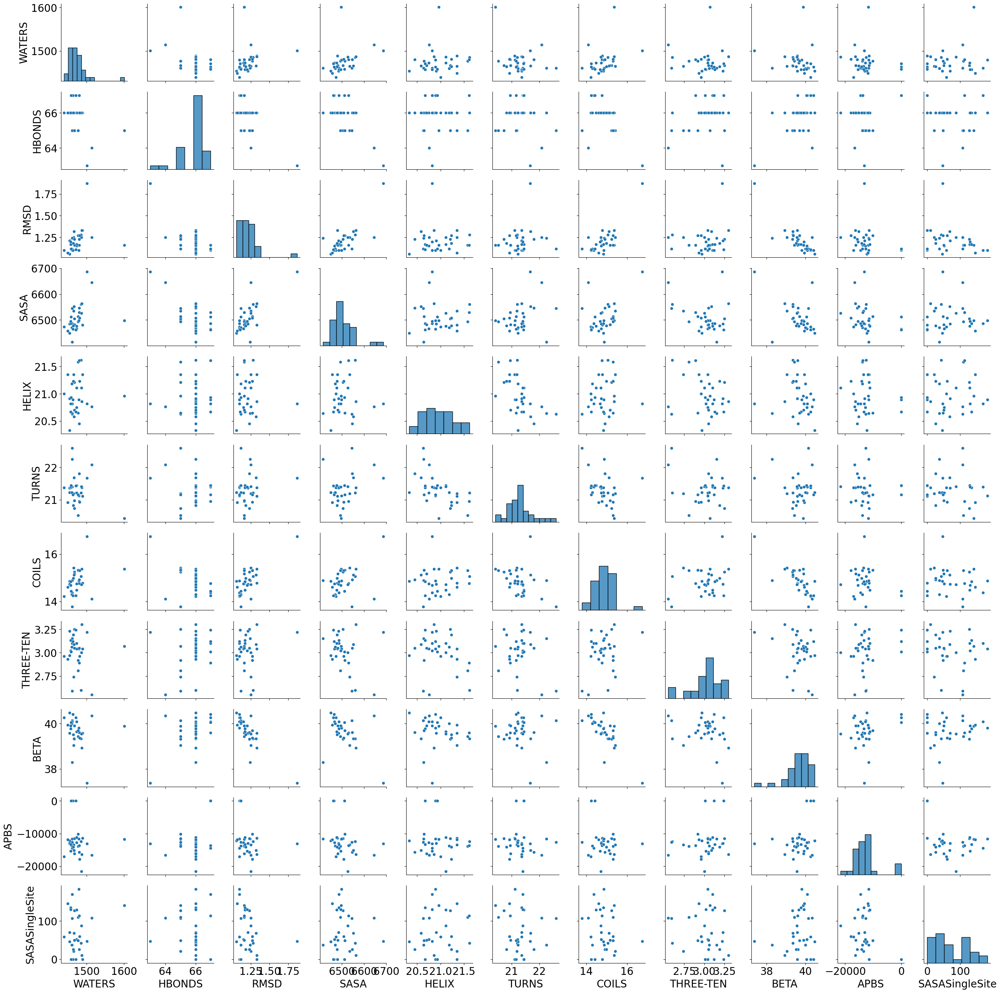

<Figure size 1000x500 with 0 Axes>

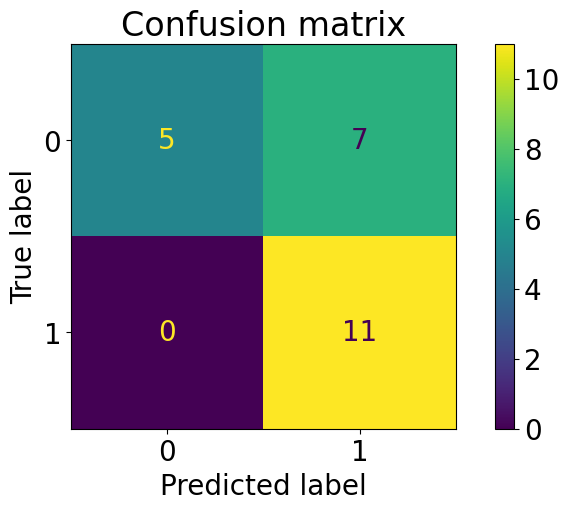

<Figure size 1000x500 with 0 Axes>

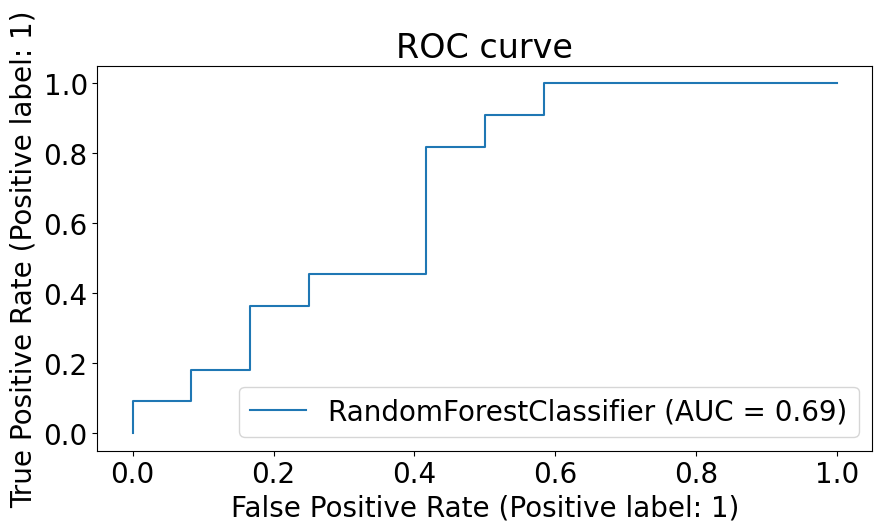

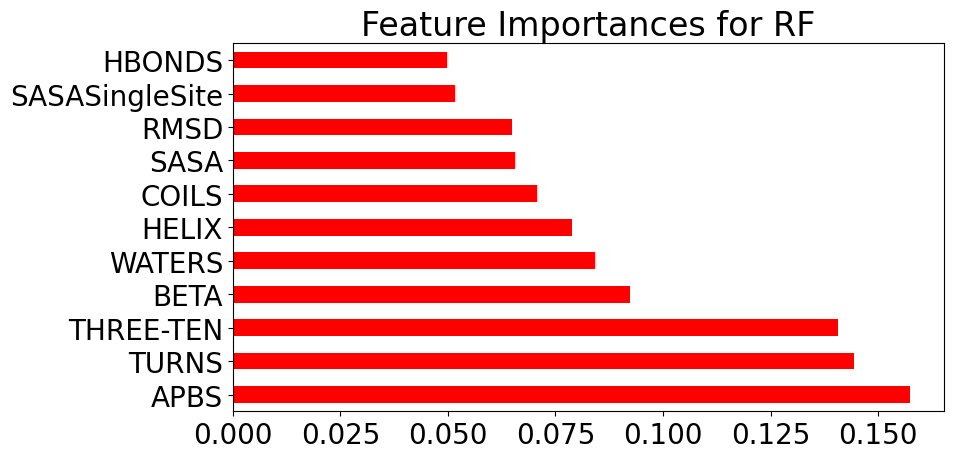

In [188]:
# trimmed feature set - MD only
featuresPred=['WATERS','HBONDS','RMSD','SASA','HELIX','TURNS','COILS','THREE-TEN','BETA','APBS','SASASingleSite']
predictions = mlUtil.MLClassifier(df,featuresPred,output,classifier="RF",display=display,predict=True,dfPred=dfPred2) 


k-fold crossvalidation results
[0.875      0.625      0.75       0.75       0.625      1.
 0.57142857 0.57142857 0.71428571 0.71428571] 

results mean
0.7196428571428571 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7391304347826086


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


   VARIANT  Prediction
0     A32V           1
1     A79T           1
2     C39R           1
3     C49S           1
4     C49W           0
5     C66Y           0
6    D119H           1
7     D46E           1
8     D46N           0
9     F98L           1
10    G47C           1
11    G71R           0
12    K93R           1
13   L107P           1
14   L109R           1
15    L87R           1
16   M124I           1
17   M133T           1
18   N117S           1
19   N128S           1
20    R27L           1
21    R35L           1
22    R76H           1
23    R76L           1
24    R92H           1
25    S26C           1
26    S26G           1
27   V131A           1
28   V131L           1
29    N33T           1
30   V115M           1
31    V41I           1
32    Y43D           1


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


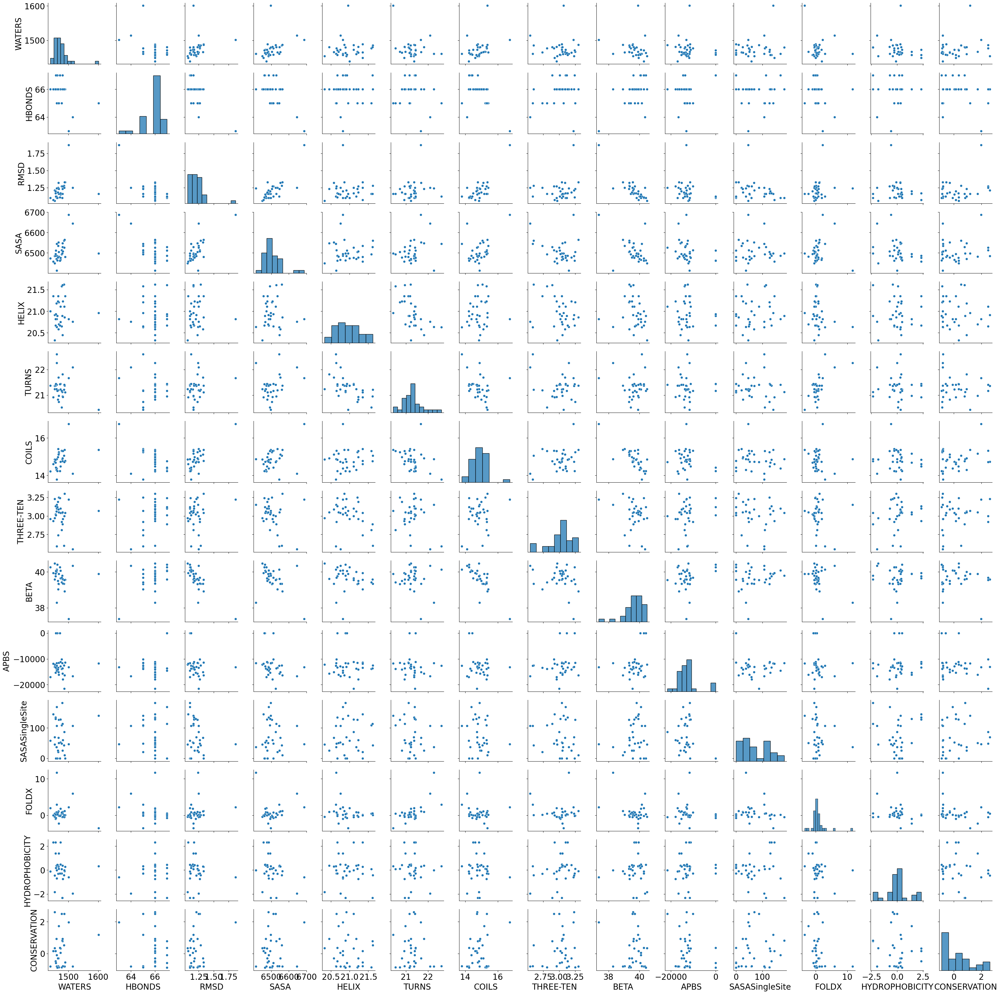

<Figure size 1000x500 with 0 Axes>

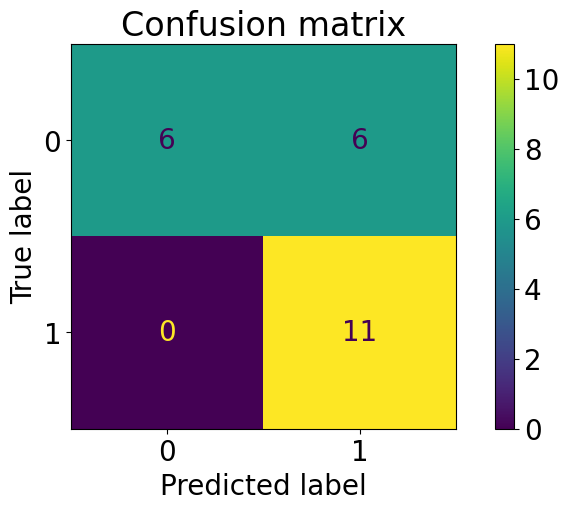

<Figure size 1000x500 with 0 Axes>

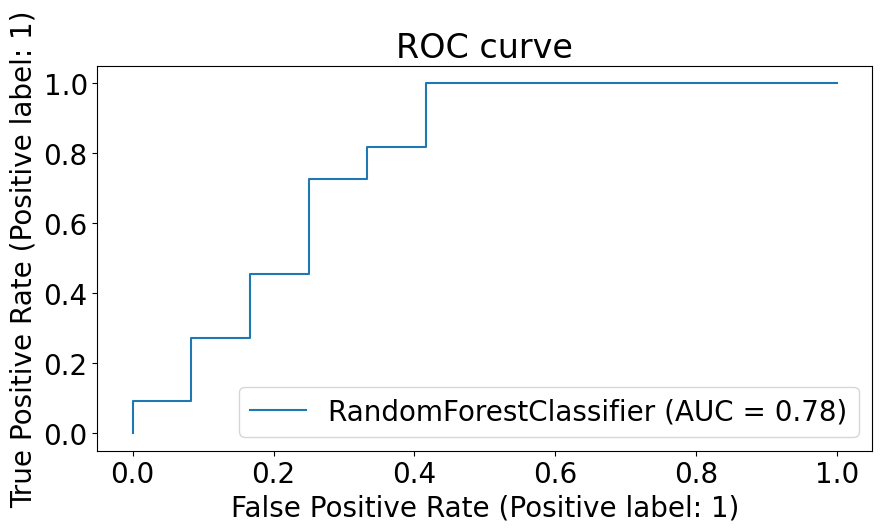

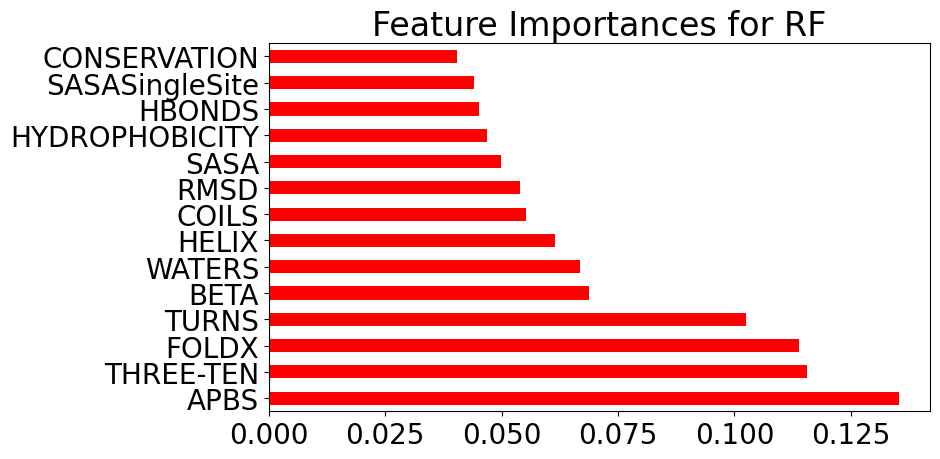

In [189]:
# trimmed feature set - All
featuresPred=['WATERS','HBONDS','RMSD','SASA','HELIX','TURNS','COILS','THREE-TEN','BETA','APBS','SASASingleSite','FOLDX','HYDROPHOBICITY','CONSERVATION']
predictions = mlUtil.MLClassifier(df,featuresPred,output,classifier="RF",display=display,predict=True,dfPred=dfPred2) 
